In [2]:
#since noteboke doesn't work in jupiterlabs    %matplotlib notebook 
%matplotlib notebook
%load_ext autoreload
%autoreload 2

In [3]:
import os
os.chdir('/home/dana_z/ssd_2TB/6OHDA')
#import mpld3
#mpld3.enable_notebook()
import numpy as np
import scipy as sci
from scipy import signal
from matplotlib import pyplot as plt
from matplotlib import gridspec
import matplotlib.colors as Mcolors
import matplotlib.cm as cmx
import sys
import h5py
from IO import *
from utils import *
from plotUtils import *
from ColorSchems import colorPallet as CP
import pptx
from pptx import Presentation 
from pptx.util import Inches
from io import BytesIO
import re
import warnings
import pandas as pd
import sqlalchemy as db
import gc
from tqdm import tqdm
import seaborn as sns
import pywt # wavelet package
import matplotlib.cm as cm

In [4]:
Files = ['FinalData_6OHDA.h5','FinalData_6OHDA_H.h5','FinalData_6OHDA_H_skip.h5','FinalData_6OHDA_skip.h5']
miceList = getMiceList(Files[0])
betaMice = ['8430','4539','7584','7909','1222']

In [5]:
#path to folder where figures should be saved
figFolder = '/home/dana_z/ssd_2TB/6OHDA/figs/aim2/'

<h2> Calculate session stats</h2>

In [5]:
df = pd.DataFrame()
periods = {'Healthy': lambda day: day== 0,
           'Two weeks':lambda day: (day >12)&(day<21),
           'One Month': lambda day: day > 20}

for per in periods.keys():
    data = getData(Files[1],['trace'],period ='Post',day =periods[per])
    for sess in data.keys():
        m = sess[:4]
        if sess[5] == 'B':
            day = 0
        else:
            day = int(re.findall(r'\d+',sess[5:])[0])
            
        if sess[-1] == 'S':
            drug = 'Saline'
        elif sess[-1] == 'L':
            drug = 'L-Dopa'
        else:
            drug = 'Amphetamine'
                

        numRed = int(data[sess]['trace']['numred'])
        cre = getCreType(Files[1],m)
        numred = int(data[sess]['trace']['numred'])
        
        df= df.append({'mouse':m,'sess':sess,'day':day,
                       'period': periodCalc(day),'cre':cre,'drug':drug,
                       'numred':numred,'numMsn':data[sess]['trace']['dff'].shape[0]},ignore_index=True)

/home/dana_z/ssd_2TB/6OHDA/IO.py:282: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  dff = hf[m][s]['traces']['dff'].value


cleaning up trace data
I deleted session: 4539_day0
I deleted session: 7584_Baseline0
I deleted session: 7584_day0
I deleted session: 7909_day0
cleaning up trace data
I deleted session: 1208_day14
I deleted session: 1222_day13
I deleted session: 1236_day13
I deleted session: 1793_day14
I deleted session: 2976_day14
I deleted session: 2980_day14
I deleted session: 2981_day14
I deleted session: 4539_day13
I deleted session: 4539_day14
I deleted session: 7584_day15
I deleted session: 7909_day13
I deleted session: 7909_day14
I deleted session: 8803_day14
I deleted session: 8815_day14
cleaning up trace data


In [6]:
df[~df.mouse.isin(['2981','2980','2976'])].groupby(['period','cre','drug']).agg([np.mean,sci.stats.sem])

day                numMsn             \
                                mean       sem        mean        sem   
period    cre drug                                                      
Day 13-20 CHI Amphetamine  14.800000  0.200000   76.000000  25.951879   
              L-Dopa       19.200000  0.200000   80.400000  24.943135   
          PV  Amphetamine  15.000000  0.000000  142.250000  42.358342   
              L-Dopa       19.000000  0.000000  132.000000  29.461840   
Healthy   CHI Amphetamine   0.000000  0.000000  140.714286  35.503665   
              L-Dopa        0.000000  0.000000  252.285714  89.909667   
              Saline        0.000000  0.000000  213.714286  69.227958   
          PV  Amphetamine   0.000000  0.000000  239.875000  59.133154   
              L-Dopa        0.000000  0.000000  123.333333  22.258581   
              Saline        0.000000  0.000000  145.333333  21.419098   
One Month CHI Amphetamine  30.600000  0.400000   97.800000  37.163692   
              L-Dopa       34.600000  0.400000   81.200000  24.990798   
          PV  Amphetamine  30.000000  0.000000  174.833333  80.607864   
              L-Dopa       34.666667  0.333333  135.333333  30.190138   

                             numred            
                               mean       sem  
period    cre drug                             
Day 13-20 CHI Amphetamine  1.200000  0.374166  
              L-Dopa       1.400000  0.600000  
          PV  Amphetamine  0.750000  0.250000  
              L-Dopa       0.666667  0.333333  
Healthy   CHI Amphetamine  1.000000  0.577350  
              L-Dopa       1.714286  0.521641  
              Saline       1.571429  0.611678  
          PV  Amphetamine  1.875000  0.610547  
              L-Dopa       1.000000  0.000000  
              Saline       1.666667  0.333333  
One Month CHI Amphetamine  0.600000  0.400000  
              L-Dopa       1.000000  0.447214  
          PV  Amphetamine  0.833333  0.307318  
              L-Dopa       1.333333  0.333333

<IPython.core.display.Javascript object>


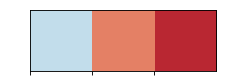

In [6]:
a3 = np.array(sns.color_palette("RdBu_r", n_colors=7))
a4 = a3[[2,5,6],:]
# a3 = np.concatenate((a3[2,:],a3[4:,:]))
colorPallet3Post =(a3[[2,5,6],:])
sns.palplot(sns.color_palette(colorPallet3Post)) 


<h2> Figures </h2>

In [58]:
data = getData(Files[1],['speed'],period ='Post', mice="8803")
list(data.keys())

cleaning up speed data
I deleted session: 8803_day10
I deleted session: 8803_day12
I deleted session: 8803_day14
I deleted session: 8803_day2
I deleted session: 8803_day4
I deleted session: 8803_day5
I deleted session: 8803_day6
I deleted session: 8803_day8


['8803_BaselineA',
 '8803_BaselineL',
 '8803_BaselineS',
 '8803_day19L',
 '8803_day30A',
 '8803_day34L']

In [86]:
speedData = []
tName = ['first','2nd','last']

miceList = getMiceList(Files[1])
for m in miceList:
    data = getData(Files[1],['speed'],period ='Post', mice=m)
    # calculte % high speed + % low speed
    for sess in data:
        # find the day of the session
        if sess[5] == 'B':
            day = 0
        else:
            day = int(re.findall(r'\d+',sess[5:])[0])
            
        if sess[-1] == 'S':
            drug = 'Saline'
        elif sess[-1] == 'L':
            drug = 'L-Dopa'
        else:
            drug = 'Amphetamine'
        
        row = {'Mouse':m,'Session':sess,'Day':day, 'Drug':drug}
        
        Hp = getOnsetOrPeriod(m,sess,'Pre','HighMvmtPeriods_vector')
        Lp = getOnsetOrPeriod(m,sess,'Pre','LowMvmtPeriods_vector')
        comb = Hp*1+((Lp*1)-1)*-1
        onset = getOnsetOrPeriod(m,sess,'Pre','mvmtOnset')
        trans = comb[1:]-comb[:-1]
        
        row['timeRange'] = 'pre'
        row['percent_low'] = np.sum(Lp*1)/len(Lp)
        row['percent_high'] = np.sum(Hp*1)/len(Hp)
        row['percent_medium'] = np.sum(comb==1)/len(comb)

        row['tran_all'] = np.sum(np.abs(trans!=0))
        row['tran_low2any'] = np.sum(np.abs(Lp[1:]*1-Lp[:-1]*1))
        row['tran_high2any'] = np.sum(np.abs(Hp[1:]*1-Hp[:-1]*1))

        row['MvmtOnset'] = np.sum(onset)
        speedData.append(row)
        
        row = {'Mouse':m,'Session':sess,'Day':day, 'Drug':drug}
        
        Hp = getOnsetOrPeriod(m,sess,'Post','HighMvmtPeriods_vector')
        Lp = getOnsetOrPeriod(m,sess,'Post','LowMvmtPeriods_vector')
        comb = Hp*1+((Lp*1)-1)*-1
        onset = getOnsetOrPeriod(m,sess,'Post','mvmtOnset')
        trans = comb[1:]-comb[:-1]
        
        row['timeRange'] = 'full'
        row['percent_low'] = np.sum(Lp*1)/len(Lp)
        row['percent_high'] = np.sum(Hp*1)/len(Hp)
        row['percent_medium'] = np.sum(comb==1)/len(comb)

        row['tran_all'] = np.sum(np.abs(trans!=0))/3
        row['tran_low2any'] = np.sum(np.abs(Lp[1:]*1-Lp[:-1]*1))/3
        row['tran_high2any'] = np.sum(np.abs(Hp[1:]*1-Hp[:-1]*1))/3

        row['MvmtOnset'] = np.sum(onset)/3
        speedData.append(row)
        
        for tp in range(3):
            row = {'Mouse':m,'Session':sess,'Day':day, 'Drug':drug}
            row['timeRange'] = tName[tp]
            row['percent_low'] = np.sum(Lp[tp*12000:np.min(((tp+1)*12000,len(Lp)))]*1)/len(Lp[tp*12000:np.min(((tp+1)*12000,len(Lp)))])
            row['percent_high'] = np.sum(Hp[tp*12000:np.min(((tp+1)*12000,len(Hp)))]*1)/len(Hp[tp*12000:np.min(((tp+1)*12000,len(Hp)))])
            row['percent_medium'] = np.sum(comb[tp*12000:np.min(((tp+1)*12000,len(comb)))]==1)/len(comb[tp*12000:np.min(((tp+1)*12000,len(comb)))])

            row['tran_all'] = np.sum(np.abs(trans[tp*12000:np.min(((tp+1)*12000,len(trans)))]!=0))
            row['tran_low2any'] = np.sum(np.abs(Lp[1+tp*12000:np.min(((tp+1)*12000,len(Lp)))]*1-Lp[tp*12000:np.min(((tp+1)*12000,len(Lp)))-1]*1))
            row['tran_high2any'] = np.sum(np.abs(Hp[1+tp*12000:np.min(((tp+1)*12000,len(Hp)))]*1-Hp[tp*12000:np.min(((tp+1)*12000,len(Hp)))-1]*1))
            row['MvmtOnset'] = np.sum(onset[tp*12000:np.min(((tp+1)*12000,len(onset)))])
            speedData.append(row)
            
        
          
df = pd.DataFrame(speedData)        
df['Period'] =  df.apply (lambda row: periodCalc(row.Day) , axis=1)
df.to_csv('lineraVelocity_post.csv')

/home/dana_z/ssd_2TB/6OHDA/IO.py:152: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  speed = hf[m][s]['mvmt']['speed'].value
/home/dana_z/ssd_2TB/6OHDA/IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value


cleaning up speed data
I deleted session: 0761_day1
I deleted session: 0761_day10
I deleted session: 0761_day12
I deleted session: 0761_day2
I deleted session: 0761_day4
I deleted session: 0761_day6
I deleted session: 0761_day8
cleaning up speed data
I deleted session: 1208_day10
I deleted session: 1208_day12
I deleted session: 1208_day14
I deleted session: 1208_day2
I deleted session: 1208_day4
I deleted session: 1208_day6
I deleted session: 1208_day8
cleaning up speed data
I deleted session: 1222_day11
I deleted session: 1222_day13
I deleted session: 1222_day2
I deleted session: 1222_day3
I deleted session: 1222_day5
I deleted session: 1222_day7
I deleted session: 1222_day9
cleaning up speed data
cleaning up speed data
I deleted session: 1236_day1
I deleted session: 1236_day11
I deleted session: 1236_day13
I deleted session: 1236_day3
I deleted session: 1236_day5
I deleted session: 1236_day7
I deleted session: 1236_day9
cleaning up speed data
cleaning up speed data
I deleted session:

/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:65: RuntimeWarning: invalid value encountered in long_scalars
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in long_scalars
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:67: RuntimeWarning: invalid value encountered in long_scalars


In [54]:
df = pd.read_csv('lineraVelocity_post.csv')
df2 = df.groupby(['Mouse','Session','Period','Drug','timeRange']).mean()
df2.reset_index(inplace=True)

#df2.head(25)
# print(df2)
columns = ['percent_low','percent_high','tran_low2any'] 
sess = "0761_BaselineA"
df3 = df2[(df2.timeRange == 'pre')]
# print(df3[(df3.Session == sess)&(df2.timeRange == 'pre')].Session.item())
# print(df2.apply(lambda row: row[columns[ind]]/df3[(df3.Session == row.Session)&(df2.timeRange == 'pre')][columns[ind]].item(),axis=1))
for ind in range(len(columns)):
    df2[columns[ind]+'_normalized'] = df2.apply(lambda row: row[columns[ind]]/df2[(df2.Session == row.Session)&(df2.timeRange == 'pre')][columns[ind]].item() if df2[(df2.Session == row.Session)&(df2.timeRange == 'pre')][columns[ind]].item() != 0 else None,axis=1)
df2.head(25)

,Mouse,Session,Period,Drug,timeRange,Unnamed: 0,Day,percent_low,percent_high,percent_medium,tran_all,tran_low2any,tran_high2any,MvmtOnset,percent_low_normalized,percent_high_normalized,tran_low2any_normalized
0,761,0761_BaselineA,Healthy,Amphetamine,2nd,3,0,0.184583,0.034000,0.781417,166.000000,136.000000,30.000000,2.000000,0.231512,0.635111,1.346535
1,761,0761_BaselineA,Healthy,Amphetamine,first,2,0,0.646083,0.042667,0.311250,175.000000,137.000000,38.000000,14.000000,0.810345,0.797003,1.356436
2,761,0761_BaselineA,Healthy,Amphetamine,full,1,0,0.338269,0.053253,0.608478,177.000000,133.666667,43.333333,6.666667,0.424271,0.994752,1.323432
3,761,0761_BaselineA,Healthy,Amphetamine,last,4,0,0.184114,0.083097,0.732789,190.000000,128.000000,62.000000,4.000000,0.230924,1.552235,1.267327
4,761,0761_BaselineA,Healthy,Amphetamine,pre,0,0,0.797294,0.053534,0.149172,131.000000,101.000000,30.000000,14.000000,1.000000,1.000000,1.000000
5,761,0761_BaselineL,Healthy,L-Dopa,2nd,8,0,0.879500,0.030667,0.089833,58.000000,41.000000,17.000000,7.000000,1.212229,0.315387,0.561644
6,761,0761_BaselineL,Healthy,L-Dopa,first,7,0,0.877417,0.043167,0.079417,94.000000,61.000000,33.000000,15.000000,1.209357,0.443941,0.835616
7,761,0761_BaselineL,Healthy,L-Dopa,full,6,0,0.868559,0.032514,0.098927,69.666667,47.666667,22.000000,10.666667,1.197149,0.334384,0.652968
8,761,0761_BaselineL,Healthy,L-Dopa,last,9,0,0.844619,0.021866,0.133515,57.000000,41.000000,16.000000,10.000000,1.164152,0.224880,0.561644
9,761,0761_BaselineL,Healthy,L-Dopa,pre,5,0,0.725523,0.097235,0.177242,139.000000,73.000000,66.000000,15.000000,1.000000,1.000000,1.000000


<IPython.core.display.Javascript object>


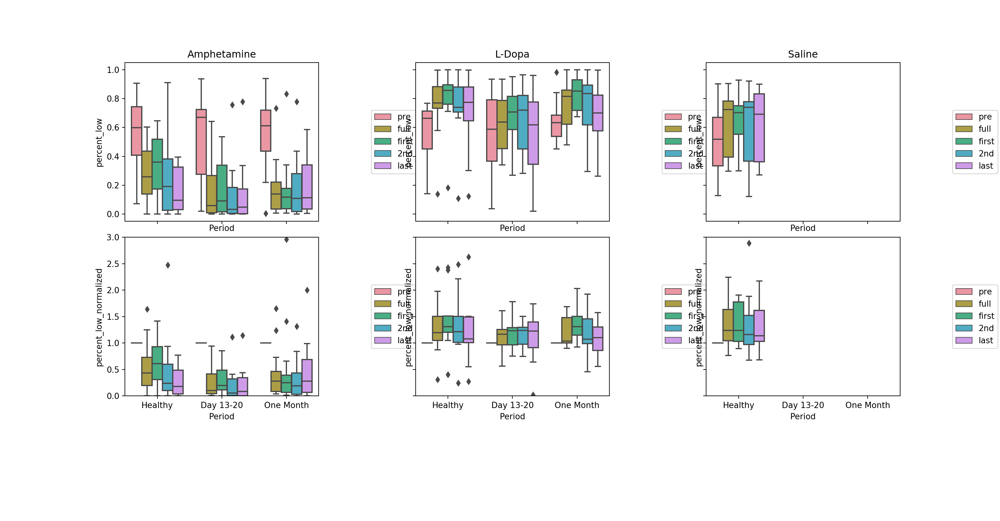

<IPython.core.display.Javascript object>


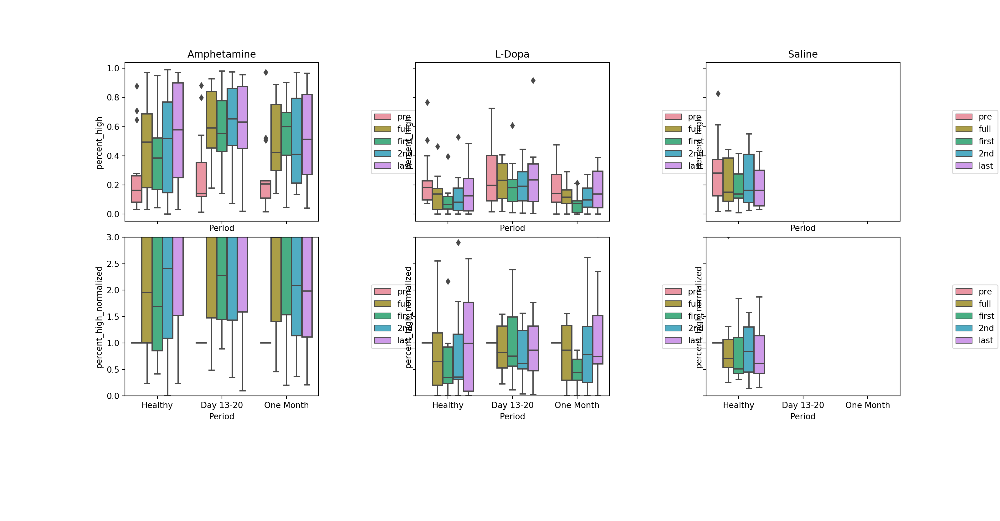

<IPython.core.display.Javascript object>


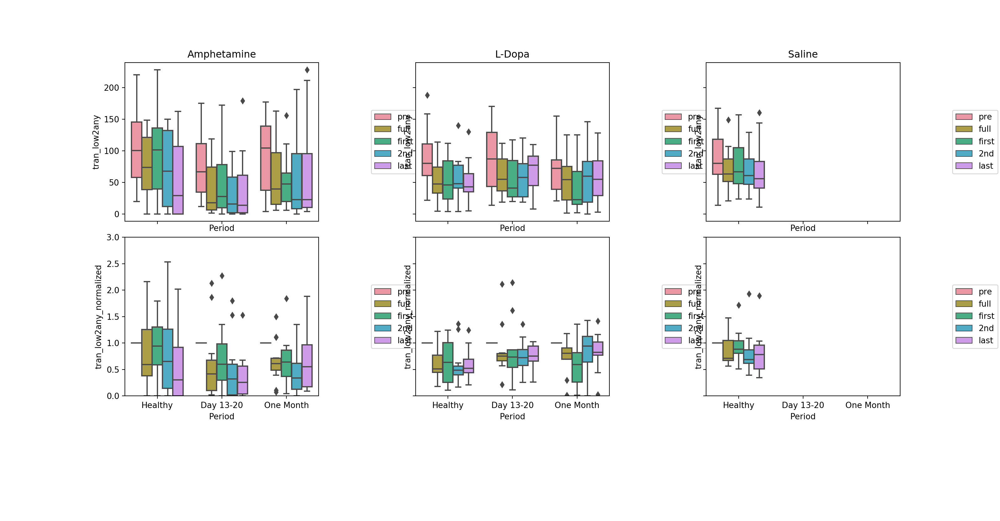

<IPython.core.display.Javascript object>


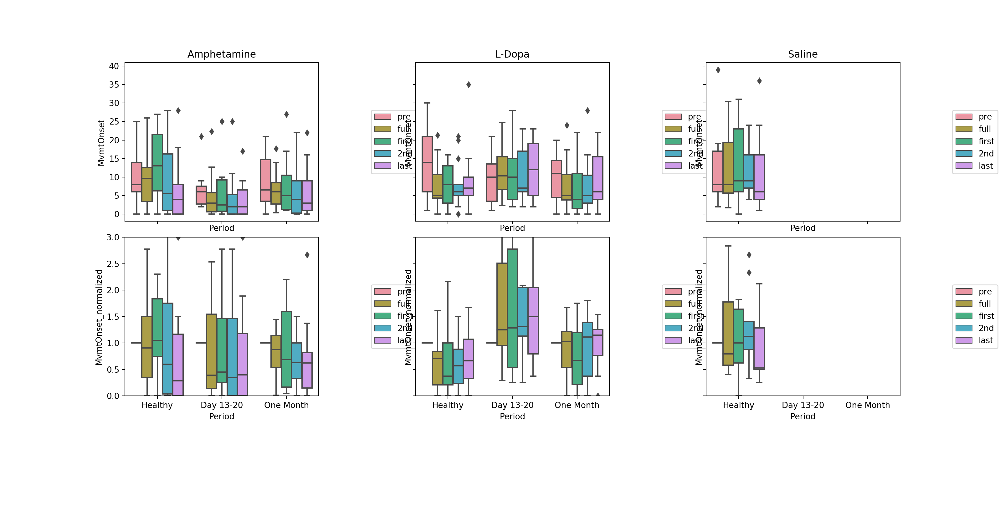

In [54]:
df2 = df.groupby(['Mouse','Session','Period','Drug','timeRange']).mean()
df2.reset_index(inplace=True)
hOrder =  ['pre','full','first','2nd','last']

pOrder = ['Healthy','Day 13-20','One Month']
with sns.color_palette(colorPallet3Post):#sns.color_palette("PuBuGn_d"):
    columns = ['percent_low','percent_high','tran_low2any','MvmtOnset'] 
    labels = ['% time in low Speed','% time in high Speed','# periods']
    for ind in range(len(columns)):
        fig, ax = plt.subplots(2,3,figsize=(17.04,8.88),gridspec_kw = {'hspace':.1,'wspace':.5,'bottom':0.24}, sharex = True,sharey = 'row')
        df2[columns[ind]+'_normalized'] = df2.apply(lambda row: row[columns[ind]]/df2[(df2.Session == row.Session)&(df2.timeRange == 'pre')][columns[ind]].item() if df2[(df2.Session == row.Session)&(df2.timeRange == 'pre')][columns[ind]].item() != 0 else None,axis=1)
        for dInd, d in enumerate(df2.Drug.unique()):
            g1 = sns.boxplot(x="Period", y=columns[ind],hue = 'timeRange',ax = ax[0,dInd],
                        data=df2[df2.Drug == d],order = pOrder,hue_order =hOrder)
            g1.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
            g = sns.boxplot(x="Period", y=columns[ind]+'_normalized',hue = 'timeRange',ax = ax[1,dInd],
                        data=df2[df2.Drug == d],order = pOrder,hue_order = hOrder)
            g.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
#         sns.boxplot(x="Period", y=columns[ind], data=df2[],ax =ax[ind],order = pOrder)
#         #sns.scatterplot(x="Period", y=columns[ind], data=df2,ax =ax[ind])
            ax[0,dInd].set_title(d)
            ax[1,dInd].set_ylim([0,3])
#         ax[ind].set_ylabel(labels[ind],fontsize=20)
#         ax[ind].set_xlabel("")
        
        fig.savefig(figFolder+columns[ind]+'.png',transparent=False,format='png')
# fig.savefig(figFolder+'figure2_b1.svg',transparent=True,format='svg')


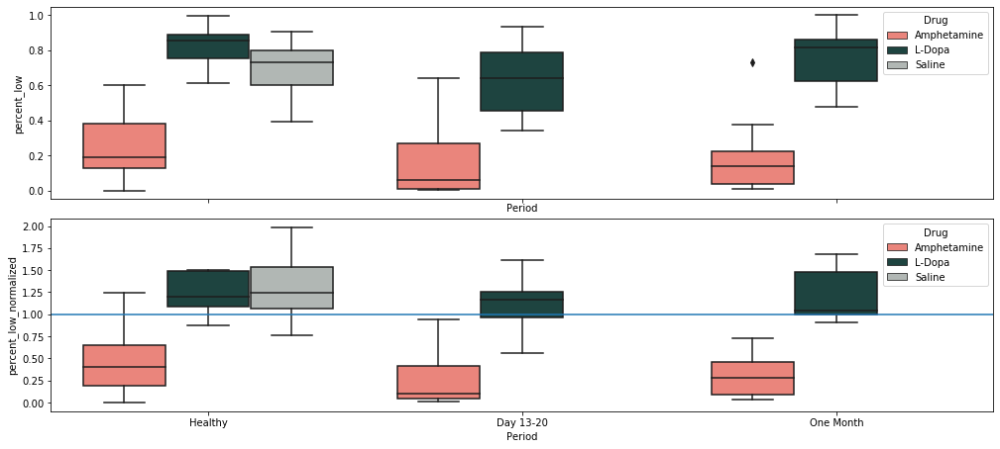

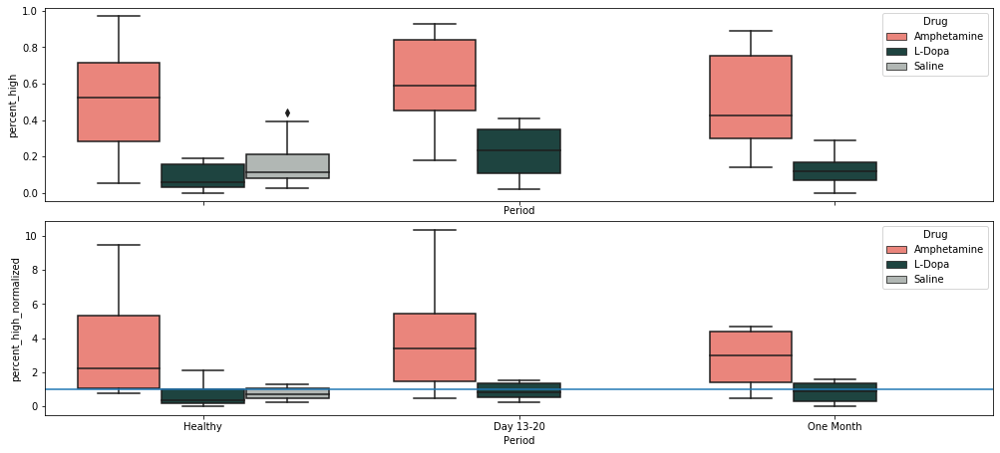

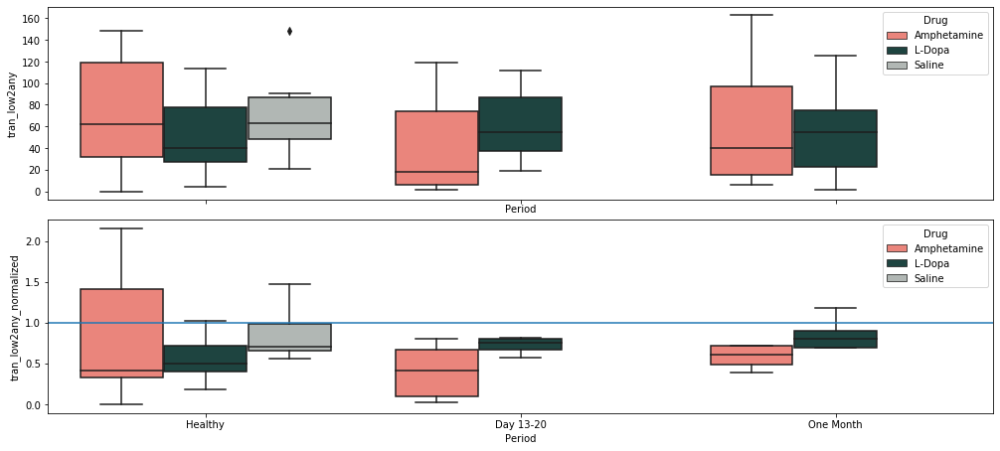

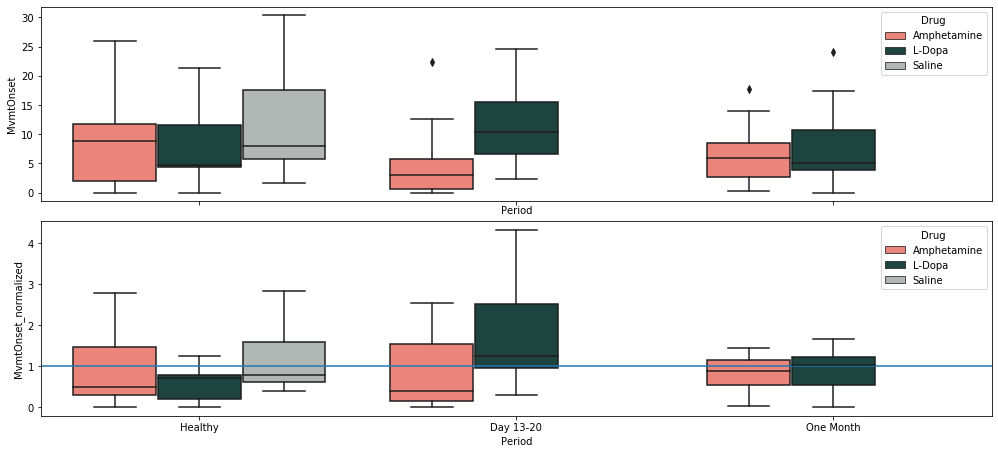

In [55]:
df2 = df.groupby(['Mouse','Session','Period','Drug','timeRange']).mean()
df2.reset_index(inplace=True)
hOrder =  ['pre','full','first','2nd','last']

df2 = df2[(~df2.Mouse.isin(['1253','1231']))&(df2.timeRange.isin(['pre','full']))]

pOrder = ['Healthy','Day 13-20','One Month']
columns = ['percent_low','percent_high','tran_low2any','MvmtOnset'] 
labels = ['% time in low Speed','% time in high Speed','# periods']
for ind in range(len(columns)):
    fig, ax = plt.subplots(2,1,figsize=(17.04,8.88),gridspec_kw = {'hspace':.1,'wspace':.5,'bottom':0.24}, sharex = True,sharey = 'row')
    df2[columns[ind]+'_normalized'] = df2.apply(lambda row: row[columns[ind]]/df2[(df2.Session == row.Session)&(df2.timeRange == 'pre')][columns[ind]].item() if df2[(df2.Session == row.Session)&(df2.timeRange == 'pre')][columns[ind]].item() != 0 else None,axis=1)       
    g1 = sns.boxplot(x="Period", y=columns[ind],hue = 'Drug',ax = ax[0],palette = ['#FC766AFF','#184A45FF','#B0B8B4FF'],
                data=df2[df2.timeRange == 'full'],order = pOrder)
#     g1.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
    g = sns.boxplot(x="Period", y=columns[ind]+'_normalized',hue = 'Drug',ax = ax[1],palette = ['#FC766AFF','#184A45FF','#B0B8B4FF'],
                data=df2[df2.timeRange == 'full'],order = pOrder, showfliers = False)
    ax[1].axhline(1)
#     g.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
#         sns.boxplot(x="Period", y=columns[ind], data=df2[],ax =ax[ind],order = pOrder)
#         #sns.scatterplot(x="Period", y=columns[ind], data=df2,ax =ax[ind])
#             ax[1,dInd].set_ylim([0,3])
#         ax[ind].set_ylabel(labels[ind],fontsize=20)
#         ax[ind].set_xlabel("")

    fig.savefig(figFolder+columns[ind]+'_full.png',transparent=False,format='png')
# fig.savefig(figFolder+'figure2_b1.svg',transparent=True,format='svg')


In [57]:
df2.to_csv('aim2_mvmt.csv')

<IPython.core.display.Javascript object>


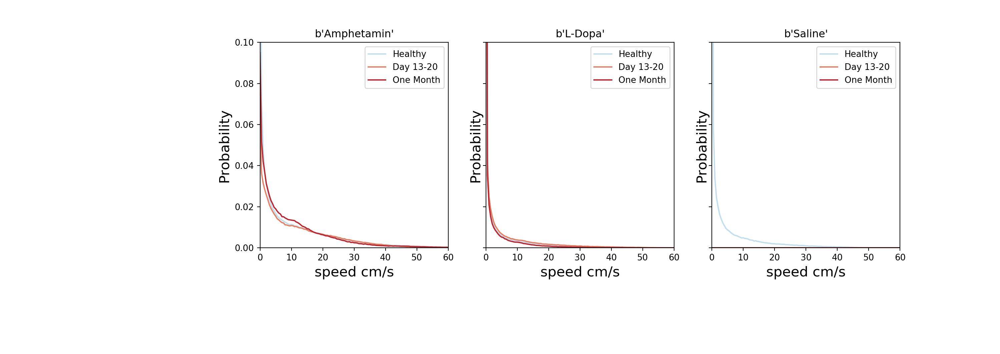

/home/dana_z/ssd_2TB/6OHDA/IO.py:152: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  speed = hf[m][s]['mvmt']['speed'].value
/home/dana_z/ssd_2TB/6OHDA/IO.py:152: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  speed = hf[m][s]['mvmt']['speed'].value


cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up

/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in true_divide
/home/dana_z/ssd_2TB/6OHDA/IO.py:152: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  speed = hf[m][s]['mvmt']['speed'].value
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in true_divide
/home/dana_z/ssd_2TB/6OHDA/IO.py:152: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  speed = hf[m][s]['mvmt']['speed'].value
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in true_divide
/home/dana_z/ssd_2TB/6OHDA/IO.py:152: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  speed = hf[m][s]['mvmt']['speed'].value
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value

cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up

/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in true_divide
/home/dana_z/ssd_2TB/6OHDA/IO.py:152: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  speed = hf[m][s]['mvmt']['speed'].value
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in true_divide
/home/dana_z/ssd_2TB/6OHDA/IO.py:152: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  speed = hf[m][s]['mvmt']['speed'].value
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in true_divide
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in true_divide


cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data


In [9]:
periods = {'Healthy':lambda x: x==0,
           'Day 13-20':lambda x: (x>12) & (x<21),
           'One Month':lambda x: x>21}
drugs = [b'Amphetamin',b'L-Dopa',b'Saline']
fig, ax = plt.subplots(1,3,figsize=(15.99,5.67),gridspec_kw = {'hspace':.1,'bottom':0.3,'left':.26},
                       sharex = True,sharey = True)
for indP,p in enumerate(periods.keys()):
    #to make sure mice are equally represented in each period
    for d in range(0,3):
        weightsH = np.zeros((199,))
        for m in miceList:
            dataH = getData(Files[1],['speed'],period ='Post', day = periods[p],mice = m,drug =drugs[d] )
            speedM = np.empty((1,0))
            for sess in dataH:
                speedM = np.concatenate((speedM, dataH[sess]['speed']['speed']), axis=1)
            hist, bin_edges = np.histogram(speedM, bins=np.arange(0,200)*0.5)
            hist  = hist/np.nansum(hist) # normalize per mouse
            weightsH = np.nansum((weightsH, hist),axis=0)

        ax[d].plot(np.arange(0,199)*0.5,weightsH/16,label=p,color=a4[indP,:])    
        ax[d].set_xlim(0,60)
        ax[d].set_ylim(0,0.1)
        ax[d].set_xlabel('speed cm/s',fontsize=16)
        ax[d].set_ylabel('Probability',fontsize=16)
        ax[d].legend(fontsize=10)
        ax[d].set_title(drugs[d])
        fig.savefig(figFolder+'speedProbablity_full.png',transparent=False,format='png')
# fig.savefig(figFolder+'figure2_b2.svg',transparent=True,format='svg')

<IPython.core.display.Javascript object>


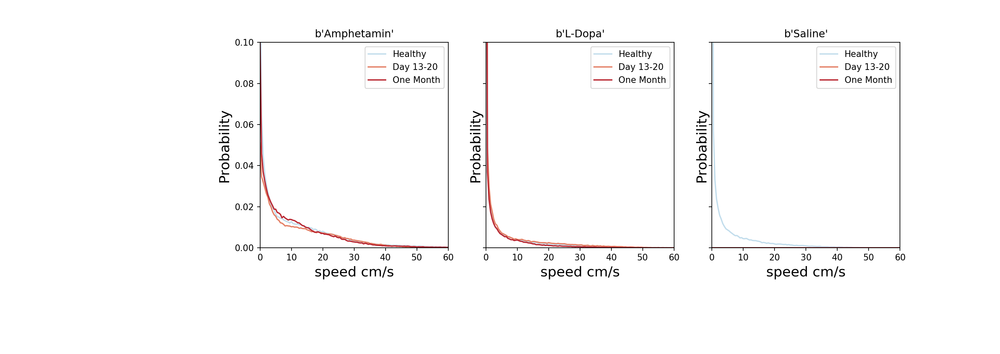

/home/dana_z/ssd_2TB/6OHDA/IO.py:152: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  speed = hf[m][s]['mvmt']['speed'].value
/home/dana_z/ssd_2TB/6OHDA/IO.py:152: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  speed = hf[m][s]['mvmt']['speed'].value
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in true_divide


cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up

/home/dana_z/ssd_2TB/6OHDA/IO.py:152: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  speed = hf[m][s]['mvmt']['speed'].value
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in true_divide
/home/dana_z/ssd_2TB/6OHDA/IO.py:152: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  speed = hf[m][s]['mvmt']['speed'].value
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in true_divide


cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data


/home/dana_z/ssd_2TB/6OHDA/IO.py:152: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  speed = hf[m][s]['mvmt']['speed'].value
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in true_divide
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in true_divide


cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data


/home/dana_z/ssd_2TB/6OHDA/IO.py:152: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  speed = hf[m][s]['mvmt']['speed'].value
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in true_divide
/home/dana_z/ssd_2TB/6OHDA/IO.py:152: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  speed = hf[m][s]['mvmt']['speed'].value
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in true_divide


cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data


/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in true_divide


In [10]:
periods = {'Healthy':lambda x: x==0,
           'Day 13-20':lambda x: (x>12) & (x<21),
           'One Month':lambda x: x>21}
drugs = [b'Amphetamin',b'L-Dopa',b'Saline']
fig, ax = plt.subplots(1,3,figsize=(15.99,5.67),gridspec_kw = {'hspace':.1,'bottom':0.3,'left':.26},
                       sharex = True,sharey = True)
for indP,p in enumerate(periods.keys()):
    #to make sure mice are equally represented in each period
    for d in range(0,3):
        weightsH = np.zeros((199,))
        for m in miceList:
            dataH = getData(Files[1],['speed'],period ='Post', day = periods[p],mice = m,drug =drugs[d] )
            speedM = np.empty((1,0))
            for sess in dataH:
                speedM = np.concatenate((speedM, dataH[sess]['speed']['speed'][:,-12000:]), axis=1)
            hist, bin_edges = np.histogram(speedM, bins=np.arange(0,200)*0.5)
            hist  = hist/np.nansum(hist) # normalize per mouse
            weightsH = np.nansum((weightsH, hist),axis=0)

        ax[d].plot(np.arange(0,199)*0.5,weightsH/16,label=p,color=a4[indP,:])    
        ax[d].set_xlim(0,60)
        ax[d].set_ylim(0,0.1)
        ax[d].set_xlabel('speed cm/s',fontsize=16)
        ax[d].set_ylabel('Probability',fontsize=16)
        ax[d].legend(fontsize=10)
        ax[d].set_title(drugs[d])
        fig.savefig(figFolder+'speedProbablity_last.png',transparent=False,format='png')
#fig.savefig(figFolder+'figure2_b2.png',transparent=False,format='png')
# fig.savefig(figFolder+'figure2_b2.svg',transparent=True,format='svg')

In [38]:
rotData = []
tName = ['first','2nd','last']


miceList = getMiceList(Files[1])
for m in miceList:
    data = getData(Files[1],['rot'],period ='Post', mice=m)
    
    # calculte % high rot + % low rot
    for sess in data:
        # find the day of the session
        if sess[5] == 'B':
            day = 0
        else:
            day = int(re.findall(r'\d+',sess[5:])[0])
            
        if sess[-1] == 'S':
            drug = 'Saline'
        elif sess[-1] == 'L':
            drug = 'L-Dopa'
        else:
            drug = 'Amphetamine'
        
        row = {'Mouse':m,'Session':sess,'Day':day,'Drug':drug}
        row['timeRange'] = 'pre'
        hACp = getOnsetOrPeriod(m,sess,'Pre','hiACRotPeriods_vector')
        hCp = getOnsetOrPeriod(m,sess,'Pre','hiCRotPeriods_vector')
        Lp = getOnsetOrPeriod(m,sess,'Pre','loRotPeriods_vector')
        comb = hACp*8+Lp*5+hCp*7
                
        row['percent_low'] = np.mean(Lp*1)
        row['percent_high_AC'] = np.mean(hACp*1)
        row['percent_high_C'] = np.mean(hCp*1)
        row['percent_non'] = np.mean(comb==0)
        
        trans = comb[1:]-comb[:-1]
        
        row['trans'] = np.mean(trans!=0)
        row['tran_low2high'] = np.mean(trans>0)
        row['tran_high2low'] = np.mean(trans<0)
        Rons = getOnsetOrPeriod(m,sess,'Pre','rotOnset')
        cRons = getOnsetOrPeriod(m,sess,'Pre','clockWiseOnset')
        acRons = getOnsetOrPeriod(m,sess,'Pre','antiClockWiseOnset')
        row['rotOnset'] = np.sum(Rons)
        row['cRotOnset'] = np.sum(cRons)
        row['acRotOnset'] = np.sum(acRons)
        
        rotData.append(row)
        
        row = {'Mouse':m,'Session':sess,'Day':day,'Drug':drug}
        row['timeRange'] = 'full'
        hACp = getOnsetOrPeriod(m,sess,'Post','hiACRotPeriods_vector')
        hCp = getOnsetOrPeriod(m,sess,'Post','hiCRotPeriods_vector')
        Lp = getOnsetOrPeriod(m,sess,'Post','loRotPeriods_vector')
        comb = hACp*8+Lp*5+hCp*7
                
        row['percent_low'] = np.mean(Lp*1)
        row['percent_high_AC'] = np.mean(hACp*1)
        row['percent_high_C'] = np.mean(hCp*1)
        row['percent_non'] = np.mean(comb==0)
        
        trans = comb[1:]-comb[:-1]
        
        row['trans'] = np.mean(trans!=0)
        row['tran_low2high'] = np.mean(trans>0)
        row['tran_high2low'] = np.mean(trans<0)
        Rons = getOnsetOrPeriod(m,sess,'Post','rotOnset')
        cRons = getOnsetOrPeriod(m,sess,'Post','clockWiseOnset')
        acRons = getOnsetOrPeriod(m,sess,'Post','antiClockWiseOnset')
        row['rotOnset'] = np.sum(Rons)/ (len(Rons)//12000)
        row['cRotOnset'] = np.sum(cRons)/(len(cRons)//12000)
        row['acRotOnset'] = np.sum(acRons)/(len(acRons)//12000)
        
        rotData.append(row)
        for tp in range(3):
            row = {'Mouse':m,'Session':sess,'Day':day, 'Drug':drug}
            row['timeRange'] = tName[tp]
            row['percent_low'] = np.mean(Lp[tp*12000:np.min(((tp+1)*12000,len(Lp)))]*1)
            row['percent_high_AC'] = np.mean(hACp[tp*12000:np.min(((tp+1)*12000,len(Lp)))]*1)
            row['percent_high_C'] = np.mean(hCp[tp*12000:np.min(((tp+1)*12000,len(Lp)))]*1)
            row['percent_non'] = np.mean(comb[tp*12000:np.min(((tp+1)*12000,len(Lp)))]==0)
            
            row['tran_low2high'] = np.mean(trans[tp*12000:np.min(((tp+1)*12000,len(trans)))]>0)
            row['tran_high2low'] = np.mean(trans[tp*12000:np.min(((tp+1)*12000,len(trans)))]<0)
            row['rotOnset'] = np.sum(Rons[tp*12000:np.min(((tp+1)*12000,len(Rons)))]) 
            row['cRotOnset'] = np.sum(cRons[tp*12000:np.min(((tp+1)*12000,len(cRons)))])
            row['acRotOnset'] = np.sum(acRons[tp*12000:np.min(((tp+1)*12000,len(acRons)))])
            rotData.append(row)
          
dfRot = pd.DataFrame(rotData) 
dfRot['Period'] =  dfRot.apply (lambda row: periodCalc(row.Day) , axis=1)
dfRot.to_csv('postRotationDf.csv')

/home/dana_z/ssd_2TB/6OHDA/IO.py:245: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  rot = hf[m][s]['mvmt']['rotation'].value
/home/dana_z/ssd_2TB/6OHDA/IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value


cleaning up rot data
I deleted session: 0761_day1
I deleted session: 0761_day10
I deleted session: 0761_day12
I deleted session: 0761_day2
I deleted session: 0761_day4
I deleted session: 0761_day6
I deleted session: 0761_day8
cleaning up rot data
I deleted session: 1208_day10
I deleted session: 1208_day12
I deleted session: 1208_day14
I deleted session: 1208_day2
I deleted session: 1208_day4
I deleted session: 1208_day6
I deleted session: 1208_day8
cleaning up rot data
I deleted session: 1222_day11
I deleted session: 1222_day13
I deleted session: 1222_day2
I deleted session: 1222_day3
I deleted session: 1222_day5
I deleted session: 1222_day7
I deleted session: 1222_day9
cleaning up rot data
cleaning up rot data
I deleted session: 1236_day1
I deleted session: 1236_day11
I deleted session: 1236_day13
I deleted session: 1236_day3
I deleted session: 1236_day5
I deleted session: 1236_day7
I deleted session: 1236_day9
cleaning up rot data
cleaning up rot data
I deleted session: 1793_day10
I 

/home/dana_z/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/dana_z/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


cleaning up rot data
I deleted session: 8430_day1
I deleted session: 8430_day11
I deleted session: 8430_day3
I deleted session: 8430_day5
I deleted session: 8430_day7
I deleted session: 8430_day9
cleaning up rot data
I deleted session: 8803_day10
I deleted session: 8803_day12
I deleted session: 8803_day14
I deleted session: 8803_day2
I deleted session: 8803_day4
I deleted session: 8803_day5
I deleted session: 8803_day6
I deleted session: 8803_day8
cleaning up rot data
I deleted session: 8815_day10
I deleted session: 8815_day12
I deleted session: 8815_day14
I deleted session: 8815_day2
I deleted session: 8815_day4
I deleted session: 8815_day6
I deleted session: 8815_day8


In [28]:
print(12000//12000,24500//12000)

1 2


<IPython.core.display.Javascript object>


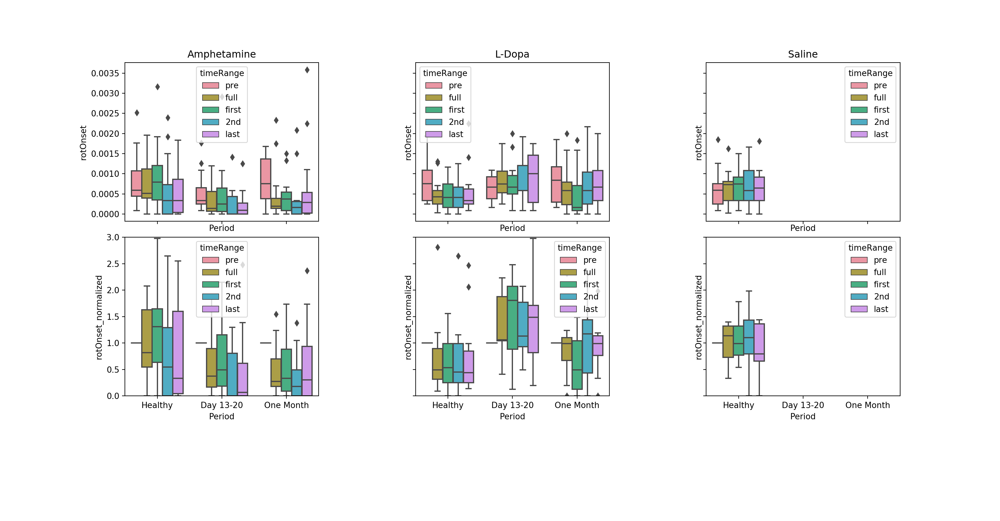

<IPython.core.display.Javascript object>


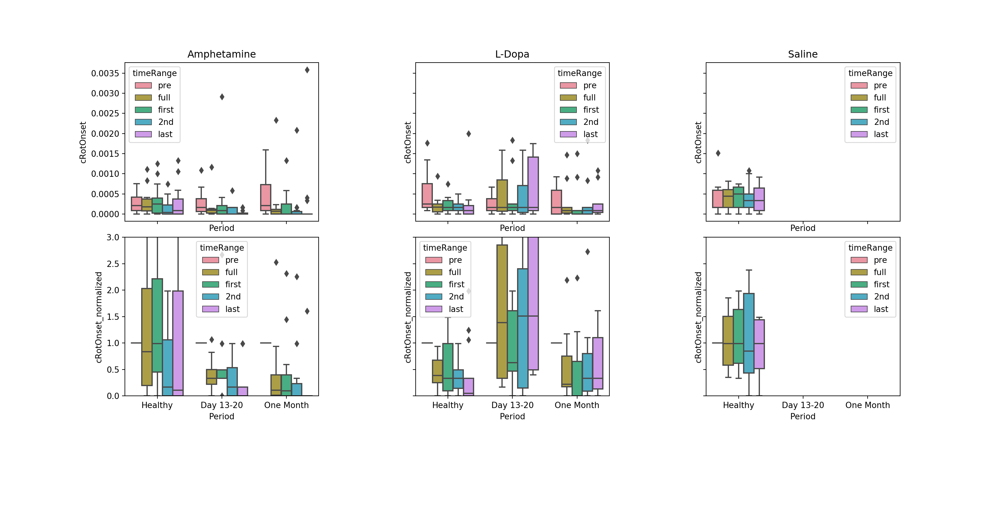

<IPython.core.display.Javascript object>


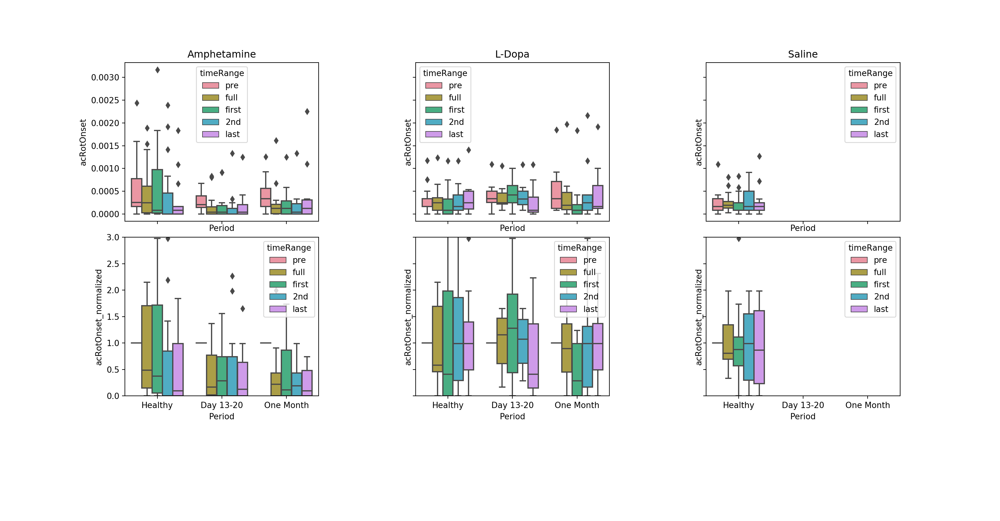

<IPython.core.display.Javascript object>


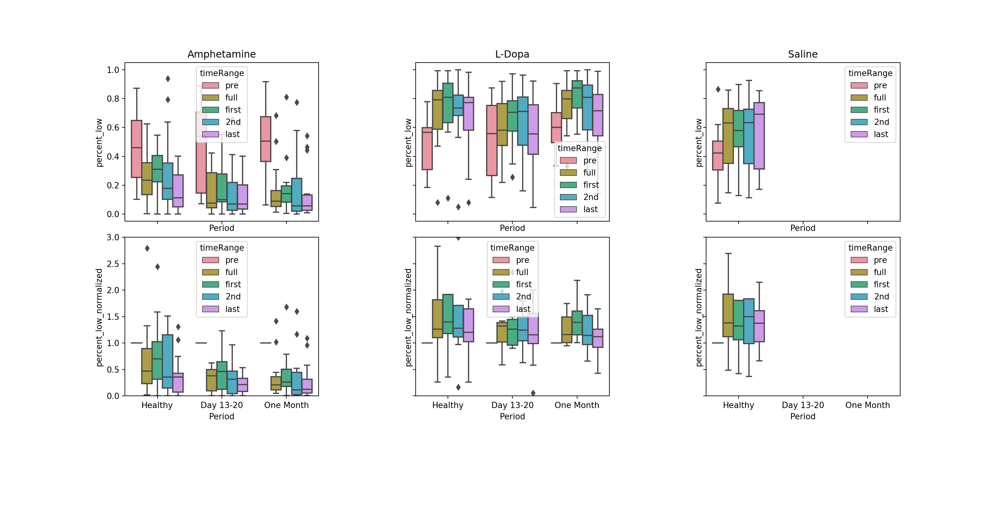

<IPython.core.display.Javascript object>


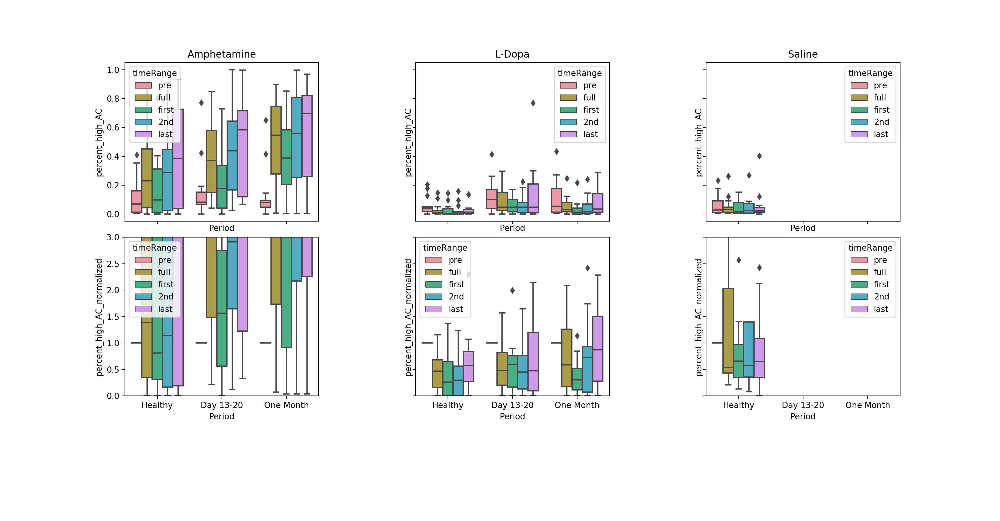

<IPython.core.display.Javascript object>


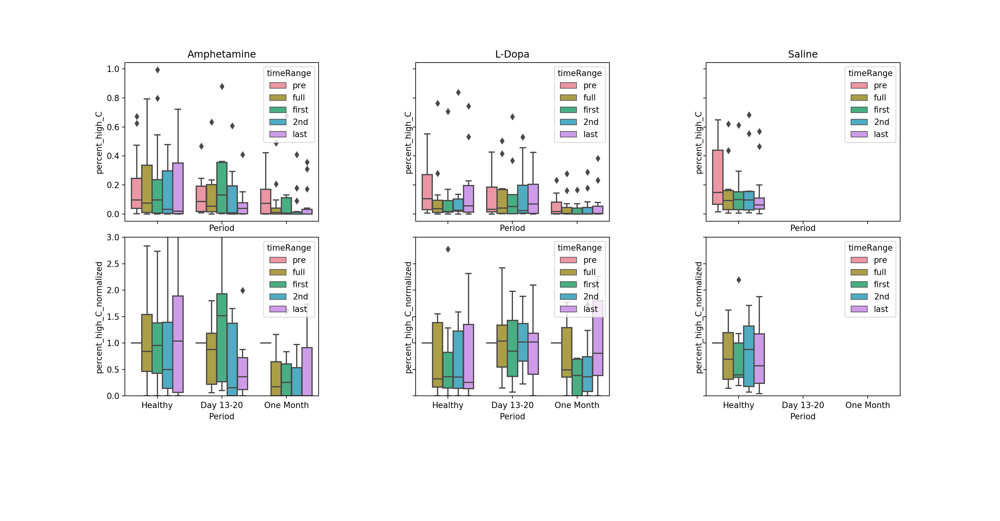

<IPython.core.display.Javascript object>


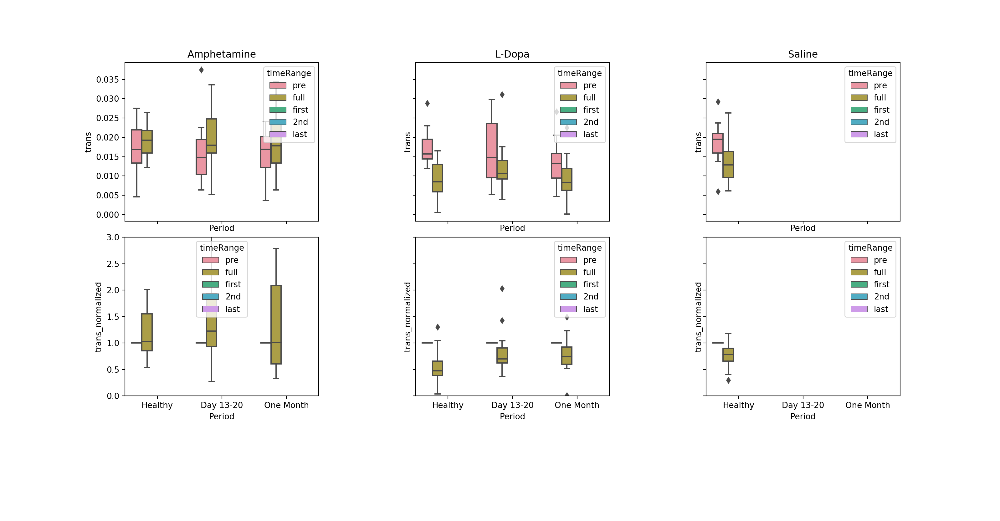

In [13]:
dfRot = pd.read_csv('postRotationDf.csv')
df2 = dfRot.groupby(['Mouse','Session','Period','Drug','timeRange']).mean()
df2.reset_index(inplace=True)
hOrder =  ['pre','full','first','2nd','last']

pOrder = ['Healthy','Day 13-20','One Month']
with sns.color_palette(colorPallet3Post):#sns.color_palette("PuBuGn_d"):
    columns = ['rotOnset','cRotOnset','acRotOnset','percent_low','percent_high_AC','percent_high_C','trans'] 
    labels = ['% time in low Speed','% time in high Speed','# periods']
    for ind in range(len(columns)):
        fig, ax = plt.subplots(2,3,figsize=(17.04,8.88),gridspec_kw = {'hspace':.1,'wspace':.5,'bottom':0.24}, sharex = True,sharey = 'row')
        df2[columns[ind]+'_normalized'] = df2.apply(lambda row: row[columns[ind]]/df2[(df2.Session == row.Session)&(df2.timeRange == 'pre')][columns[ind]].item() if df2[(df2.Session == row.Session)&(df2.timeRange == 'pre')][columns[ind]].item() != 0 else None,axis=1)
        for dInd, d in enumerate(df2.Drug.unique()):
            sns.boxplot(x="Period", y=columns[ind],hue = 'timeRange',ax = ax[0,dInd],
                        data=df2[df2.Drug == d],order = pOrder,hue_order =hOrder)
            sns.boxplot(x="Period", y=columns[ind]+'_normalized',hue = 'timeRange',ax = ax[1,dInd],
                        data=df2[df2.Drug == d],order = pOrder,hue_order = hOrder)
#         sns.boxplot(x="Period", y=columns[ind], data=df2[],ax =ax[ind],order = pOrder)
#         #sns.scatterplot(x="Period", y=columns[ind], data=df2,ax =ax[ind])
            ax[0,dInd].set_title(d)
            ax[1,dInd].set_ylim([0,3])
#         ax[ind].set_ylabel(labels[ind],fontsize=20)
#         ax[ind].set_xlabel("")
        fig.savefig(figFolder+columns[ind]+'_rotation.png',transparent=False,format='png')
        




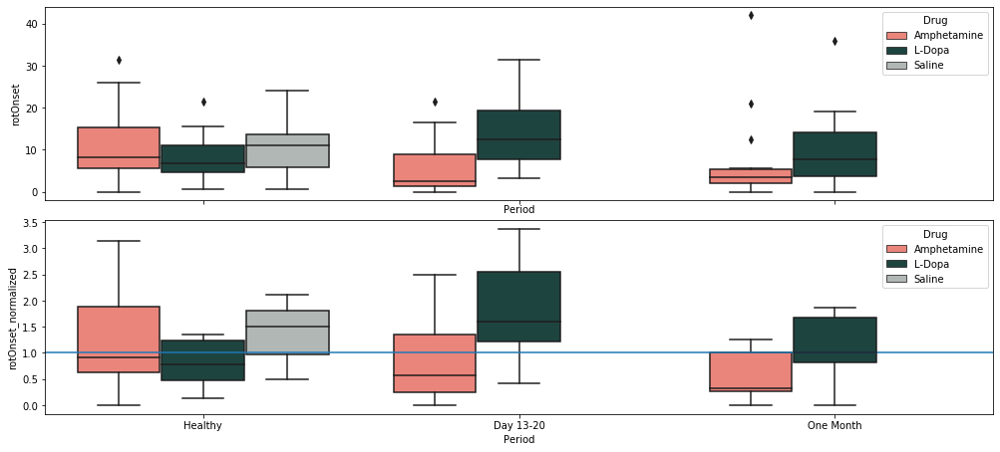

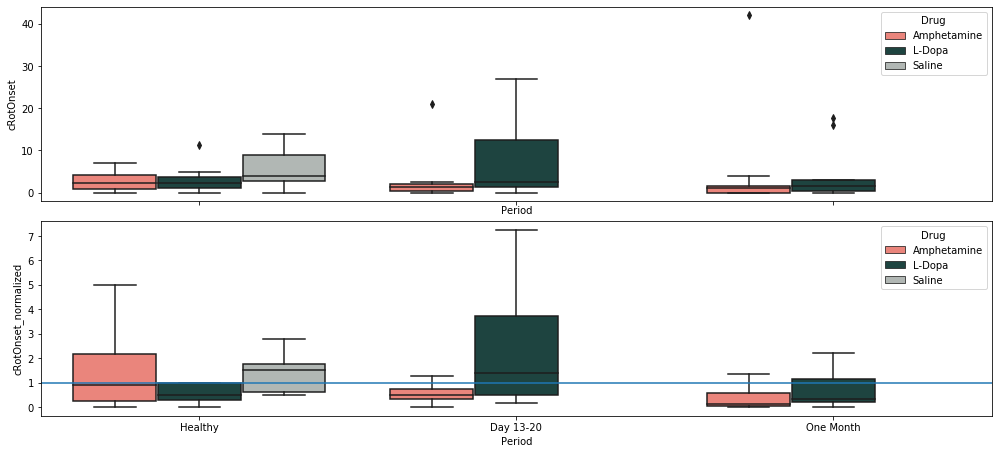

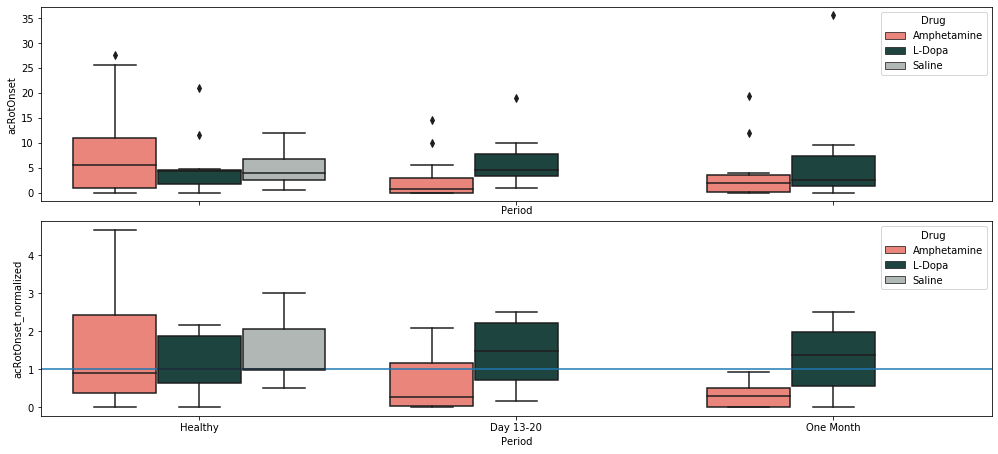

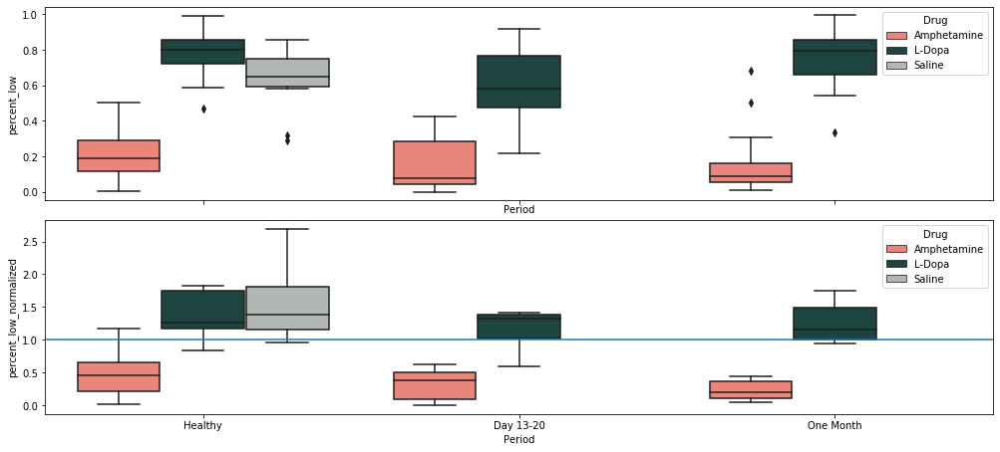

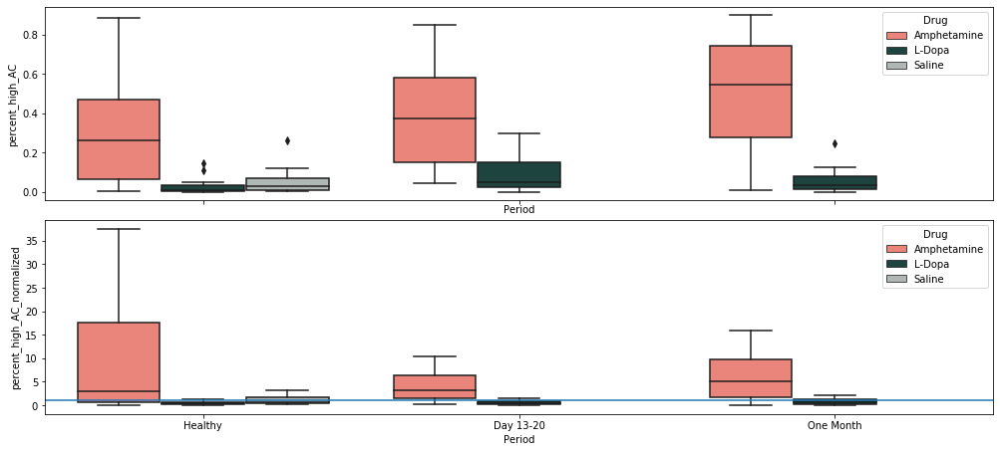

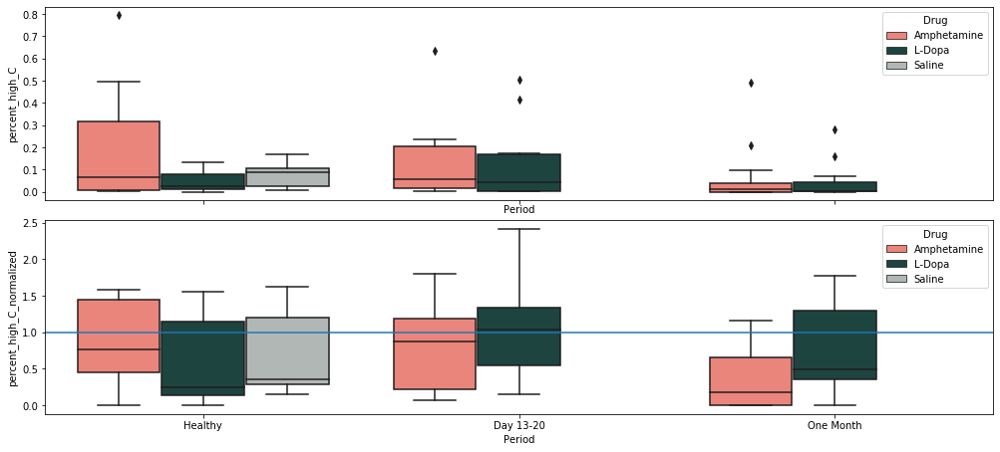

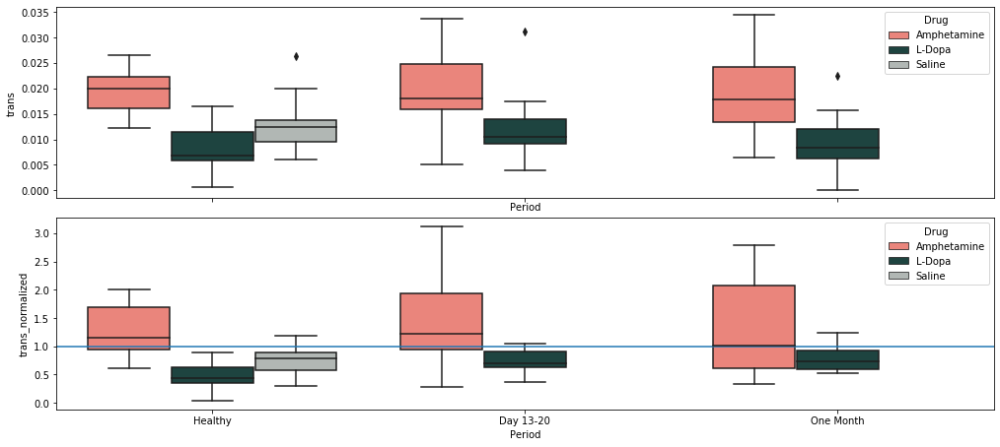

In [39]:
%matplotlib inline
dfRot = pd.read_csv('postRotationDf.csv')
df2 = dfRot.groupby(['Mouse','Session','Period','Drug','timeRange']).mean()
df2.reset_index(inplace=True)
hOrder =  ['pre','full','first','2nd','last']

df2 = df2[(~df2.Mouse.isin(['1253','1231']))&(df2.timeRange.isin(['pre','full']))]


pOrder = ['Healthy','Day 13-20','One Month']
columns = ['rotOnset','cRotOnset','acRotOnset','percent_low','percent_high_AC','percent_high_C','trans'] 
labels = ['% time in low Speed','% time in high Speed','# periods']
for ind in range(len(columns)):
    fig, ax = plt.subplots(2,1,figsize=(17.04,8.88),gridspec_kw = {'hspace':.1,'wspace':.5,'bottom':0.24}, sharex = True,sharey = 'row')
    df2[columns[ind]+'_normalized'] = df2.apply(lambda row: row[columns[ind]]/df2[(df2.Session == row.Session)&(df2.timeRange == 'pre')][columns[ind]].item() if df2[(df2.Session == row.Session)&(df2.timeRange == 'pre')][columns[ind]].item() != 0 else None,axis=1)       
    g1 = sns.boxplot(x="Period", y=columns[ind],hue = 'Drug',ax = ax[0],palette = ['#FC766AFF','#184A45FF','#B0B8B4FF'],
                data=df2[df2.timeRange == 'full'],order = pOrder)
#     g1.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
    g = sns.boxplot(x="Period", y=columns[ind]+'_normalized',hue = 'Drug',ax = ax[1],palette = ['#FC766AFF','#184A45FF','#B0B8B4FF'],
                data=df2[df2.timeRange == 'full'],order = pOrder, showfliers = False)
    ax[1].axhline(1)
#         ax[ind].set_ylabel(labels[ind],fontsize=20)
#         ax[ind].set_xlabel("")
    fig.savefig(figFolder+columns[ind]+'_rotation_full.png',transparent=False,format='png')
        




In [53]:
df2.to_csv('aim2_rot.csv')

<h3> Figure 3 </h3>

cleaning up trace data


<IPython.core.display.Javascript object>


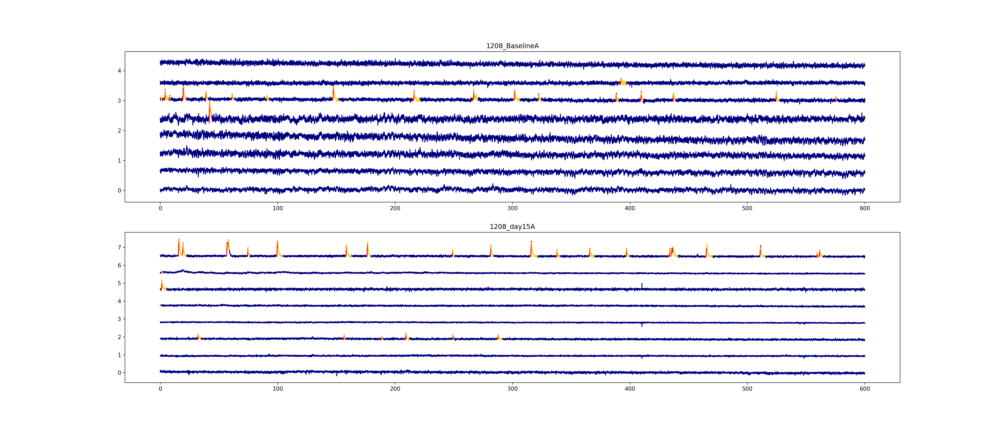

In [71]:
warnings.filterwarnings("ignore")

f = h5py.File('OnsetsAndPeriods.hdf5','r')
# align spectogram to spike onset -> for each mouse and in total,seperate by CRE:
sessList = {'1208_BaselineA':27,'1208_day15A':8}
m = '1208'
data = getData(Files[1],['trace'],period ='Post',day =lambda day: (day==15) or (day==0), mice = [m])

# constents for analysis:
tracePerSlide = 8
colors = {'TD':'black','TD_skip':'indianred','MSN':'navy','MSN_skip':'royalblue'}
lf = {'left':0.30, 'top':1.30, 'height':10.80, 'width':25.10}
fArgs = {'left':Inches(lf['left']),'top':Inches(lf['top']), 'height':Inches(lf['height']), 'width':Inches(lf['width'])}

fig, ax = plt.subplots(2,1,figsize=(lf['width'],lf['height']))
fig.set_size_inches(lf['width'],lf['height'],forward=True)

indX = 0
for sess in sessList.keys():
    # get traces:
    dff = data[sess]['trace']['dff']
    dt = 1/data[sess]['trace']['FS'][0]
    t = np.linspace(0,dt*dff.shape[1],dff.shape[1])
    Fs = data[sess]['trace']['FS'][0]
    # Vectors are saved as column vectors so.. transposed to raw vector
    if dff.shape[1] == 1:
        dff = dff.T
    # get CaOnset:
    caOnset = f[m][sess]['Post']['caOnset_Hf'].value
    caFall =  f[m][sess]['Post']['caFall_Hf'].value
    caOnset[caOnset==0] =np.nan
    caFall[caFall==0] =np.nan
    numred = int(data[sess]['trace']['numred'][0])

    tLim = int(600*Fs)
    N = sessList[sess]
    endN = np.min(((N+1)*tracePerSlide,dff.shape[0]))
    T=0;
    endT = np.min(((T+1)*tLim,dff.shape[1]))
    df = dff[N*tracePerSlide:endN,T*tLim:endT]
    ca = caOnset[N*tracePerSlide:endN,T*tLim:endT]
    ca = ca*df
    cf = caFall[N*tracePerSlide:endN,T*tLim:endT]
    cf = cf*df
    spacing = np.max(np.abs(df))
    Color = ['navy' for x in range(0,df.shape[0])]
    if tracePerSlide*N <numred:
        Nl = min(tracePerSlide,numred-N*tracePerSlide)
        Color[0:Nl] = [colors['TD'] for x in range(0,Nl)]
        Color[Nl:] = [colors['MSN'] for x in range(Nl,len(Color))]
    else:
        Color = [colors['MSN'] for x in range(0,len(Color))]
    for d in range(0,df.shape[0]):
        ax[indX].plot(t[T*tLim:endT],df[d,:]+d*spacing,color=Color[d],rasterized=True) 
        ax[indX].plot(t[T*tLim:endT],ca[d,:]+d*spacing,color='red',rasterized=True)
        ax[indX].plot(t[T*tLim:endT],cf[d,:]+d*spacing,color='gold',rasterized=True)
    ax[indX].set_title(sess)
    indX = indX+1
#fig.savefig(figFolder+'figure3_eventDetection'+'.png')
# fig.savefig(figFolder+'figure3_eventDetection_rasterized'+'.svg',transparent=True)




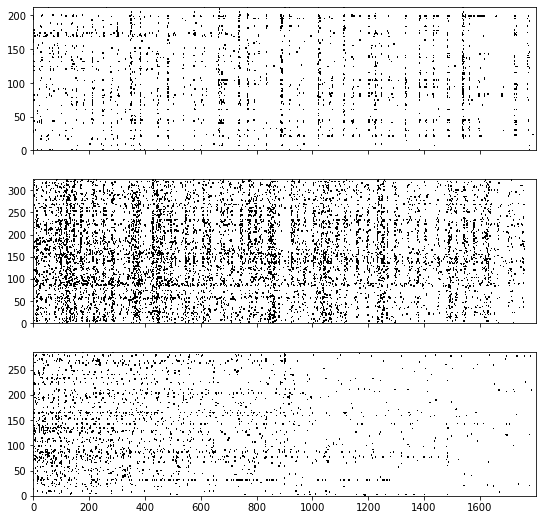

In [51]:
warnings.filterwarnings("ignore")

f = h5py.File('OnsetsAndPeriods.hdf5','r')
# align spectogram to spike onset -> for each mouse and in total,seperate by CRE:
sessList = {'1208_BaselineS':27,'1208_BaselineL':8,'1208_BaselineA':3}
# m = '1236'

fig, ax = plt.subplots(3,1,figsize=(9,9),sharex='col')
indX = 0
for sess in sessList.keys():
    # get traces:
    m = sess[:4]
    # get CaOnset:
    caOnset = f[m][sess]['Post']['caOnset_Hf'].value
    caOnset[caOnset==0] = np.nan
    ts = np.arange(0, np.max(caOnset.shape[1])) * .05 
    ax[indX].pcolormesh(ts[:],np.arange(0,caOnset.shape[0]),caOnset[:,:],cmap=cm.gray,rasterized=True)
    indX =indX+1
    

fig.savefig(figFolder+'figure3_binaryRastor'+'.png')
# fig.savefig(figFolder+'figure3_binaryRastor_rasterized'+'.svg',transparent=True)




In [14]:
# data for all mice - homomorphic filter 
PVdata = getData(Files[1],['speed','trace'],period ='Post', cre='PV',red = True)
MSNdata = getData(Files[1],['speed','trace'],period ='Post',red = False)
CHIdata = getData(Files[1],['speed','trace'],period ='Post', cre='CHI',red = True)


/home/dana_z/ssd_2TB/6OHDA/IO.py:152: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  speed = hf[m][s]['mvmt']['speed'].value
/home/dana_z/ssd_2TB/6OHDA/IO.py:282: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  dff = hf[m][s]['traces']['dff'].value


cleaning up trace data
I deleted session: 1236_day1
I deleted session: 1236_day11
I deleted session: 1236_day13
I deleted session: 1236_day19L
I deleted session: 1236_day3
I deleted session: 1236_day5
I deleted session: 1236_day7
I deleted session: 1236_day9
I deleted session: 4539_day0
I deleted session: 4539_day1
I deleted session: 4539_day10
I deleted session: 4539_day11
I deleted session: 4539_day12
I deleted session: 4539_day13
I deleted session: 4539_day14
I deleted session: 4539_day2
I deleted session: 4539_day3
I deleted session: 4539_day4
I deleted session: 4539_day5
I deleted session: 4539_day6
I deleted session: 4539_day7
I deleted session: 4539_day8
I deleted session: 4539_day9
I deleted session: 7584_Baseline0
I deleted session: 7584_day0
I deleted session: 7584_day1
I deleted session: 7584_day10
I deleted session: 7584_day11
I deleted session: 7584_day12
I deleted session: 7584_day15
I deleted session: 7584_day2
I deleted session: 7584_day3
I deleted session: 7584_day4
I 

In [8]:
#f = h5py.File('OnsetsAndPeriods.hdf5','r')
col_names = ['Mouse','Sess','Day','Drug','timeRange','cellNumber','highSpeed','medSpeed','lowSpeed','All_',
             'acc','dcc','rotAcc','rotDcc','highACrot','highCrot','lowRot']
dfC = pd.DataFrame(columns = col_names)
cond = ['PVdata','MSNdata','CHIdata']
transWindow = np.ones((10,1))
tName = ['first','2nd','last']
for c in cond:
    data = eval(c)
    for sess in data.keys():
#         try:
            if sess[5] == 'B':
                day = 0
            else:
                day = int(re.findall(r'\d+',sess[5:])[0])
            m = sess[0:4]
            
            if sess[-1] == 'S':
                drug = 'Saline'
            elif sess[-1] == 'L':
                drug = 'L-Dopa'
            else:
                drug = 'Amphetamine'

            
            Hp = getOnsetOrPeriod(m,sess,'Pre','HighMvmtPeriods_vector')
            Lp = getOnsetOrPeriod(m,sess,'Pre','LowMvmtPeriods_vector')
            Mp = ((Hp+Lp)==0)
            hACp = getOnsetOrPeriod(m,sess,'Pre','hiACRotPeriods_vector')
            hCp = getOnsetOrPeriod(m,sess,'Pre','hiCRotPeriods_vector')
            Lrp = getOnsetOrPeriod(m,sess,'Pre','loRotPeriods_vector')
            comb = hACp*8+Lp*5+hCp*7
            rotTrans = comb[1:]-comb[:-1]           
                      
            
            Ca = getOnsetOrPeriod(m,sess,'Pre','caOnset_Hf')
            CaO = Ca[:,1:]-Ca[:,:-1]
            if CaO.shape[1]<Hp.shape[0]:
                 CaO = np.append(CaO,np.zeros((CaO.shape[0],1)),axis=1)
            C_start = (CaO==1)*1
            if C_start.shape[1]>len(Lp):
                C_start = C_start[:,:len(Lp)]
            C_end = (CaO==-1)*1
            Acc = np.append(np.convolve(np.diff(Lp*1+Hp*2)>0, transWindow[:,0], mode='same')>0,False)
            Dcc = np.append(np.convolve(np.diff(Lp*1+Hp*2)<0, transWindow[:,0], mode='same')>0,False)
            rotAcc = np.append(np.convolve(rotTrans>0, transWindow[:,0], mode='same')>0,False)
            rotDcc = np.append(np.convolve(rotTrans<0, transWindow[:,0], mode='same')>0,False)
            if rotAcc.shape[0] >Acc.shape[0]:
                rotAcc = rotAcc[:Acc.shape[0]]
                rotDcc = rotDcc[:Acc.shape[0]]
                    

            
            a = np.asarray([np.arange(0,np.min(C_start.shape)),
                            np.sum(C_start[:,Hp],axis=1),np.sum(C_start[:,Mp],axis=1),
                            np.sum(C_start[:,Lp],axis=1),np.sum(C_start,axis=1),
                            np.sum(C_start[:,Acc],axis=1),np.sum(C_start[:,Dcc],axis=1),
                            np.sum(C_start[:,rotAcc],axis=1),np.sum(C_start[:,rotDcc],axis=1),
                            np.sum(C_start[:,hACp],axis=1),np.sum(C_start[:,hCp],axis=1),
                            np.sum(C_start[:,Lrp],axis=1)]).T
            
            df2C = pd.DataFrame(a, columns = col_names[5:])
            df2C['timeRange'] = 'pre'
            df2C['totalTime'] = (Hp.shape[0]/1200)
            df2C['lowTime'] = np.sum(Lp/1200)
            df2C['medTime'] = np.sum(Mp/1200)
            df2C['highTime'] = np.sum(Hp/1200)
            df2C['lowRotTime'] = np.sum(Lp/1200)
            df2C['highACRotTime'] = np.sum(hACp/1200)
            df2C['highCRotTime'] = np.sum(hCp/1200)
            df2C['totTrans'] = np.sum(rotTrans!=0)
            df2C['rotAccTrans'] = np.sum(rotTrans>0)
            df2C['rotDccTrans'] = np.sum(rotTrans<0)
            df2C['accTrans'] = np.sum(np.diff(Lp*1+Hp*2)>0)
            df2C['dccTrans'] = np.sum(np.diff(Lp*1+Hp*2)<0)
            df2C['Day'] = day
            df2C['Drug'] = drug
            df2C['Mouse'] = m
            df2C['Sess'] = sess
            df2C['CellType'] = c[:-4]
            df2C['Period'] = periodCalc(day)
            df2C['Beta']  = m in betaMice
            dfC = pd.concat([dfC,df2C],sort=True)
        
            
            Hp = getOnsetOrPeriod(m,sess,'Post','HighMvmtPeriods_vector')
            Lp = getOnsetOrPeriod(m,sess,'Post','LowMvmtPeriods_vector')
            Mp = ((Hp+Lp)==0)
            hACp = getOnsetOrPeriod(m,sess,'Post','hiACRotPeriods_vector')
            hCp = getOnsetOrPeriod(m,sess,'Post','hiCRotPeriods_vector')
            Lrp = getOnsetOrPeriod(m,sess,'Post','loRotPeriods_vector')
            comb = hACp*8+Lp*5+hCp*7
            rotTrans = comb[1:]-comb[:-1]           
            
            Ca = getOnsetOrPeriod(m,sess,'Post','caOnset_Hf')
            CaO = Ca[:,1:]-Ca[:,:-1]
            if CaO.shape[1]<Hp.shape[0]:
                 CaO = np.append(CaO,np.zeros((CaO.shape[0],1)),axis=1)
            
            C_start = (CaO==1)*1
            if C_start.shape[1]>len(Lp):
                C_start = C_start[:,:len(Lp)]
            
            C_end = (CaO==-1)*1
            Acc = np.append(np.convolve(np.diff(Lp*1+Hp*2)>0, transWindow[:,0], mode='same')>0,False)
            Dcc = np.append(np.convolve(np.diff(Lp*1+Hp*2)<0, transWindow[:,0], mode='same')>0,False)
            rotAcc = np.append(np.convolve(rotTrans>0, transWindow[:,0], mode='same')>0,False)
            rotDcc = np.append(np.convolve(rotTrans<0, transWindow[:,0], mode='same')>0,False)
            if rotAcc.shape[0] >Acc.shape[0]:
                rotAcc = rotAcc[:Acc.shape[0]]
                rotDcc = rotDcc[:Acc.shape[0]]
            elif rotAcc.shape[0] <Acc.shape[0]:
                rotAcc = np.append(rotAcc, np.zeros((Acc.shape[0]-rotAcc.shape[0]),'bool'),axis = 0)                  
                rotDcc = np.append(rotDcc, np.zeros((Dcc.shape[0]-rotDcc.shape[0]),'bool'), axis = 0)  
                    

            
            a = np.asarray([np.arange(0,np.min(C_start.shape)),
                            np.sum(C_start[:,Hp],axis=1),np.sum(C_start[:,Mp],axis=1),
                            np.sum(C_start[:,Lp],axis=1),np.sum(C_start,axis=1),
                            np.sum(C_start[:,Acc],axis=1),np.sum(C_start[:,Dcc],axis=1),
                            np.sum(C_start[:,rotAcc],axis=1),np.sum(C_start[:,rotDcc],axis=1),
                            np.sum(C_start[:,hACp],axis=1),np.sum(C_start[:,hCp],axis=1),
                            np.sum(C_start[:,Lrp],axis=1)]).T
            
            df2C = pd.DataFrame(a, columns = col_names[5:])
            df2C['timeRange'] = 'full'
            df2C['totalTime'] = (Hp.shape[0]/1200)
            df2C['lowTime'] = np.sum(Lp/1200)
            df2C['medTime'] = np.sum(Mp/1200)
            df2C['highTime'] = np.sum(Hp/1200)
            df2C['lowRotTime'] = np.sum(Lp/1200)
            df2C['highACRotTime'] = np.sum(hACp/1200)
            df2C['highCRotTime'] = np.sum(hCp/1200)
            df2C['totTrans'] = np.sum(rotTrans!=0)
            df2C['rotAccTrans'] = np.sum(rotTrans>0)
            df2C['rotDccTrans'] = np.sum(rotTrans<0)
            df2C['accTrans'] = np.sum(np.diff(Lp*1+Hp*2)>0)
            df2C['dccTrans'] = np.sum(np.diff(Lp*1+Hp*2)<0)
            df2C['Day'] = day
            df2C['Drug'] = drug
            df2C['Mouse'] = m
            df2C['Sess'] = sess
            df2C['CellType'] = c[:-4]
            df2C['Period'] = periodCalc(day)
            df2C['Beta']  = m in betaMice
            dfC = pd.concat([dfC,df2C],sort=True)
            
            Hp2 = Hp
            Lp2 = Lp 
            Mp2 = Mp
            hACp2 = hACp
            hCp2 = hCp
            Lrp2 = Lrp
            rotTrans2 = rotTrans    
            C_start2 = C_start
            
            
            
            for tp in range(3):
                try:
                    Hp = Hp2[tp*12000:np.min(((tp+1)*12000,len(Hp2)))]
                    Lp = Lp2[tp*12000:np.min(((tp+1)*12000,len(Lp2)))]
                    Mp = Mp2[tp*12000:np.min(((tp+1)*12000,len(Mp2)))]
                    hACp = hACp2[tp*12000:np.min(((tp+1)*12000,len(hACp2)))]
                    hCp = hCp2[tp*12000:np.min(((tp+1)*12000,len(hCp2)))]
                    Lrp = Lrp2[tp*12000:np.min(((tp+1)*12000,len(Lrp2)))]
                    rotTrans = rotTrans2[tp*12000:np.min(((tp+1)*12000,len(rotTrans2)))]   
                    C_start = C_start2[:,tp*12000:np.min(((tp+1)*12000,C_start2.shape[1]))]

                    Acc = np.append(np.convolve(np.diff(Lp*1+Hp*2)>0, transWindow[:,0], mode='same')>0,False)
                    Dcc = np.append(np.convolve(np.diff(Lp*1+Hp*2)<0, transWindow[:,0], mode='same')>0,False)
                    rotAcc = np.append(np.convolve(rotTrans>0, transWindow[:,0], mode='same')>0,False)
                    rotDcc = np.append(np.convolve(rotTrans<0, transWindow[:,0], mode='same')>0,False)
                    if rotAcc.shape[0] >Acc.shape[0]:
                        rotAcc = rotAcc[:Acc.shape[0]]
                        rotDcc = rotDcc[:Acc.shape[0]]
                    elif rotAcc.shape[0] <Acc.shape[0]:
                        rotAcc = np.append(rotAcc, np.zeros((Acc.shape[0]-rotAcc.shape[0]),'bool'),axis = 0)                  
                        rotDcc = np.append(rotDcc, np.zeros((Dcc.shape[0]-rotDcc.shape[0]),'bool'), axis = 0)     

                    a = np.asarray([np.arange(0,np.min(C_start.shape)),
                                    np.sum(C_start[:,Hp],axis=1),np.sum(C_start[:,Mp],axis=1),
                                    np.sum(C_start[:,Lp],axis=1),np.sum(C_start,axis=1),
                                    np.sum(C_start[:,Acc],axis=1),np.sum(C_start[:,Dcc],axis=1),
                                    np.sum(C_start[:,rotAcc],axis=1),np.sum(C_start[:,rotDcc],axis=1),
                                    np.sum(C_start[:,hACp],axis=1),np.sum(C_start[:,hCp],axis=1),
                                    np.sum(C_start[:,Lrp],axis=1)]).T

                    df2C = pd.DataFrame(a, columns = col_names[5:])
                    df2C['timeRange'] = tName[tp]
                    df2C['totalTime'] = (Hp.shape[0]/1200)
                    df2C['lowTime'] = np.sum(Lp/1200)
                    df2C['medTime'] = np.sum(Mp/1200)
                    df2C['highTime'] = np.sum(Hp/1200)
                    df2C['lowRotTime'] = np.sum(Lp/1200)
                    df2C['highACRotTime'] = np.sum(hACp/1200)
                    df2C['highCRotTime'] = np.sum(hCp/1200)
                    df2C['totTrans'] = np.sum(rotTrans!=0)
                    df2C['rotAccTrans'] = np.sum(rotTrans>0)
                    df2C['rotDccTrans'] = np.sum(rotTrans<0)
                    df2C['accTrans'] = np.sum(np.diff(Lp*1+Hp*2)>0)
                    df2C['dccTrans'] = np.sum(np.diff(Lp*1+Hp*2)<0)
                    df2C['Day'] = day
                    df2C['Drug'] = drug
                    df2C['Mouse'] = m
                    df2C['Sess'] = sess
                    df2C['CellType'] = c[:-4]
                    df2C['Period'] = periodCalc(day)
                    df2C['Beta']  = m in betaMice
                    dfC = pd.concat([dfC,df2C],sort=True)
                except:
                    print(sess)


dfC['high_speed'] =  dfC.apply (lambda row: row.highSpeed/row.highTime if row.highTime != 0 else 0, axis=1)
dfC['medium_speed'] = dfC.apply (lambda row: row.medSpeed/row.medTime if row.medTime != 0 else 0, axis=1)
dfC['low_speed'] = dfC.apply (lambda row: row.lowSpeed/row.lowTime if row.lowTime != 0 else 0 , axis=1)
dfC['high_ACrot'] =  dfC.apply (lambda row: row.highACrot/row.highACRotTime if row.highACRotTime != 0 else 0, axis=1)
dfC['high_Crot'] = dfC.apply (lambda row: row.highCrot/row.highCRotTime if row.highCRotTime != 0 else 0, axis=1)
dfC['low_rot'] = dfC.apply (lambda row: row.lowRot/row.lowRotTime if row.lowRotTime != 0 else 0, axis=1)
dfC['All'] = dfC.apply (lambda row: row.All_/row.totalTime , axis=1)
dfC['Acc'] = dfC.apply (lambda row: row.acc/row.accTrans if row.accTrans != 0 else 0, axis=1)
dfC['Dcc'] = dfC.apply (lambda row: row.dcc/row.dccTrans if row.dccTrans != 0 else 0, axis=1)
dfC['Acc_'] = dfC.apply (lambda row: row.acc/row.All_ if row.All_ >0 else 0 , axis=1)
dfC['Dcc_'] = dfC.apply (lambda row: row.dcc/row.All_ if row.All_ >0 else 0 , axis=1)
dfC['rotAcc'] = dfC.apply (lambda row: row.rotAcc/row.rotAccTrans if row.rotAccTrans != 0 else 0 , axis=1)
dfC['rotDcc'] = dfC.apply (lambda row: row.rotDcc/row.rotDccTrans  if row.rotDccTrans != 0 else 0, axis=1)
dfC['rotAcc_'] = dfC.apply (lambda row: row.rotAcc/row.All_ if row.All_ >0 else 0 , axis=1)
dfC['rotDcc_'] = dfC.apply (lambda row: row.rotDcc/row.All_ if row.All_ >0 else 0 , axis=1)


dfC['totAcc_'] = dfC.apply (lambda row: (row.dcc+row.acc)/row.All_ if row.All_ >0 else 0 , axis=1)
dfC['totRotAcc_'] = dfC.apply (lambda row: (row.rotDcc+row.rotAcc)/row.All_ if row.All_ >0 else 0 , axis=1)


dfC.head()


dfC.to_csv('firingRateDf_PostDrug.csv')

/home/dana_z/anaconda3/lib/python3.6/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


4539_Baseline2A
4539_Baseline2A
7584_BaselineA
7909_BaselineA
4539_Baseline2A
4539_Baseline2A
7584_BaselineA
7909_BaselineA


In [6]:
dfC = pd.read_csv('firingRateDf_PostDrug.csv')
dfC2 = dfC[['Mouse','Sess','Period','Drug','timeRange','CellType','cellNumber','All','high_speed','medium_speed','low_speed','high_ACrot','high_Crot','low_rot']]
columns = ['All','high_speed','medium_speed','low_speed','high_ACrot','high_Crot','low_rot'] 

def normalizeRow(x,col):
    try:
        denom = dfC2[(dfC2.Sess == x.Sess)&(dfC2.timeRange == 'pre')&(dfC2.cellNumber == x.cellNumber)&(dfC2.CellType == x.CellType)][col].item()
        if denom == 0:
            return 0
        else:
            return x[col]/denom 
    except:
        print(x.Sess, x.timeRange, x.cellNumber,col,dfC2[(dfC2.Sess == x.Sess)&(dfC2.timeRange == 'pre')&(dfC2.cellNumber == x.cellNumber)][col])
        return None



for ind in range(len(columns)):
    dfC2[columns[ind]+'_normalized'] = dfC2.apply(lambda row:normalizeRow(row,columns[ind]),axis = 1)
dfC2.to_csv('firingRateDf_PostDrug_normalized.csv')

/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https:

<IPython.core.display.Javascript object>


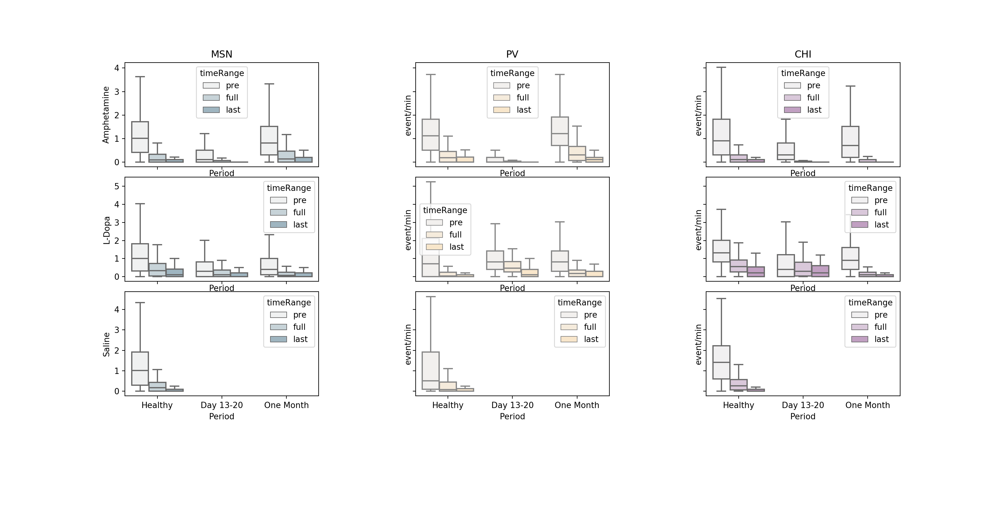

<IPython.core.display.Javascript object>


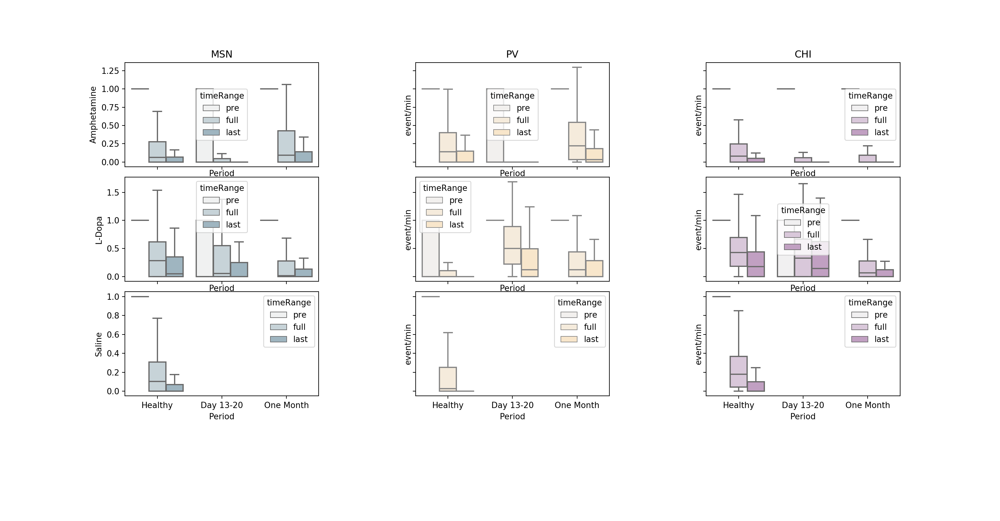

<IPython.core.display.Javascript object>


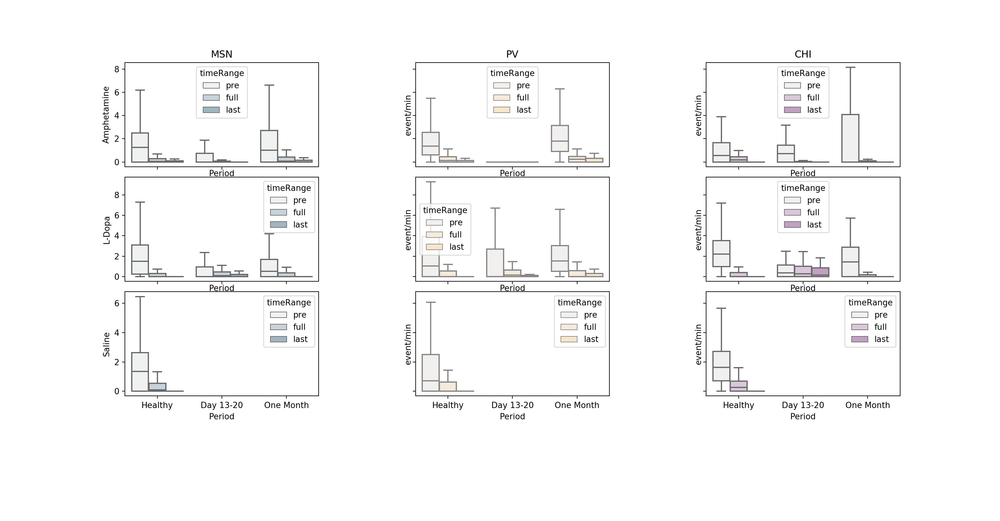

<IPython.core.display.Javascript object>


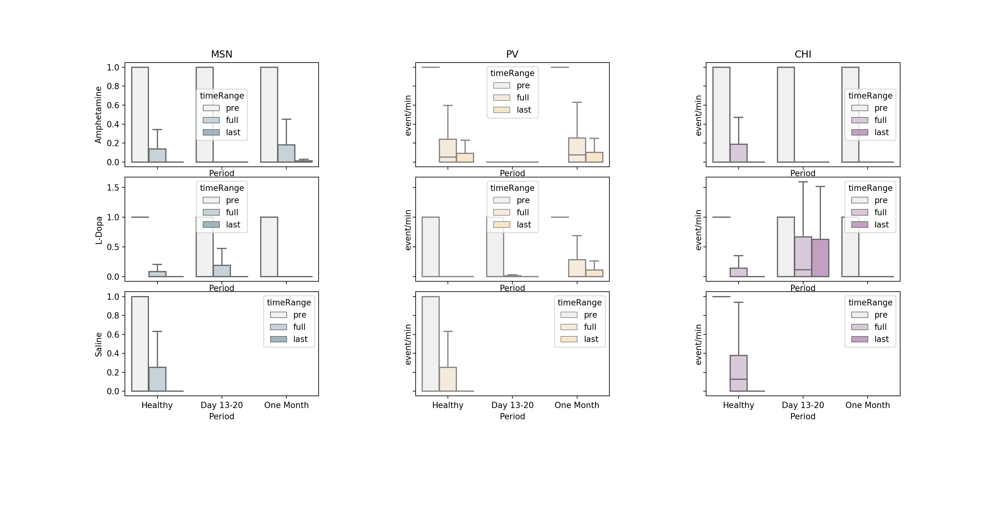

<IPython.core.display.Javascript object>


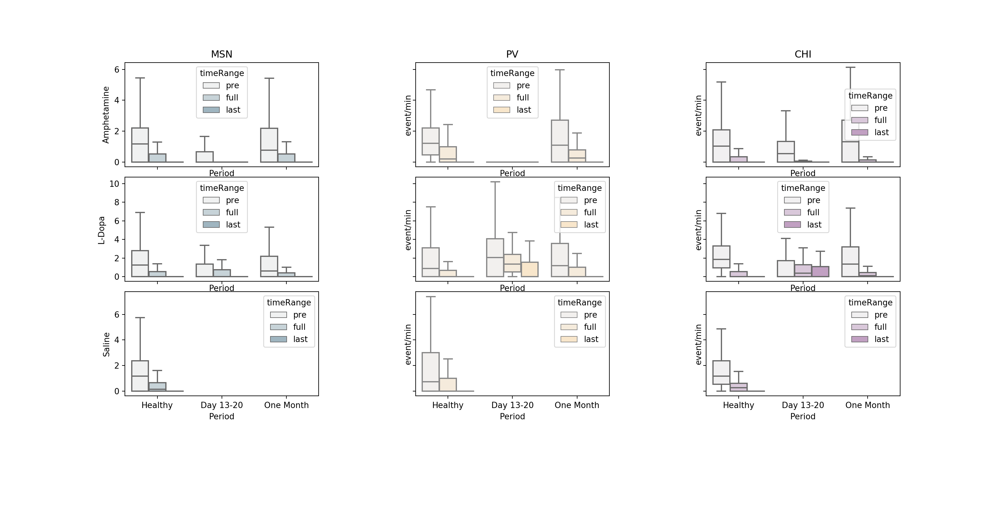

<IPython.core.display.Javascript object>


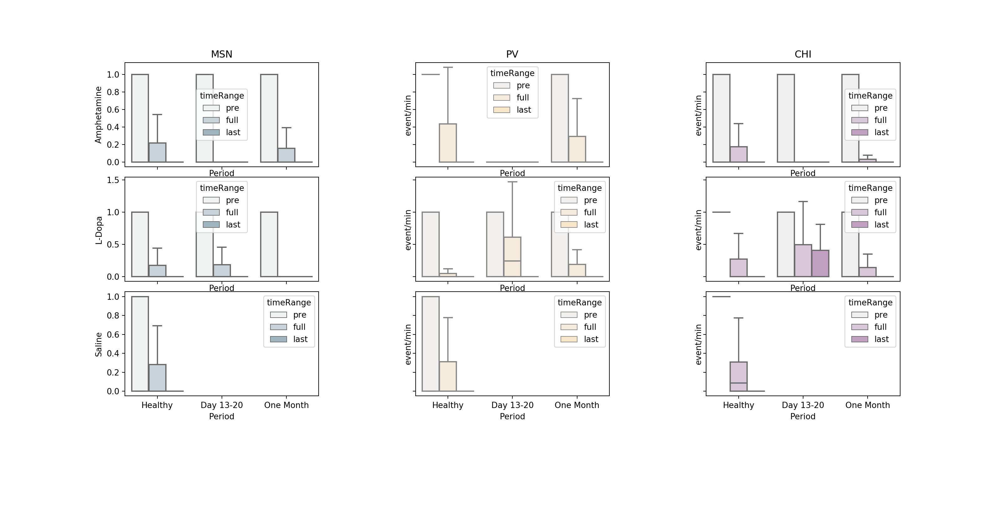

<IPython.core.display.Javascript object>


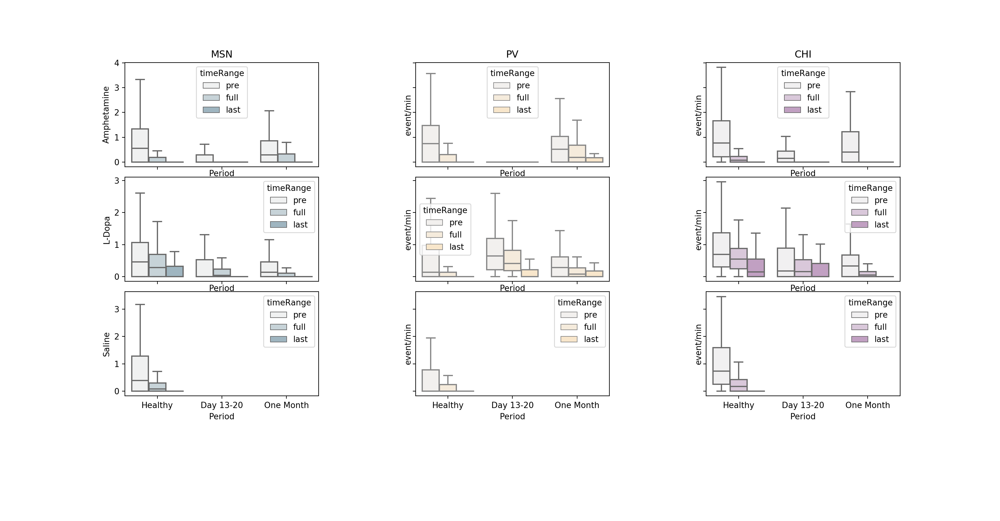

<IPython.core.display.Javascript object>


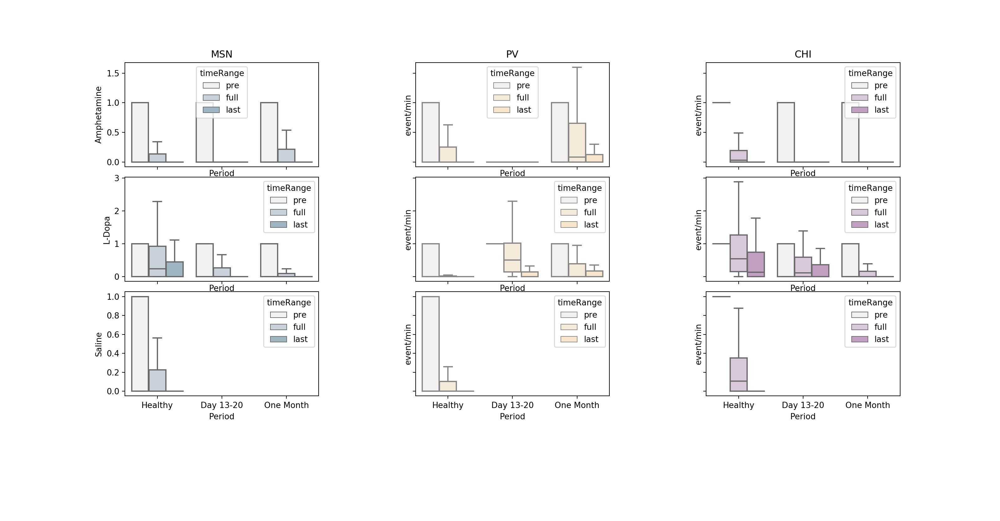

<IPython.core.display.Javascript object>


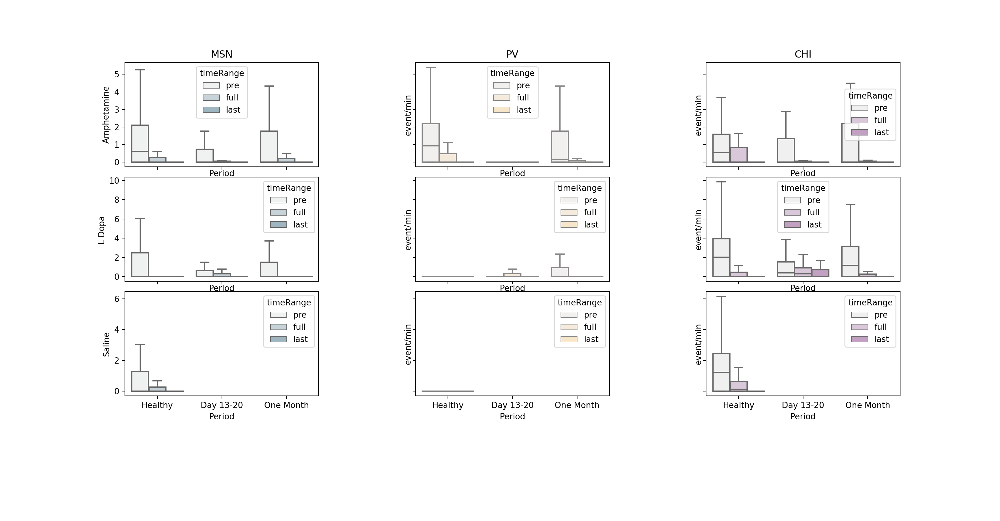

<IPython.core.display.Javascript object>


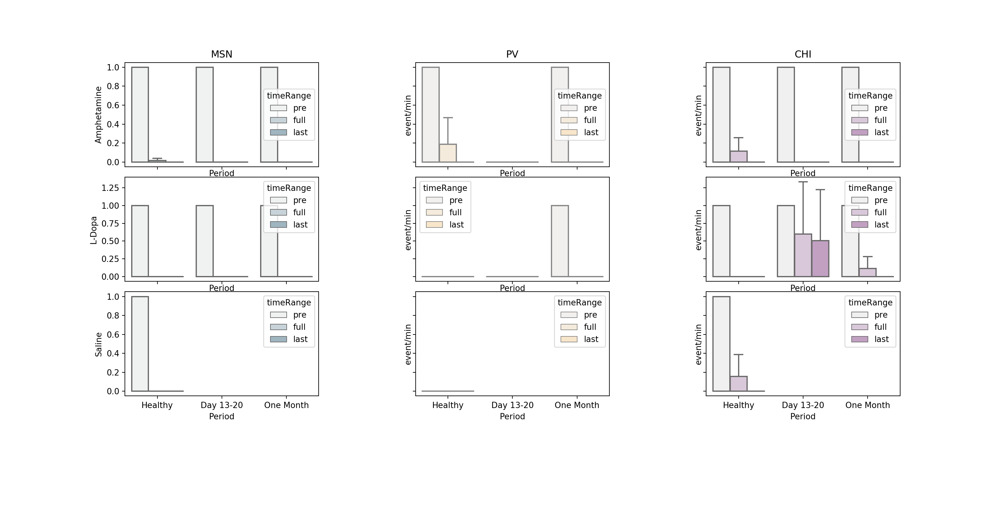

<IPython.core.display.Javascript object>


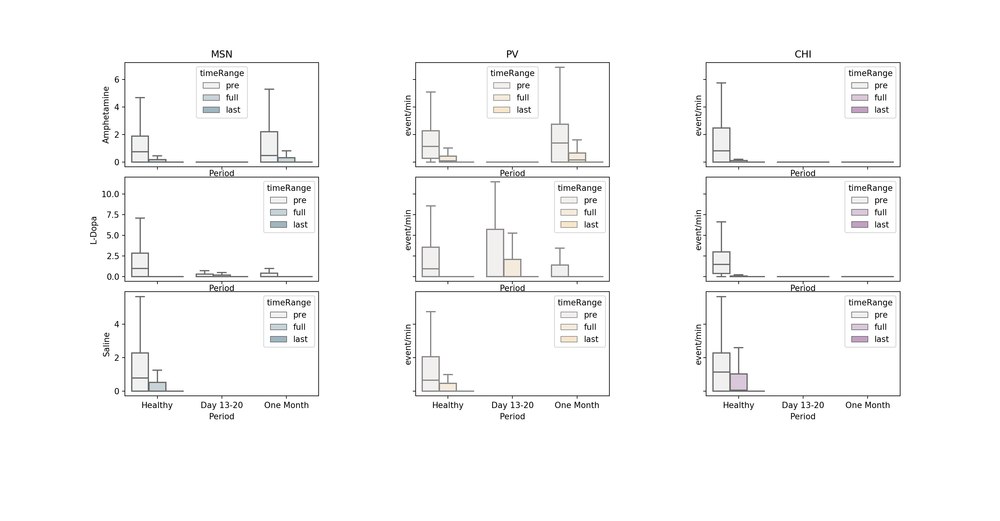

<IPython.core.display.Javascript object>


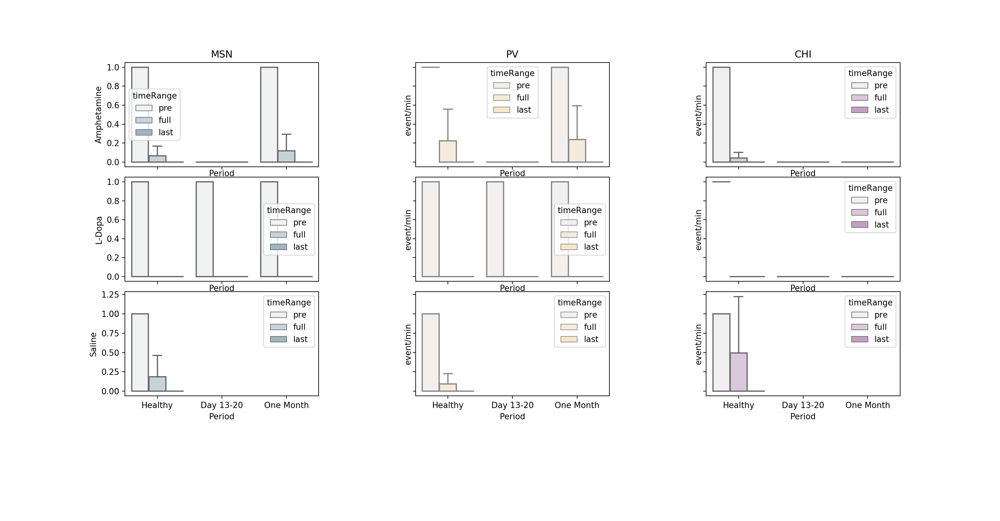

<IPython.core.display.Javascript object>


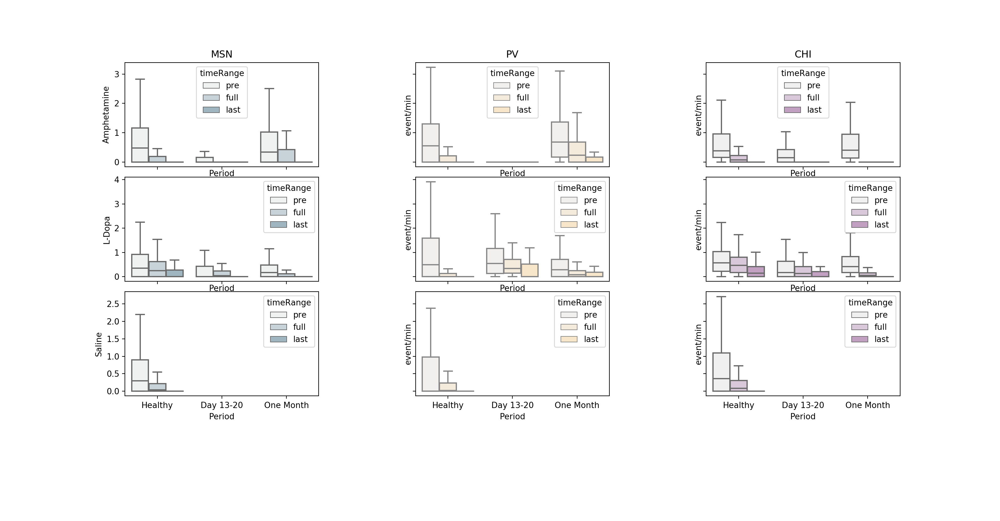

<IPython.core.display.Javascript object>


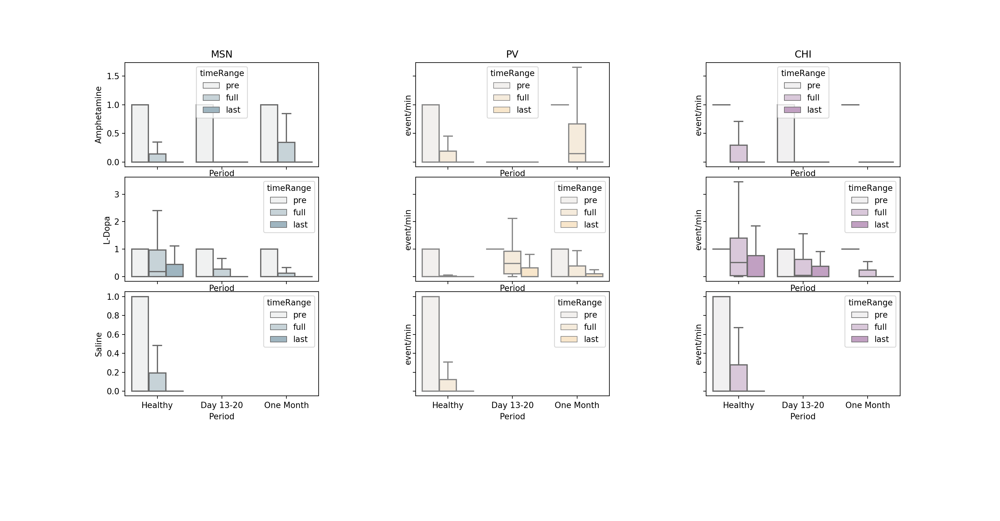

In [46]:
# dfC = pd.read_csv('firingRateDf_PostDrug.csv')
# dfC2 = dfC[['Mouse','Sess','Period','Drug','timeRange','CellType','cellNumber','All','high_speed','medium_speed','low_speed','high_ACrot','high_Crot','low_rot']]
columns = ['All','high_speed','medium_speed','low_speed','high_ACrot','high_Crot','low_rot'] 
colors = ['#99B7C5','#FFE7C4','#C69AC8']
hOrder =  ['pre','full','last']


pData = dfC2.groupby(['Sess','Period','CellType','Drug','timeRange'],as_index=False).mean()
#labels = ['% time in low Speed','% time in high Speed','# periods']
for ind in range(len(columns)):
    fig, ax = plt.subplots(3,3,figsize=(17.04,8.88),gridspec_kw = {'hspace':.1,'wspace':.5,'bottom':0.24}, sharex = True,sharey = 'row')
    fig_n, ax_n = plt.subplots(3,3,figsize=(17.04,8.88),gridspec_kw = {'hspace':.1,'wspace':.5,'bottom':0.24}, sharex = True,sharey = 'row')
    df_long = pd.melt(dfC2,id_vars=['CellType','Period','Drug','timeRange'], value_vars=[columns[ind]],value_name='event/min')
    df_long_n = pd.melt(dfC2,id_vars=['CellType','Period','Drug','timeRange'], value_vars=[columns[ind]+'_normalized'],value_name='event/min')

    for dInd, d in enumerate(dfC2.Drug.unique()):
        for cInd,c in enumerate(['MSN','PV','CHI']):           
            sns.boxplot(x="Period", y="event/min",hue = 'timeRange',data=df_long[(df_long.Drug == d)&(df_long.CellType == c)], dodge = True,
                        order = ['Healthy', 'Day 13-20', 'One Month'],hue_order = hOrder,color=colors[cInd],ax=ax[dInd,cInd],showfliers=False)
            sns.boxplot(x="Period", y="event/min",hue = 'timeRange',data=df_long_n[(df_long_n.Drug == d)&(df_long_n.CellType == c)], dodge = True,
                        order = ['Healthy', 'Day 13-20', 'One Month'],hue_order = hOrder,color=colors[cInd],ax=ax_n[dInd,cInd],showfliers=False)
            
            ax_n[dInd,0].set_ylabel(d)
            ax[dInd,0].set_ylabel(d)
            ax_n[0,cInd].set_title(c)
            ax[0,cInd].set_title(c)
 
    fig.savefig(figFolder+columns[ind]+'_firingRate_noOutliers.png',transparent=False,format='png')
    fig_n.savefig(figFolder+columns[ind]+'_firingRate_normalized_noOutliers.png',transparent=False,format='png')
#     plt.close(fig)
#     plt.close(fig_n)
# fig.savefig(figFolder+'figure3_b.svg',transparent=True,format='svg')


In [9]:
# read numbers for paper details
dfC[['Mouse','Period','CellType','Drug','timeRange','All']].groupby(['Mouse','Period','CellType','Drug','timeRange']).mean().groupby(['Period','CellType']).mean()

All
Period    CellType          
Day 13-20 CHI       0.261960
          MSN       0.241171
          PV        0.345096
Healthy   CHI       0.528874
          MSN       0.403156
          PV        0.458826
One Month CHI       0.276303
          MSN       0.286514
          PV        0.439843

<h3> Figure 4 </h3>

In [10]:
#  for all mice - by period
PV0 = getData(Files[1],['speed','rot','trace'],period ='Post', cre='PV',red = True,day = lambda x: x==0)
PV3 = getData(Files[1],['speed','rot','trace'],period ='Post', cre='PV',red = True,day = lambda x: (x>12)& (x<21) )
PV4 = getData(Files[1],['speed','rot','trace'],period ='Post', cre='PV',red = True,day = lambda x: x>20 )

CHI0 = getData(Files[1],['speed','rot','trace'],period ='Post', cre='CHI',red = True,day = lambda x: x==0)
CHI3 = getData(Files[1],['speed','rot','trace'],period ='Post', cre='CHI',red = True,day = lambda x: (x>12)& (x<21) )
CHI4 = getData(Files[1],['speed','rot','trace'],period ='Post', cre='CHI',red = True,day = lambda x: x>20 )

MSN0 = getData(Files[1],['speed','rot','trace'],period ='Post', red = False,day = lambda x: x==0)
MSN3 = getData(Files[1],['speed','rot','trace'],period ='Post', red = False,day = lambda x: (x>12)& (x<21) )
MSN4 = getData(Files[1],['speed','rot','trace'],period ='Post', red = False,day = lambda x: x>20 )

/home/dana_z/ssd_2TB/6OHDA/IO.py:282: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  dff = hf[m][s]['traces']['dff'].value
/home/dana_z/ssd_2TB/6OHDA/IO.py:245: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  rot = hf[m][s]['mvmt']['rotation'].value
/home/dana_z/ssd_2TB/6OHDA/IO.py:152: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  speed = hf[m][s]['mvmt']['speed'].value


cleaning up trace data
I deleted session: 4539_day0
I deleted session: 7584_Baseline0
I deleted session: 7584_day0
I deleted session: 7909_day0
I deleted session: 8430_BaselineA
cleaning up trace data
cleaning up speed data
cleaning up rot data
cleaning up trace data
I deleted session: 1236_day13
I deleted session: 1236_day19L
I deleted session: 4539_day13
I deleted session: 4539_day14
I deleted session: 7584_day15
I deleted session: 7909_day13
I deleted session: 7909_day14
I deleted session: 8430_day15A
I deleted session: 8803_day14
cleaning up trace data
cleaning up speed data
cleaning up rot data
cleaning up trace data
I deleted session: 7909_day30A
I deleted session: 8803_day30A
cleaning up trace data
cleaning up speed data
cleaning up rot data
cleaning up trace data
I deleted session: 1208_BaselineA
I deleted session: 1222_BaselineA
I deleted session: 1253_BaselineA
I deleted session: 1253_BaselineS
I deleted session: 1793_BaselineA
I deleted session: 8815_BaselineL
cleaning up tr

In [42]:
# f = h5py.File('membershipTest.hdf5','a')
# f["0761"]['0761_BaselineA']['contraOnset']

# m = "0761"
# sess = '0761_BaselineA'
# dff = data[sess]['trace']['dff']
# mvmtOnset = getOnsetOrPeriod(m,sess,'Post','mvmtOnset2')
# #    print(mvmtOnset.shape)
# aDff = alignToOnset(dff.T, mvmtOnset, winPost=PostS,winPre=preS)
# onset = np.reshape(mvmtOnset,(1,np.max(mvmtOnset.shape)))
# #    print(aDff.shape,onset.shape,mvmtOnset.shape)

# result,rawResults,Th = perNeuronPerEvent(aDff,dff,onset,niter)
grp = f[m]
sgrp = grp[sess]
subgroup = sgrp['mvmtOnset']
subgroup[('result_post_'+tName[tp])] = result

ValueError: Not a location (invalid object ID)

In [48]:
f.close()

In [52]:
# only needs to run once... 
from numpy import matlib
niter = 1000
PostS=40
preS = 40
f = h5py.File('membership.hdf5','a') #change to membership once sure about code
miceList = getMiceList(Files[0])
faild = []
tName = ['first','2nd','last']

for m in miceList:      #change to micelist once sure about code
    data = getData(Files[1],['trace'],period ='Post', mice=m)
    try:
        grp = f.create_group(m)
    except: 
        grp = f[m]
    
    for sess in tqdm(data.keys()):
        try: 
            sgrp = grp[sess]
        except: 
            sgrp = grp.create_group(sess)
        
        try: 
            subgroup = sgrp.create_group('mvmtOnset')
            subgroup2 = sgrp.create_group('ipsiOnset')
            subgroup3 = sgrp.create_group('contraOnset')
        except:
            subgroup = sgrp['mvmtOnset']
            subgroup2 = sgrp['ipsiOnset']
            subgroup3 = sgrp['contraOnset']
        try: 
            dff = data[sess]['trace']['dff']
            mvmtOnset = getOnsetOrPeriod(m,sess,'Post','mvmtOnset2')
        #    print(mvmtOnset.shape)
            aDff = alignToOnset(dff.T, mvmtOnset, winPost=PostS,winPre=preS)
            onset = np.reshape(mvmtOnset,(1,np.max(mvmtOnset.shape)))
        #    print(aDff.shape,onset.shape,mvmtOnset.shape)

            result,rawResults,Th = perNeuronPerEvent(aDff,dff,onset,niter)
            if np.sum(onset) != 0:
                subgroup['result_post_full'] = result
                subgroup['rawResults_post_full'] = rawResults
                subgroup['Th_post_full'] = Th

            mvmtOnset = getOnsetOrPeriod(m,sess,'Post','clockWiseOnset')
        #    print(mvmtOnset.shape)
            aDff = alignToOnset(dff.T, mvmtOnset, winPost=PostS,winPre=preS)
            onset = np.reshape(mvmtOnset,(1,np.max(mvmtOnset.shape)))
        #    print(aDff.shape,onset.shape,mvmtOnset.shape)

            result,rawResults,Th = perNeuronPerEvent(aDff,dff,onset,niter)
            if np.sum(onset) != 0:
                subgroup3['result_post_full'] = result
                subgroup3['rawResults_post_full'] = rawResults
                subgroup3['Th_post_full'] = Th

            mvmtOnset = getOnsetOrPeriod(m,sess,'Post','antiClockWiseOnset')
        #    print(mvmtOnset.shape)
            aDff = alignToOnset(dff.T, mvmtOnset, winPost=PostS,winPre=preS)
            onset = np.reshape(mvmtOnset,(1,np.max(mvmtOnset.shape)))
        #    print(aDff.shape,onset.shape,mvmtOnset.shape)

            result,rawResults,Th = perNeuronPerEvent(aDff,dff,onset,niter)
            if np.sum(onset) != 0:
                subgroup2['result_post_full'] = result
                subgroup2['rawResults_post_full'] = rawResults
                subgroup2['Th_post_full'] = Th

#             dff2 = dff
        except Exception as e:
            exc_type, exc_obj, exc_tb = sys.exc_info()
            print(sess," full ",exc_tb.tb_lineno)
            continue
#         for tp in range(0,3):
#             try: 
#                 dff = dff2[:,tp*12000:np.min(((tp+1)*12000,dff2.shape[1]-1))]

#                 mvmtOnset = getOnsetOrPeriod(m,sess,'Post','mvmtOnset2')
#                 mvmtOnset[tp*12000:np.min(((tp+1)*12000,len(mvmtOnset)-1))]
#                 aDff = alignToOnset(dff.T, mvmtOnset, winPost=PostS,winPre=preS)
#                 onset = np.reshape(mvmtOnset,(1,np.max(mvmtOnset.shape)))
#         #    print(aDff.shape,onset.shape,mvmtOnset.shape)

#                 result,rawResults,Th = perNeuronPerEvent(aDff,dff,onset,niter)
#                 if np.sum(onset) != 0:
#                     subgroup['result_post_'+tName[tp]] = result
#                     subgroup['rawResults_post_'+tName[tp]] = rawResults
#                     subgroup['Th_post_'+tName[tp]] = Th

#                 mvmtOnset = getOnsetOrPeriod(m,sess,'Post','clockWiseOnset')
#                 mvmtOnset[tp*12000:np.min(((tp+1)*12000,len(mvmtOnset)-1))]
#             #    print(mvmtOnset.shape)
#                 aDff = alignToOnset(dff.T, mvmtOnset, winPost=PostS,winPre=preS)
#                 onset = np.reshape(mvmtOnset,(1,np.max(mvmtOnset.shape)))
#             #    print(aDff.shape,onset.shape,mvmtOnset.shape)

#                 result,rawResults,Th = perNeuronPerEvent(aDff,dff,onset,niter)
#                 if np.sum(onset) != 0:
#                     subgroup3['result_post_'+tName[tp]] = result
#                     subgroup3['rawResults_post_'+tName[tp]] = rawResults
#                     subgroup3['Th_post_'+tName[tp]] = Th

#                 mvmtOnset = getOnsetOrPeriod(m,sess,'Post','antiClockWiseOnset')
#                 mvmtOnset[tp*12000:np.min(((tp+1)*12000,len(mvmtOnset)-1))]
#             #    print(mvmtOnset.shape)
#                 aDff = alignToOnset(dff.T, mvmtOnset, winPost=PostS,winPre=preS)
#                 onset = np.reshape(mvmtOnset,(1,np.max(mvmtOnset.shape)))
#             #    print(aDff.shape,onset.shape,mvmtOnset.shape)

#                 result,rawResults,Th = perNeuronPerEvent(aDff,dff,onset,niter)
#                 if np.sum(onset) != 0:
#                     subgroup2['result_post_'+tName[tp]] = result
#                     subgroup2['rawResults_post_'+tName[tp]] = rawResults
#                     subgroup2['Th_post_'+tName[tp]] = Th
#             except Exception as e:
#                 exc_type, exc_obj, exc_tb = sys.exc_info()
#                 print(sess, tp,exc_tb.tb_lineno)
#                 continue
#    print(result.shape)
f.close()

OSError: Unable to create file (file exists)

In [51]:
f.close()

In [39]:
# repeat only movement: 
f = h5py.File('membership.hdf5','r')
miceList = getMiceList(Files[1])
col_names = ['Sess','Mouse','Period','Day','CellType','Drug','timeRange']
df = pd.DataFrame(columns=col_names)
for m in miceList:
    grp = f[m]
    sessions = list(grp.keys())
    for sess in sessions:
        try:
            data = grp[sess]['mvmtOnset']['result'].value
            meanR_mvmtOnset = np.mean(data,axis=1)
        except:
            print(sess,'mvmt')
            meanR_mvmtOnset = np.nan
        
        if sess[5] == 'B':
                day = 0
        else:
            day = int(re.findall(r'\d+',sess[5:])[0])
        
        if sess[-1] == 'S':
            drug = 'Saline'
        elif sess[-1] == 'L':
            drug = 'L-Dopa'
        else:
            drug = 'Amphetamine'

        
        cre = getCreType(Files[1],m)
        nRed = getNumRed(Files[1],m,sess[5:])
        try:
            df2 = pd.DataFrame({'Sess':sess,'Mouse':m,'Period':periodCalc(day),
                                'Day':day,'CellType':'MSN','Drug':drug,'timeRange':'pre',
                                'meanR_mvmtOnset':meanR_mvmtOnset})
        except:
            df2 = pd.DataFrame({'Sess':sess,'Mouse':m,'Period':periodCalc(day),
                                'Day':day,'CellType':'MSN','Drug':drug,'timeRange':'pre',
                                'meanR_mvmtOnset':meanR_mvmtOnset},index = [0])
        df2.loc[:nRed-1,'CellType'] = cre
        df = pd.concat([df,df2],sort=True)
            
        for tp in ['full']: #'first','2nd','last',
            try:
                data = grp[sess]['mvmtOnset']['result'+tp].value
                meanR_mvmtOnset = np.mean(data,axis=1)
            except:
                print(sess,'mvmt ', tp)
                meanR_mvmtOnset = np.nan
            try:
                df2 = pd.DataFrame({'Sess':sess,'Mouse':m,'Period':periodCalc(day),
                                    'Day':day,'CellType':'MSN','Drug':drug,'timeRange':tp,
                                    'meanR_mvmtOnset':meanR_mvmtOnset})
            except:
                df2 = pd.DataFrame({'Sess':sess,'Mouse':m,'Period':periodCalc(day),
                                    'Day':day,'CellType':'MSN','Drug':drug,'timeRange':tp,
                                    'meanR_mvmtOnset':meanR_mvmtOnset},index = [0])
            df2.loc[:nRed-1,'CellType'] = cre
            df = pd.concat([df,df2],sort=True)

/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:11: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  # This is added back by InteractiveShellApp.init_path()


0761_BaselineA mvmt  full
0761_BaselineL mvmt  full
0761_BaselineS mvmt  full
0761_day1 mvmt  full
0761_day10 mvmt  full
0761_day12 mvmt  full
0761_day14A mvmt  full
0761_day19L mvmt  full
0761_day2 mvmt  full
0761_day31A mvmt  full
0761_day35L mvmt
0761_day35L mvmt  full
0761_day4 mvmt  full
0761_day6 mvmt  full
0761_day8 mvmt  full
1208_BaselineA mvmt  full
1208_BaselineL mvmt  full
1208_BaselineS mvmt  full
1208_day10 mvmt  full
1208_day12 mvmt  full
1208_day14 mvmt  full
1208_day15A mvmt  full
1208_day19L mvmt  full
1208_day2 mvmt  full
1208_day30A mvmt  full
1208_day34L mvmt  full
1208_day4 mvmt  full
1208_day6 mvmt  full
1208_day8 mvmt  full
1222_BaselineA mvmt  full
1222_BaselineL mvmt  full
1222_BaselineS mvmt  full
1222_day11 mvmt  full
1222_day13 mvmt  full
1222_day15A mvmt  full
1222_day2 mvmt  full
1222_day20L mvmt  full
1222_day3 mvmt  full
1222_day32A mvmt  full
1222_day36L mvmt  full
1222_day5 mvmt
1222_day5 mvmt  full
1222_day7 mvmt  full
1222_day9 mvmt  full
1231_Basel

In [42]:
list(grp[sess]['mvmtOnset'].keys())

['Th', 'rawResults', 'result']

In [ ]:
df.Period = df.Period.astype("category")
df.Period = df.Period.cat.reorder_categories(['Healthy', 'Day 13-20', 'One Month'])
df['care'] = df.meanR_mvmtOnset.apply(lambda x: x>0.05)

fig, ax = plt.subplots(5,3,figsize=(15,5),sharey=True)
for indTp, tp in enumerate(['pre','first','2nd','last','full']):    
    Colors = CP('creType')
    cond = ['MSN','PV','CHI']
    for d in df.Drug.unique():
        for idx in range(0,3):
            df2 = df[(df.CellType == cond[idx])&(df.timeRange == tp)&(df.Drug == d)].groupby('Period').mean()
            df2['mean'] = df[(df.CellType == cond[idx])&(df.timeRange == tp)&(df.Drug == d)].groupby('Period').care.mean()
            df2['std']  = df[(df.CellType == cond[idx])&(df.timeRange == tp)&(df.Drug == d)].groupby('Period').care.std()
            df2['count']  = df[(df.CellType == cond[idx])&(df.timeRange == tp)&(df.Drug == d)].groupby('Period').meanR_mvmtOnset.count()
            df2['SEM'] = df[(df.CellType == cond[idx])&(df.timeRange == tp)&(df.Drug == d)].groupby('Period').care.std()/np.sqrt(df2['count'])
            df2 = df2.reset_index()
            ax[indTp,idx].errorbar(df2.Period, df2['mean'], yerr=df2.SEM, fmt='-o',label=d)
            print(df2)
            del df2
            ax[indTp,idx].legend()
#     fig.savefig(figFolder+'figure4c.svg',transparent=True)
fig.savefig(figFolder+'care_mvmt.png',transparent=True)


In [ ]:
# this is only the full session

fig, ax = plt.subplots(4,5,figsize=(20, 5),sharex='col',sharey='row')
Colors = CP('creType')

#cond = ['PVdataH','PVdataP','MSNdataH','MSNdataP','CHIdataH','CHIdataP']
cond = ['MSN','PV','CHI']
Period = {'Healthy':0,'Day 13-20':3,'One Month':4}

# set the time range to plot: (Assuming all data is in 20Hz, if dataset changes, change this!)
preS = 80 #2s
PostS = 80 # 2s
dt = 0.05

tPlot = np.linspace(-preS*dt,PostS*dt,preS+PostS)
quant = []

for p in Period.keys():
    axInd = 0;
    for c in cond:
        data = eval(c+str(Period[p]))
        for s in data.keys():
            m = s[:4]
            
            if s[-1] == 'S':
                drug = 'Saline'
            elif s[-1] == 'L':
                drug = 'L-Dopa'
            else:
                drug = 'Amphetamine'
            
            speed = data[s]['speed']['speed'].T
            dff = data[s]['trace']['dff']
            # Vectors are saved as column vectors so.. transposed to raw vector
            if dff.shape[1] == 1:
                dff = dff.T
            # Z-score dff
            mu = np.mean(dff,axis=1)
            std = np.std(dff,axis=1)
            Zdff = (dff.T-mu.T)/std.T
            Zdff = Zdff.T  

            sOnset = getOnsetOrPeriod(m,s,'Post','mvmtOnset2')    
            if np.sum(sOnset) == 0:
                continue
            
            care = df[(df.Sess == s)&(df.CellType == c)].care
            
            sA = alignToOnset(Zdff.T, sOnset, winPost=PostS,winPre=preS)  
            if dff.shape[0] ==1 and np.sum(sOnset)>0:

                try:
                    sA = np.reshape(sA,(sA.shape[0],1,sA.shape[1]))
                except:
                    sA = np.reshape(sA,(sA.shape[0],1,1))

            if len(sA.shape) > 2:
                sA = np.mean(sA,2)
                if 'sAligned' not in locals():
    #               print(s+' :',sA.shape)
                    sAligned = sA
                else:
    #                print(s+' :',sA.shape,sAligned.shape)
                    sAligned = np.concatenate((sAligned,sA),axis=1)

            if c == 'MSN':
                    sS = alignToOnset(speed, sOnset, winPost=PostS,winPre=preS)
                    if sS.ndim > 1:
                        if 'sAlignedS' not in locals():
            #           print(s+' :',sA.shape)
                            sAlignedS = sS
                        else:
        #                print(s+' :',cAs.shape,caAlignedS.shape)
                            sAlignedS = np.concatenate((sAlignedS,sS),axis=1) 
            try:
                Zdff_care = Zdff[care,:]
                Zdff_ncare = Zdff[~care,:]
            except:
                print(s)
                continue
            
            sA_care = alignToOnset(Zdff_care.T, sOnset, winPost=PostS,winPre=preS)  
            if Zdff_care.shape[0] ==1 and np.sum(sOnset)>0:

                try:
                    sA_care = np.reshape(sA_care,(sA_care.shape[0],1,sA_care.shape[1]))
                except:
                    sA_care = np.reshape(sA_care,(sA_care.shape[0],1,1))

            if len(sA_care.shape) > 2:
                sA_care = np.mean(sA_care,2)
                if 'sAligned_care' not in locals():
    #               print(s+' :',sA.shape)
                    sAligned_care = sA_care
                else:
    #                print(s+' :',sA.shape,sAligned.shape)
                    sAligned_care = np.concatenate((sAligned_care,sA_care),axis=1)
            
            sA_ncare = alignToOnset(Zdff_ncare.T, sOnset, winPost=PostS,winPre=preS)  
            if Zdff_ncare.shape[0] ==1 and np.sum(sOnset)>0:

                try:
                    sA_ncare = np.reshape(sA_ncare,(sA_ncare.shape[0],1,sA_ncare.shape[1]))
                except:
                    sA_ncare = np.reshape(sA_ncare,(sA_ncare.shape[0],1,1))

            if len(sA_ncare.shape) > 2:
                sA_ncare = np.mean(sA_ncare,2)
                if 'sAligned_ncare' not in locals():
    #               print(s+' :',sA.shape)
                    sAligned_ncare = sA_ncare
                else:
    #                print(s+' :',sA.shape,sAligned.shape)
                    sAligned_ncare = np.concatenate((sAligned_ncare,sA_ncare),axis=1)
      
        PlotRelativeToOnset(ax[0,Period[p]],sAligned,tPlot,Color=Colors[c],Label=c,mesErr=True) 
        PlotRelativeToOnset(ax[1,Period[p]],sAligned_care,tPlot,Color=Colors[c],Label=c,mesErr=True) 
        PlotRelativeToOnset(ax[2,Period[p]],sAligned_ncare,tPlot,Color=Colors[c],Label=c,mesErr=True) 
        if c== 'MSN':
            PlotRelativeToOnset(ax[3,Period[p]],sAlignedS,tPlot,Color='black',Label='speed',mesErr=True)
            del sAlignedS
        del sAligned
        del sAligned_care
        del sAligned_ncare
    ax[0,Period[p]].set_title(p,fontsize=16)
#    ax[0,Period[p]].legend(fontsize=10)
ax[0,0].legend(fontsize=10)
ax[0,0].set_ylim(-0.5,0.5)
ax[1,0].set_ylim(-0.5,1)
ax[2,0].set_ylim(-0.5,0.75)
ax[1,0].set_title('speed')

fig.savefig(figFolder+'f2mvmt_full.png',transparent=True)

In [ ]:
# this is only the last 10 min session

#fig, ax = plt.subplots(4,3,figsize=(20, 5),sharex='col',sharey='row')
Colors = CP('creType')

#cond = ['PVdataH','PVdataP','MSNdataH','MSNdataP','CHIdataH','CHIdataP']
cond = ['MSN','PV','CHI']
Period = {'Healthy':0,'Day 13-20':3,'One Month':4}
PeriodP = {'Healthy':0,'Day 13-20':1,'One Month':2}

# set the time range to plot: (Assuming all data is in 20Hz, if dataset changes, change this!)
preS = 80 #2s
PostS = 80 # 2s
dt = 0.05

tPlot = np.linspace(-preS*dt,PostS*dt,preS+PostS)
quant = []
for d in ['Saline','L-Dopa','Amphetamine']:
    fig, ax = plt.subplots(4,3,figsize=(20, 5),sharex='col',sharey='row')
    for p in Period.keys():
        axInd = 0;
        for c in cond:
            data = eval(c+str(Period[p]))
            for s in data.keys():
                m = s[:4]

                if s[-1] == 'S':
                    drug = 'Saline'
                elif s[-1] == 'L':
                    drug = 'L-Dopa'
                else:
                    drug = 'Amphetamine'
                
                if drug !== d:
                    continue

                speed = data[s]['speed']['speed'].T
                speed = speed[:,-12000:]
                dff = data[s]['trace']['dff']
                dff = dff[:,-12000:]
                # Vectors are saved as column vectors so.. transposed to raw vector
                if dff.shape[1] == 1:
                    dff = dff.T
                # Z-score dff
                mu = np.mean(dff,axis=1)
                std = np.std(dff,axis=1)
                Zdff = (dff.T-mu.T)/std.T
                Zdff = Zdff.T  

                sOnset = getOnsetOrPeriod(m,s,'Post','mvmtOnset2')    
                sOnset = sOnset[:,-12000:]
                if np.sum(sOnset) == 0:
                    continue

                care = df[(df.Sess == s)&(df.CellType == c)].care

                sA = alignToOnset(Zdff.T, sOnset, winPost=PostS,winPre=preS)  
                if dff.shape[0] ==1 and np.sum(sOnset)>0:

                    try:
                        sA = np.reshape(sA,(sA.shape[0],1,sA.shape[1]))
                    except:
                        sA = np.reshape(sA,(sA.shape[0],1,1))

                if len(sA.shape) > 2:
                    sA = np.mean(sA,2)
                    if 'sAligned' not in locals():
        #               print(s+' :',sA.shape)
                        sAligned = sA
                    else:
        #                print(s+' :',sA.shape,sAligned.shape)
                        sAligned = np.concatenate((sAligned,sA),axis=1)

                if c == 'MSN':
                        sS = alignToOnset(speed, sOnset, winPost=PostS,winPre=preS)
                        if sS.ndim > 1:
                            if 'sAlignedS' not in locals():
                #           print(s+' :',sA.shape)
                                sAlignedS = sS
                            else:
            #                print(s+' :',cAs.shape,caAlignedS.shape)
                                sAlignedS = np.concatenate((sAlignedS,sS),axis=1) 
                try:
                    Zdff_care = Zdff[care,:]
                    Zdff_ncare = Zdff[~care,:]
                except:
                    print(s)
                    continue

                sA_care = alignToOnset(Zdff_care.T, sOnset, winPost=PostS,winPre=preS)  
                if Zdff_care.shape[0] ==1 and np.sum(sOnset)>0:

                    try:
                        sA_care = np.reshape(sA_care,(sA_care.shape[0],1,sA_care.shape[1]))
                    except:
                        sA_care = np.reshape(sA_care,(sA_care.shape[0],1,1))

                if len(sA_care.shape) > 2:
                    sA_care = np.mean(sA_care,2)
                    if 'sAligned_care' not in locals():
        #               print(s+' :',sA.shape)
                        sAligned_care = sA_care
                    else:
        #                print(s+' :',sA.shape,sAligned.shape)
                        sAligned_care = np.concatenate((sAligned_care,sA_care),axis=1)

                sA_ncare = alignToOnset(Zdff_ncare.T, sOnset, winPost=PostS,winPre=preS)  
                if Zdff_ncare.shape[0] ==1 and np.sum(sOnset)>0:

                    try:
                        sA_ncare = np.reshape(sA_ncare,(sA_ncare.shape[0],1,sA_ncare.shape[1]))
                    except:
                        sA_ncare = np.reshape(sA_ncare,(sA_ncare.shape[0],1,1))

                if len(sA_ncare.shape) > 2:
                    sA_ncare = np.mean(sA_ncare,2)
                    if 'sAligned_ncare' not in locals():
        #               print(s+' :',sA.shape)
                        sAligned_ncare = sA_ncare
                    else:
        #                print(s+' :',sA.shape,sAligned.shape)
                        sAligned_ncare = np.concatenate((sAligned_ncare,sA_ncare),axis=1)
            try:
                PlotRelativeToOnset(ax[0,PeriodP[p]],sAligned,tPlot,Color=Colors[c],Label=c,mesErr=True) 
                PlotRelativeToOnset(ax[1,PeriodP[p]],sAligned_care,tPlot,Color=Colors[c],Label=c,mesErr=True) 
                PlotRelativeToOnset(ax[2,PeriodP[p]],sAligned_ncare,tPlot,Color=Colors[c],Label=c,mesErr=True) 
                if c== 'MSN':
                    PlotRelativeToOnset(ax[3,PeriodP[p]],sAlignedS,tPlot,Color='black',Label='speed',mesErr=True)
                    del sAlignedS
                del sAligned
                del sAligned_care
                del sAligned_ncare
            except:
                print(d,p)
                continue
        ax[0,Period[p]].set_title(p,fontsize=16)
    #    ax[0,Period[p]].legend(fontsize=10)
    ax[0,0].legend(fontsize=10)
    ax[0,0].set_ylim(-0.5,0.5)
    ax[1,0].set_ylim(-0.5,1)
    ax[2,0].set_ylim(-0.5,0.75)
    ax[1,0].set_title('speed')

    fig.savefig(figFolder+d+'f2mvmt_Last.png',transparent=True)

In [ ]:
f = h5py.File('membership.hdf5','r')
miceList = getMiceList(Files[1])
col_names = ['Sess','Mouse','Period','Day','CellType']
df = pd.DataFrame(columns=col_names)
for m in miceList:
    grp = f[m]
    sessions = list(grp.keys())
    for sess in sessions:
        
        try:
            data = grp[sess]['ipsiOnset']['result'].value
            meanR_ipsiOnset = np.mean(data,axis=1)
        except:
            print(sess,'ipsi- full')
            meanR_ipsiOnset = np.nan
            
        try:
            data = grp[sess]['contraOnset']['result'].value
            meanR_contraOnset = np.mean(data,axis=1)
        except:
            print(sess,'contra - full')
            meanR_contraOnset =np.nan
        
        if sess[5] == 'B':
                day = 0
        else:
            day = int(re.findall(r'\d+',sess[5:])[0])
            
        if sess[-1] == 'S':
                drug = 'Saline'
            elif sess[-1] == 'L':
                drug = 'L-Dopa'
            else:
                drug = 'Amphetamine'
            
        cre = getCreType(Files[1],m)
        nRed = getNumRed(Files[1],m,sess[5:])
        try:
            df2 = pd.DataFrame({'Sess':sess,'Mouse':m,'Period':periodCalc(day),
                                'Day':day,'CellType':'MSN','Drug':drug,'timeRange':'full',
                                'meanR_ipsiOnset':meanR_ipsiOnset,
                                'meanR_contraOnset':meanR_contraOnset})
        except:
            df2 = pd.DataFrame({'Sess':sess,'Mouse':m,'Period':periodCalc(day),
                                'Day':day,'CellType':'MSN','Drug':drug,'timeRange':'full',
                                'meanR_ipsiOnset':meanR_ipsiOnset,
                                'meanR_contraOnset':meanR_contraOnset},index = [0])
        df2.loc[:nRed-1,'CellType'] = cre
        df = pd.concat([df,df2],sort=True)
        
        for tp in ['first','2nd','last','full']
            try:
                data = grp[sess]['ipsiOnset']['result'+tp].value
                meanR_ipsiOnset = np.mean(data,axis=1)
            except:
                print(sess,'ipsi -',tp)
                meanR_ipsiOnset = np.nan

            try:
                data = grp[sess]['contraOnset']['result'+tp].value
                meanR_contraOnset = np.mean(data,axis=1)
            except:
                print(sess,'contra -',tp)
                meanR_contraOnset =np.nan
                
            try:
                df2 = pd.DataFrame({'Sess':sess,'Mouse':m,'Period':periodCalc(day),
                                    'Day':day,'CellType':'MSN','Drug':drug,'timeRange':tp,
                                    'meanR_ipsiOnset':meanR_ipsiOnset,
                                    'meanR_contraOnset':meanR_contraOnset})
            except:
                df2 = pd.DataFrame({'Sess':sess,'Mouse':m,'Period':periodCalc(day),
                                    'Day':day,'CellType':'MSN','Drug':drug,'timeRange':tp,
                                    'meanR_ipsiOnset':meanR_ipsiOnset,
                                    'meanR_contraOnset':meanR_contraOnset},index = [0])
            df2.loc[:nRed-1,'CellType'] = cre
            df = pd.concat([df,df2],sort=True)    

df['care_ipsi'] = df.meanR_ipsiOnset.apply(lambda x: x>0.05)
df['care_contra'] = df.meanR_contraOnset.apply(lambda x: x>0.05)


In [14]:
df.Period = df.Period.astype("category")
df.Period = df.Period.cat.reorder_categories(['Healthy', 'Day 13-20', 'One Month'])

colorsH = sns.cubehelix_palette(8, start=2, rot=0, dark=0, light=.95)
colorsH2 = sns.cubehelix_palette(8, start=3, rot=0, dark=0, light=.95)

for tp in ['first','2nd','last','full']:
    fig, ax = plt.subplots(3,3,figsize=(15,5),sharey=True)
    Colors = CP('creType')
    cond = ['MSN','PV','CHI']
    for indD, d in enumerate(df.Drug.unique()):
        for idx in range(0,3):
            df2 = df[df.CellType == cond[idx]].groupby('Period').mean()
            #df2['Period'] = df[df.CellType == cond[idx]].Period.unique()
            df2['mean'] = df[(df.CellType == cond[idx])&(df.timeRange == tp)&(df.Drug == d)].groupby('Period').care_ipsi.mean()
            df2['std']  = df[(df.CellType == cond[idx])&(df.timeRange == tp)&(df.Drug == d)].groupby('Period').care_ipsi.std()
            df2['count']  = df[(df.CellType == cond[idx])&(df.timeRange == tp)&(df.Drug == d)].groupby('Period').meanR_ipsiOnset.count()
            df2['SEM'] = df[(df.CellType == cond[idx])&(df.timeRange == tp)&(df.Drug == d)].groupby('Period').care_ipsi.std()/np.sqrt(df2['count'])
            df2 = df2.reset_index()

            ax[indD,idx].errorbar(df2.Period, df2['mean'], yerr=df2.SEM, fmt='-o',label="ipsileteral", color = colorsH[3])

            del df2
            df2 = df[df.CellType == cond[idx]].groupby('Period').mean()
            #df2['Period'] = df[df.CellType == cond[idx]].groupby('Period').Period.unique()
            df2['mean'] = df[df.CellType == cond[idx]].groupby('Period').care_contra.mean()
            df2['std']  = df[df.CellType == cond[idx]].groupby('Period').care_contra.std()
            df2['count']  = df[df.CellType == cond[idx]].groupby('Period').meanR_contraOnset.count()
            df2['SEM'] = df[df.CellType == cond[idx]].groupby('Period').care_contra.std()/np.sqrt(df2['count'])
            df2 = df2.reset_index()

            ax[indD,idx].errorbar(df2.Period, df2['mean'], yerr=df2.SEM, fmt='-o',label="contrlateral",color = colorsH2[3])    
            ax[indD,idx].set_title(cond[idx])
            ax[indD,0].set_ylabel(d)

            del df2
    ax[2].legend()
    fig.savefig(figFolder+'rotation_'+tp+'.png',transparent=True)


SyntaxError: invalid syntax (<ipython-input-14-bd5dae19001b>, line 7)

In [ ]:
#fig, ax = plt.subplots(4,3,figsize=(20, 5),sharex='col',sharey='row')
Colors = CP('creType')

#cond = ['PVdataH','PVdataP','MSNdataH','MSNdataP','CHIdataH','CHIdataP']
cond = ['MSN','PV','CHI']
Period = {'Healthy':0,'Day 13-20':3,'One Month':4}
PeriodP = {'Healthy':0,'Day 13-20':1,'One Month':2}


# set the time range to plot: (Assuming all data is in 20Hz, if dataset changes, change this!)
preS = 80 #2s
PostS = 80 # 2s
dt = 0.05

tPlot = np.linspace(-preS*dt,PostS*dt,preS+PostS)
quant = []
for d in ['Saline','L-Dopa','Amphetamine']:
    fig, ax = plt.subplots(4,3,figsize=(20, 5),sharex='col',sharey='row')
    for p in Period.keys():
        axInd = 0;
        for c in cond:
            data = eval(c+str(Period[p]))
            for s in data.keys():
                m = s[:4]

                if s[-1] == 'S':
                    drug = 'Saline'
                elif s[-1] == 'L':
                    drug = 'L-Dopa'
                else:
                    drug = 'Amphetamine'
                    
                if drug !== d:
                    continue

                speed = data[s]['rot']['rot'].T
                dff = data[s]['trace']['dff']
                # Vectors are saved as column vectors so.. transposed to raw vector
                if dff.shape[1] == 1:
                    dff = dff.T
                # Z-score dff
                mu = np.mean(dff,axis=1)
                std = np.std(dff,axis=1)
                Zdff = (dff.T-mu.T)/std.T
                Zdff = Zdff.T  

                sOnset = getOnsetOrPeriod(m,s,'Post','antiClockWiseOnset')   
                if np.sum(sOnset) == 0:
                    continue

                care = df[(df.Sess == s)&(df.CellType == c)].care_ipsi

                sA = alignToOnset(Zdff.T, sOnset, winPost=PostS,winPre=preS)  
                if dff.shape[0] ==1 and np.sum(sOnset)>0:

                    try:
                        sA = np.reshape(sA,(sA.shape[0],1,sA.shape[1]))
                    except:
                        sA = np.reshape(sA,(sA.shape[0],1,1))

                if len(sA.shape) > 2:
                    sA = np.mean(sA,2)
                    if 'sAligned' not in locals():
        #               print(s+' :',sA.shape)
                        sAligned = sA
                    else:
        #                print(s+' :',sA.shape,sAligned.shape)
                        sAligned = np.concatenate((sAligned,sA),axis=1)

                if c == 'MSN':
                        sS = alignToOnset(speed, sOnset, winPost=PostS,winPre=preS)
                        if sS.ndim > 1:
                            if 'sAlignedS' not in locals():
                #           print(s+' :',sA.shape)
                                sAlignedS = sS
                            else:
            #                print(s+' :',cAs.shape,caAlignedS.shape)
                                sAlignedS = np.concatenate((sAlignedS,sS),axis=1) 
                try:
                    Zdff_care = Zdff[care,:]
                    Zdff_ncare = Zdff[~care,:]
                except:
                    print(s)
                    continue

                sA_care = alignToOnset(Zdff_care.T, sOnset, winPost=PostS,winPre=preS)  
                if Zdff_care.shape[0] ==1 and np.sum(sOnset)>0:

                    try:
                        sA_care = np.reshape(sA_care,(sA_care.shape[0],1,sA_care.shape[1]))
                    except:
                        sA_care = np.reshape(sA_care,(sA_care.shape[0],1,1))

                if len(sA_care.shape) > 2:
                    sA_care = np.mean(sA_care,2)
                    if 'sAligned_care' not in locals():
        #               print(s+' :',sA.shape)
                        sAligned_care = sA_care
                    else:
        #                print(s+' :',sA.shape,sAligned.shape)
                        sAligned_care = np.concatenate((sAligned_care,sA_care),axis=1)

                sA_ncare = alignToOnset(Zdff_ncare.T, sOnset, winPost=PostS,winPre=preS)  
                if Zdff_ncare.shape[0] ==1 and np.sum(sOnset)>0:

                    try:
                        sA_ncare = np.reshape(sA_ncare,(sA_ncare.shape[0],1,sA_ncare.shape[1]))
                    except:
                        sA_ncare = np.reshape(sA_ncare,(sA_ncare.shape[0],1,1))

                if len(sA_ncare.shape) > 2:
                    sA_ncare = np.mean(sA_ncare,2)
                    if 'sAligned_ncare' not in locals():
        #               print(s+' :',sA.shape)
                        sAligned_ncare = sA_ncare
                    else:
        #                print(s+' :',sA.shape,sAligned.shape)
                        sAligned_ncare = np.concatenate((sAligned_ncare,sA_ncare),axis=1)
            try:
                PlotRelativeToOnset(ax[0,PeriodP[p]],sAligned,tPlot,Color=Colors[c],Label=c,mesErr=True) 
                PlotRelativeToOnset(ax[1,PeriodP[p]],sAligned_care,tPlot,Color=Colors[c],Label=c,mesErr=True) 
                PlotRelativeToOnset(ax[2,PeriodP[p]],sAligned_ncare,tPlot,Color=Colors[c],Label=c,mesErr=True) 
                if c== 'MSN':
                    PlotRelativeToOnset(ax[3,PeriodP[p]],sAlignedS,tPlot,Color='black',Label='speed',mesErr=True)
                    del sAlignedS
                del sAligned
                del sAligned_care
                del sAligned_ncare
            except:
                print(d,p)
                continue
        ax[0,PeriodP[p]].set_title(p,fontsize=16)
    #    ax[0,Period[p]].legend(fontsize=10)
    ax[0,0].legend(fontsize=10)
    #ax[0,0].set_ylim(-0.5,0.5)
    ax[1,0].set_ylim(-0.5,1)
    #ax[2,0].set_ylim(-0.5,0.75)
    ax[3,0].set_ylabel('ipsileteral rotation')



    #  sOnset2 = getOnsetOrPeriod(m,s,'Pre','clockWiseOnset')        


    #fig2.savefig(figFolder+'figure4_cells_aligned_to_ipsiRotation_hist.svg',transparent=True)
    fig.savefig(figFolder+d+'_f2_ipsi_full.png',transparent=True)

# #fig2, ax2 = plt.subplots(1,2,sharex='col',sharey='row')


In [ ]:
Colors = CP('creType')

#cond = ['PVdataH','PVdataP','MSNdataH','MSNdataP','CHIdataH','CHIdataP']
cond = ['MSN','PV','CHI']
Period = {'Healthy':0,'Day 13-20':3,'One Month':4}
PeriodP = {'Healthy':0,'Day 13-20':1,'One Month':2}

# set the time range to plot: (Assuming all data is in 20Hz, if dataset changes, change this!)
preS = 80 #4s
PostS = 80 # 4s
dt = 0.05

tPlot = np.linspace(-preS*dt,PostS*dt,preS+PostS)
quant = []
for d in ['Saline','L-Dopa','Amphetamine']:
    fig, ax = plt.subplots(4,3,figsize=(20, 5),sharex='col',sharey='row')
    for p in Period.keys():
        axInd = 0;
        for c in cond:
            if p=='One Month' and c == 'CHI':
                continue #there are not enough mice

            data = eval(c+str(Period[p]))
            for s in data.keys():
                m = s[:4]

                if s[-1] == 'S':
                    drug = 'Saline'
                elif s[-1] == 'L':
                    drug = 'L-Dopa'
                else:
                    drug = 'Amphetamine'
                    
                if drug !== d:
                    continue

                speed = data[s]['rot']['rot'].T
                dff = data[s]['trace']['dff']
                # Vectors are saved as column vectors so.. transposed to raw vector
                if dff.shape[1] == 1:
                    dff = dff.T
                # Z-score dff
                mu = np.mean(dff,axis=1)
                std = np.std(dff,axis=1)
                Zdff = (dff.T-mu.T)/std.T
                Zdff = Zdff.T  

                sOnset =  getOnsetOrPeriod(m,s,'Post','clockWiseOnset') 
                if np.sum(sOnset) == 0:
                    continue

                care = df[(df.Sess == s)&(df.CellType == c)].care_contra

                sA = alignToOnset(Zdff.T, sOnset, winPost=PostS,winPre=preS)  
                if dff.shape[0] ==1 and np.sum(sOnset)>0:

                    try:
                        sA = np.reshape(sA,(sA.shape[0],1,sA.shape[1]))
                    except:
                        sA = np.reshape(sA,(sA.shape[0],1,1))

                if len(sA.shape) > 2:
                    sA = np.mean(sA,2)
                    if 'sAligned' not in locals():
        #               print(s+' :',sA.shape)
                        sAligned = sA
                    else:
        #                print(s+' :',sA.shape,sAligned.shape)
                        sAligned = np.concatenate((sAligned,sA),axis=1)

                if c == 'MSN':
                        sS = alignToOnset(speed, sOnset, winPost=PostS,winPre=preS)
                        if sS.ndim > 1:
                            if 'sAlignedS' not in locals():
                #           print(s+' :',sA.shape)
                                sAlignedS = sS
                            else:
            #                print(s+' :',cAs.shape,caAlignedS.shape)
                                sAlignedS = np.concatenate((sAlignedS,sS),axis=1) 
                try:
                    Zdff_care = Zdff[care,:]
                    Zdff_ncare = Zdff[~care,:]
                except:
                    print(s)
                    continue

                sA_care = alignToOnset(Zdff_care.T, sOnset, winPost=PostS,winPre=preS)  
                if Zdff_care.shape[0] ==1 and np.sum(sOnset)>0:

                    try:
                        sA_care = np.reshape(sA_care,(sA_care.shape[0],1,sA_care.shape[1]))
                    except:
                        sA_care = np.reshape(sA_care,(sA_care.shape[0],1,1))

                if len(sA_care.shape) > 2:
                    sA_care = np.mean(sA_care,2)
                    if 'sAligned_care' not in locals():
        #               print(s+' :',sA.shape)
                        sAligned_care = sA_care
                    else:
        #                print(s+' :',sA.shape,sAligned.shape)
                        sAligned_care = np.concatenate((sAligned_care,sA_care),axis=1)

                sA_ncare = alignToOnset(Zdff_ncare.T, sOnset, winPost=PostS,winPre=preS)  
                if Zdff_ncare.shape[0] ==1 and np.sum(sOnset)>0:

                    try:
                        sA_ncare = np.reshape(sA_ncare,(sA_ncare.shape[0],1,sA_ncare.shape[1]))
                    except:
                        sA_ncare = np.reshape(sA_ncare,(sA_ncare.shape[0],1,1))

                if len(sA_ncare.shape) > 2:
                    sA_ncare = np.mean(sA_ncare,2)
                    if 'sAligned_ncare' not in locals():
        #               print(s+' :',sA.shape)
                        sAligned_ncare = sA_ncare
                    else:
        #                print(s+' :',sA.shape,sAligned.shape)
                        sAligned_ncare = np.concatenate((sAligned_ncare,sA_ncare),axis=1)
            try:
                PlotRelativeToOnset(ax[0,PeriodP[p]],sAligned,tPlot,Color=Colors[c],Label=c,mesErr=True) 
                PlotRelativeToOnset(ax[1,PeriodP[p]],sAligned_care,tPlot,Color=Colors[c],Label=c,mesErr=True) 
                PlotRelativeToOnset(ax[2,PeriodP[p]],sAligned_ncare,tPlot,Color=Colors[c],Label=c,mesErr=True) 
                if c== 'MSN':
                    PlotRelativeToOnset(ax[3,PeriodP[p]],sAlignedS,tPlot,Color='black',Label='speed',mesErr=True)
                    del sAlignedS
                del sAligned
                del sAligned_care
                del sAligned_ncare
            except: 
                print(d,p)
                continue
        ax[0,PeriodP[p]].set_title(p,fontsize=16)
    #    ax[0,Period[p]].legend(fontsize=10)
    ax[0,0].legend(fontsize=10)
    # ax[0,0].set_ylim(-0.75,0.5)
    ax[1,0].set_ylim(-1,1.2)
    # ax[2,0].set_ylim(-0.75,1)
    ax[3,0].set_ylabel('ipsileteral rotation')



    #fig2.savefig(figFolder+'figure4_cells_aligned_to_ipsiRotation_hist.svg',transparent=True)
    fig.savefig(figFolder+d+'_f2_contra_full.png',transparent=True)

# #fig2, ax2 = plt.subplots(1,2,sharex='col',sharey='row')


<h3> Figure 5 </h3>

In [56]:
f = h5py.File('/home/dana_z/HD1/connactivityAnalysis/connMaps2.hdf5','r')
f.close()

In [59]:
# look at individual CHI/PV
f = h5py.File('/home/dana_z/HD1/connactivityAnalysis/connMaps2.hdf5','a')
numshifts = 1000
for m in tqdm(miceList):
    grp = f[m]
    data =  getData(Files[1],['trace'],period ='Post', mice=m)
    cre = getCreType(Files[1],m)
    for sess in tqdm(data.keys()): 
        if sess not in grp.keys():
            continue
        subgrp = grp[sess]
        
        if sess[5] == 'B':
            day = 0
        else:
            day = int(re.findall(r'\d+',sess[5:])[0])
        
        if sess[-1] == 'S':
            drug = 'Saline'
        elif sess[-1] == 'L':
            drug = 'L-Dopa'
        else:
            drug = 'Amphetamine'

        numRed = int(data[sess]['trace']['numred']) 
    

        try:  
            Ca = getOnsetOrPeriod(m,sess,'Post','caOnset_Hf')            
            cor = np.dot(Ca ,Ca.T)/np.sum(Ca,axis=1) # Do the actual co-occorence matrix not np.corrcoef(Ca)
            cor2 = np.corrcoef(Ca)
            dff = data[sess]['trace']['dff']        
            cor3 = np.corrcoef(dff)

            ssubgrp2 = subgrp.create_group('Post')
            ssubgrp2.attrs['drug'] = drug
            ssubgrp = ssubgrp2.create_group('full')
            
            ssubgrp['aSymCorr'] = cor
            ssubgrp['pearson'] = cor2
            ssubgrp['pearsonF'] = cor3

            sCor = np.empty((cor.shape[0],cor.shape[1],numshifts))
            sCor2 = np.empty((cor.shape[0],cor.shape[1],numshifts))
            sCor3 = np.empty((cor.shape[0],cor.shape[1],numshifts))
            for s in range(0,numshifts):
                shifts = np.random.randint(size= Ca.shape[0],low=0,high=Ca.shape[1])
                Ca2 = circShiftRoll(shifts,Ca)
                dff2 = circShiftRoll(shifts,dff)
                sCor2[:,:,s] = np.corrcoef(Ca2)
                sCor[:,:,s] = np.dot(Ca2 ,Ca2.T)/np.sum(Ca2,axis=1)
                sCor3[:,:,s] = np.corrcoef(dff2)
            ssubgrp['aSymCorr_shuffle'] = sCor
            ssubgrp['pearson_shuffle'] = sCor2
            ssubgrp['pearsonF_shuffle'] = sCor3
            del sCor
            del sCor2
            del sCor3
        except:
            print(sess, 'full')
        
        try:  

            Ca = Ca[:,-12000:]          
            cor = np.dot(Ca ,Ca.T)/np.sum(Ca,axis=1) # Do the actual co-occorence matrix not np.corrcoef(Ca)
            cor2 = np.corrcoef(Ca)
            dff = data[sess]['trace']['dff']        
            cor3 = np.corrcoef(dff)

            ssubgrp3 = ssubgrp2.create_group('last')

            ssubgrp3['aSymCorr'] = cor
            ssubgrp3['pearson'] = cor2
            ssubgrp3['pearsonF'] = cor3

            sCor = np.empty((cor.shape[0],cor.shape[1],numshifts))
            sCor2 = np.empty((cor.shape[0],cor.shape[1],numshifts))
            sCor3 = np.empty((cor.shape[0],cor.shape[1],numshifts))
            for s in range(0,numshifts):
                shifts = np.random.randint(size= Ca.shape[0],low=0,high=Ca.shape[1])
                Ca2 = circShiftRoll(shifts,Ca)
                dff2 = circShiftRoll(shifts,dff)
                sCor2[:,:,s] = np.corrcoef(Ca2)
                sCor[:,:,s] = np.dot(Ca2 ,Ca2.T)/np.sum(Ca2,axis=1)
                sCor3[:,:,s] = np.corrcoef(dff2)
            ssubgrp3['aSymCorr_shuffle'] = sCor
            ssubgrp3['pearson_shuffle'] = sCor2
            ssubgrp3['pearsonF_shuffle'] = sCor3
            del sCor
            del sCor2
            del sCor3
        except:
            print(sess, 'last')
f.close()

  0%|          | 0/16 [00:00<?, ?it/s]/home/dana_z/ssd_2TB/6OHDA/IO.py:282: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  dff = hf[m][s]['traces']['dff'].value

  0%|          | 0/7 [00:00<?, ?it/s]/home/dana_z/ssd_2TB/6OHDA/IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:30: RuntimeWarning: invalid value encountered in true_divide
/home/dana_z/anaconda3/lib/python3.6/site-packages/numpy/lib/function_base.py:2559: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/home/dana_z/anaconda3/lib/python3.6/site-packages/numpy/lib/function_base.py:2560: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:51: RuntimeWarning: invalid value encountered in true_divide


cleaning up trace data
I deleted session: 0761_day1
I deleted session: 0761_day10
I deleted session: 0761_day12
I deleted session: 0761_day2
I deleted session: 0761_day4
I deleted session: 0761_day6
I deleted session: 0761_day8


/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:65: RuntimeWarning: invalid value encountered in true_divide
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:84: RuntimeWarning: invalid value encountered in true_divide

  0%|          | 0/7 [00:00<?, ?it/s]

cleaning up trace data
I deleted session: 1208_day10
I deleted session: 1208_day12
I deleted session: 1208_day14
I deleted session: 1208_day2
I deleted session: 1208_day4
I deleted session: 1208_day6
I deleted session: 1208_day8



  0%|          | 0/7 [00:00<?, ?it/s]

cleaning up trace data
I deleted session: 1222_day11
I deleted session: 1222_day13
I deleted session: 1222_day2
I deleted session: 1222_day3
I deleted session: 1222_day5
I deleted session: 1222_day7
I deleted session: 1222_day9



  0%|          | 0/3 [00:00<?, ?it/s]

cleaning up trace data



  0%|          | 0/7 [00:00<?, ?it/s]

cleaning up trace data
I deleted session: 1236_day1
I deleted session: 1236_day11
I deleted session: 1236_day13
I deleted session: 1236_day3
I deleted session: 1236_day5
I deleted session: 1236_day7
I deleted session: 1236_day9



  0%|          | 0/3 [00:00<?, ?it/s]

cleaning up trace data



  0%|          | 0/7 [00:00<?, ?it/s]

cleaning up trace data
I deleted session: 1793_day10
I deleted session: 1793_day12
I deleted session: 1793_day14
I deleted session: 1793_day2
I deleted session: 1793_day4
I deleted session: 1793_day6
I deleted session: 1793_day8



  0%|          | 0/7 [00:00<?, ?it/s]

cleaning up trace data
I deleted session: 2976_day10
I deleted session: 2976_day12
I deleted session: 2976_day14
I deleted session: 2976_day2
I deleted session: 2976_day4
I deleted session: 2976_day6
I deleted session: 2976_day8



  0%|          | 0/7 [00:00<?, ?it/s]

cleaning up trace data
I deleted session: 2980_day10
I deleted session: 2980_day12
I deleted session: 2980_day14
I deleted session: 2980_day2
I deleted session: 2980_day4
I deleted session: 2980_day6
I deleted session: 2980_day8



  0%|          | 0/7 [00:00<?, ?it/s]

cleaning up trace data
I deleted session: 2981_day10
I deleted session: 2981_day12
I deleted session: 2981_day14
I deleted session: 2981_day2
I deleted session: 2981_day4
I deleted session: 2981_day6
I deleted session: 2981_day8



  0%|          | 0/4 [00:00<?, ?it/s]

cleaning up trace data
I deleted session: 4539_day0
I deleted session: 4539_day1
I deleted session: 4539_day10
I deleted session: 4539_day11
I deleted session: 4539_day12
I deleted session: 4539_day13
I deleted session: 4539_day14
I deleted session: 4539_day2
I deleted session: 4539_day3
I deleted session: 4539_day4
I deleted session: 4539_day5
I deleted session: 4539_day6
I deleted session: 4539_day7
I deleted session: 4539_day8
I deleted session: 4539_day9



  0%|          | 0/2 [00:00<?, ?it/s]

cleaning up trace data
I deleted session: 7584_Baseline0
I deleted session: 7584_day0
I deleted session: 7584_day1
I deleted session: 7584_day10
I deleted session: 7584_day11
I deleted session: 7584_day12
I deleted session: 7584_day15
I deleted session: 7584_day2
I deleted session: 7584_day3
I deleted session: 7584_day4
I deleted session: 7584_day5
I deleted session: 7584_day6
I deleted session: 7584_day7
I deleted session: 7584_day8
I deleted session: 7584_day9



  0%|          | 0/4 [00:00<?, ?it/s]

cleaning up trace data
I deleted session: 7909_day0
I deleted session: 7909_day1
I deleted session: 7909_day10
I deleted session: 7909_day11
I deleted session: 7909_day12
I deleted session: 7909_day13
I deleted session: 7909_day14
I deleted session: 7909_day2
I deleted session: 7909_day3
I deleted session: 7909_day4
I deleted session: 7909_day5
I deleted session: 7909_day6
I deleted session: 7909_day7
I deleted session: 7909_day8
I deleted session: 7909_day9



  0%|          | 0/7 [00:00<?, ?it/s]

cleaning up trace data
I deleted session: 8430_day1
I deleted session: 8430_day11
I deleted session: 8430_day3
I deleted session: 8430_day5
I deleted session: 8430_day7
I deleted session: 8430_day9



  0%|          | 0/6 [00:00<?, ?it/s]

cleaning up trace data
I deleted session: 8803_day10
I deleted session: 8803_day12
I deleted session: 8803_day14
I deleted session: 8803_day2
I deleted session: 8803_day4
I deleted session: 8803_day5
I deleted session: 8803_day6
I deleted session: 8803_day8



  0%|          | 0/7 [00:00<?, ?it/s]

cleaning up trace data
I deleted session: 8815_day10
I deleted session: 8815_day12
I deleted session: 8815_day14
I deleted session: 8815_day2
I deleted session: 8815_day4
I deleted session: 8815_day6
I deleted session: 8815_day8



100%|██████████| 16/16 [3:40:59<00:00, 828.72s/it]


In [63]:
# only run once... Also, only Asymm 
f = h5py.File('/home/dana_z/HD1/connactivityAnalysis/connMaps2.hdf5','r')
col_names = ['Mouse','Sess','Day','numred','Period','Drug','timeRange','population','personF','sPersonF','aSymCorr','sASymCorr']
df = pd.DataFrame(columns = col_names)
for m in f.keys():
    for sess in f[m].keys():
        if 'Post' not in f[m][sess].keys():
            continue
        try:
            numred = f[m][sess].attrs['numRed']
            cre = getCreType(Files[1],m)
            tempDict = {'Mouse':m,'Sess':sess,'Day':f[m][sess].attrs['day'],'Drug':f[m][sess]['Post'].attrs['drug'],
                        'numred':numred,'Period':f[m][sess].attrs['period'],'timeRange':'pre'}

            c = f[m][sess]['Pre']['pearson'].value 
            c[np.tril(c,-1)==0] = np.nan

            d = f[m][sess]['Pre'][('pearson_shuffle')].value
            d = np.nanmean(d,axis=2)
            d[np.tril(d,-1)==0] = np.nan

            if numRed > 1:
                tempDict['population'] = cre+'-'+cre
                tempDict['aSymCorr'] = np.nanmean(c[:numred,:numred])
                tempDict['sASymCorr'] = np.nanmean(d[:numred,:numred])
                df2 = pd.DataFrame([tempDict])
                df = pd.concat([df,df2],sort=True)
            if numRed > 0:
                tempDict['population'] = 'MSN-'+cre
                tempDict['aSymCorr'] = np.nanmean(c[numred:,:numred])
                tempDict['sASymCorr'] = np.nanmean(d[numred:,:numred])
                df2 = pd.DataFrame([tempDict])
                df = pd.concat([df,df2],sort=True)

            tempDict['population'] = 'MSN-MSN'
            tempDict['aSymCorr'] = np.nanmean(c[numred:,numred:])
            tempDict['sASymCorr'] = np.nanmean(d[numred:,numred:])
            df2 = pd.DataFrame([tempDict])
            df = pd.concat([df,df2],sort=True)
            
            tempDict = {'Mouse':m,'Sess':sess,'Day':f[m][sess].attrs['day'],'Drug':f[m][sess]['Post'].attrs['drug'],
                        'numred':numred,'Period':f[m][sess].attrs['period'],'timeRange':'full'}

            c = f[m][sess]['Post']['full']['pearson'].value 
            c[np.tril(c,-1)==0] = np.nan

            d = f[m][sess]['Post']['full'][('pearson_shuffle')].value
            d = np.nanmean(d,axis=2)
            d[np.tril(d,-1)==0] = np.nan

            if numRed > 1:
                tempDict['population'] = cre+'-'+cre
                tempDict['aSymCorr'] = np.nanmean(c[:numred,:numred])
                tempDict['sASymCorr'] = np.nanmean(d[:numred,:numred])
                df2 = pd.DataFrame([tempDict])
                df = pd.concat([df,df2],sort=True)
            if numRed > 0:
                tempDict['population'] = 'MSN-'+cre
                tempDict['aSymCorr'] = np.nanmean(c[numred:,:numred])
                tempDict['sASymCorr'] = np.nanmean(d[numred:,:numred])
                df2 = pd.DataFrame([tempDict])
                df = pd.concat([df,df2],sort=True)

            tempDict['population'] = 'MSN-MSN'
            tempDict['aSymCorr'] = np.nanmean(c[numred:,numred:])
            tempDict['sASymCorr'] = np.nanmean(d[numred:,numred:])
            df2 = pd.DataFrame([tempDict])
            df = pd.concat([df,df2],sort=True)
            
            tempDict = {'Mouse':m,'Sess':sess,'Day':f[m][sess].attrs['day'],'Drug':f[m][sess]['Post'].attrs['drug'],
                        'numred':numred,'Period':f[m][sess].attrs['period'],'timeRange':'last'}

            c = f[m][sess]['Post']['last']['pearson'].value 
            c[np.tril(c,-1)==0] = np.nan

            d = f[m][sess]['Post']['last'][('pearson_shuffle')].value
            d = np.nanmean(d,axis=2)
            d[np.tril(d,-1)==0] = np.nan

            if numRed > 1:
                tempDict['population'] = cre+'-'+cre
                tempDict['aSymCorr'] = np.nanmean(c[:numred,:numred])
                tempDict['sASymCorr'] = np.nanmean(d[:numred,:numred])
                df2 = pd.DataFrame([tempDict])
                df = pd.concat([df,df2],sort=True)
            if numRed > 0:
                tempDict['population'] = 'MSN-'+cre
                tempDict['aSymCorr'] = np.nanmean(c[numred:,:numred])
                tempDict['sASymCorr'] = np.nanmean(d[numred:,:numred])
                df2 = pd.DataFrame([tempDict])
                df = pd.concat([df,df2],sort=True)

            tempDict['population'] = 'MSN-MSN'
            tempDict['aSymCorr'] = np.nanmean(c[numred:,numred:])
            tempDict['sASymCorr'] = np.nanmean(d[numred:,numred:])
            df2 = pd.DataFrame([tempDict])
            df = pd.concat([df,df2],sort=True)
            
            
        except Exception as e:
            exc_type, exc_obj, exc_tb = sys.exc_info()
            print(sess,exc_tb.tb_lineno)
f.close()
df.to_csv('bySessCompareCorr2_post.csv')

/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:15: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  from ipykernel import kernelapp as app
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:18: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:19: RuntimeWarning: Mean of empty slice
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:44: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:47: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:48: RuntimeWarning: Mean of empty slice
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:73: H5pyDeprecat

<IPython.core.display.Javascript object>


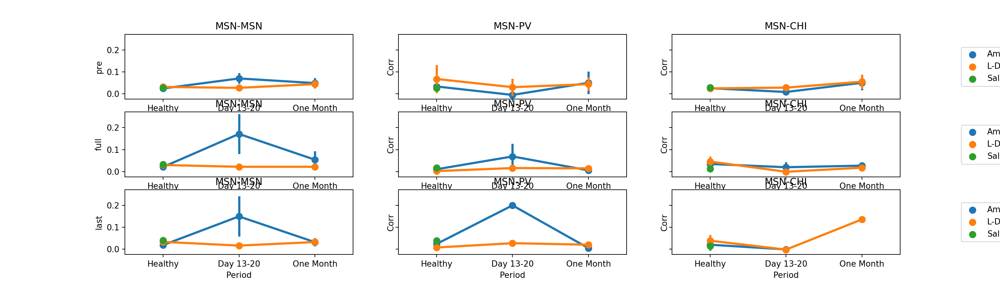

In [67]:
fig, ax = plt.subplots(3,3,figsize=(17.04,4.88), sharey=True)

df = pd.read_csv('bySessCompareCorr2_post.csv')
df2 = df.melt(id_vars = ['Mouse','Sess','Period','population','Drug','timeRange'],value_vars=['aSymCorr','personF','sASymCorr','sPersonF'],
                         var_name='varType', value_name='Corr')#.groupby(['Period','Sess','population','varType']).mean()
df2.reset_index(inplace=True)
tName = ['pre','full','last']
for indT in range(0,3):
    g = sns.pointplot(x="Period", y="Corr",hue = "Drug",ci=68,  ax = ax[indT,0], data=df2[(df2.population=='MSN-MSN')&(df2.varType=='aSymCorr')&(df2.timeRange==tName[indT])], order = ['Healthy', 'Day 13-20', 'One Month'])
    ax[indT,0].set_title('MSN-MSN')
    ax[indT,0].set_ylabel(tName[indT])
    g.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
    g = sns.pointplot(x="Period", y="Corr",hue = "Drug",ci=68, ax = ax[indT,1], data=df2[(df2.population=='MSN-PV')&(df2.varType=='aSymCorr')&(df2.timeRange==tName[indT])], order = ['Healthy', 'Day 13-20', 'One Month'])
    ax[indT,1].set_title('MSN-PV')
    g.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
    g = sns.pointplot(x="Period", y="Corr",hue = "Drug",ci=68, ax = ax[indT,2], data=df2[(df2.population=='MSN-CHI')&(df2.varType=='aSymCorr')&(df2.timeRange==tName[indT])], order = ['Healthy',  'Day 13-20', 'One Month'])
    ax[indT,2].set_title('MSN-CHI')
    g.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
#g = sns.boxplot(x="Period", y="Corr", hue="varType", data=df2[(df2.population=='MSN-MSN')&(df2.varType=='personF')], order = ['Healthy', 'Day 1-4', 'Day 5-12', 'Day 13-20', 'One Month'])
#ax[0].set_ylim(-0.01,0.20)

<IPython.core.display.Javascript object>


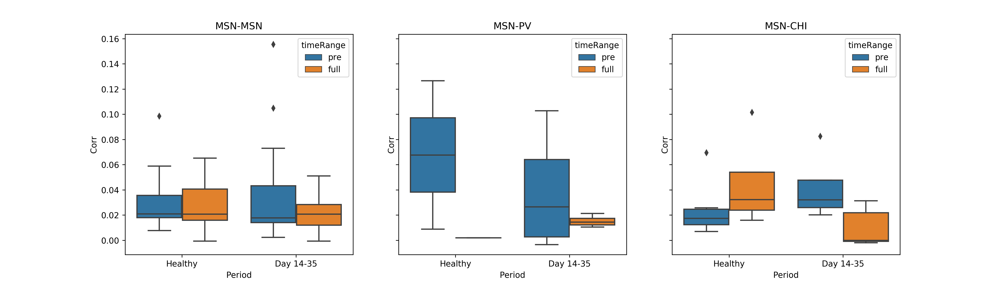

     index  Mouse            Sess     Period population timeRange   varType  \
0        0    761  0761_BaselineL    Healthy    MSN-CHI       pre  aSymCorr   
1        1    761  0761_BaselineL    Healthy    MSN-MSN       pre  aSymCorr   
2        2    761  0761_BaselineL    Healthy    MSN-CHI      full  aSymCorr   
3        3    761  0761_BaselineL    Healthy    MSN-MSN      full  aSymCorr   
4        4    761     0761_day19L  Day 14-35    MSN-CHI       pre  aSymCorr   
..     ...    ...             ...        ...        ...       ...       ...   
555    555   8815     8815_day19L  Day 14-35    MSN-MSN      full  sPersonF   
556    556   8815     8815_day34L  Day 14-35    MSN-CHI       pre  sPersonF   
557    557   8815     8815_day34L  Day 14-35    MSN-MSN       pre  sPersonF   
558    558   8815     8815_day34L  Day 14-35    MSN-CHI      full  sPersonF   
559    559   8815     8815_day34L  Day 14-35    MSN-MSN      full  sPersonF   

         Corr  
0    0.069546  
1    0.056678  
2  

In [16]:
%matplotlib inline
figFolder = '/home/dana_z/ssd_2TB/6OHDA/figs/paper1_edit5/'
fig, ax = plt.subplots(1,3,figsize=(17.04,4.88), sharey=True)

df = pd.read_csv('bySessCompareCorr2_post.csv')
def periodCalc(day):
    if day== 0:
        return 'Healthy'
    elif day<13:
        return 'Day 1-13'
    else:
        return 'Day 14-35'
    
df['Period'] = df.apply(lambda row: periodCalc(row.Day), axis = 1)
df = df[(df.Drug == 'L-Dopa')&(df.timeRange != 'last')]


df2 = df.melt(id_vars = ['Mouse','Sess','Period','population','timeRange'],value_vars=['aSymCorr','personF','sASymCorr','sPersonF'],
                         var_name='varType', value_name='Corr')#.groupby(['Period','Sess','population','varType']).mean()
df2.reset_index(inplace=True)


g = sns.boxplot(x="Period", y="Corr",hue = "timeRange",  ax = ax[0], data=df2[(df2.population=='MSN-MSN')&(df2.varType=='aSymCorr')],
                order = ['Healthy', 'Day 14-35'])

ax[0].set_title('MSN-MSN')

g = sns.boxplot(x="Period", y="Corr",hue = "timeRange",  ax = ax[1], data=df2[(df2.population=='MSN-PV')&(df2.varType=='aSymCorr')],
                order = ['Healthy', 'Day 14-35'])
ax[1].set_title('MSN-PV')

g = sns.boxplot(x="Period", y="Corr",hue = "timeRange",  ax = ax[2], data=df2[(df2.population=='MSN-CHI')&(df2.varType=='aSymCorr')],
                order = ['Healthy', 'Day 14-35'])
ax[2].set_title('MSN-CHI')





# tName = ['pre','full']
# for indT in range(0,3):
#     g = sns.boxplot(x="Period", y="Corr",hue = "Drug",  ax = ax[indT,0], data=df2[(df2.population=='MSN-MSN')&(df2.varType=='aSymCorr')&(df2.timeRange==tName[indT])], order = ['Healthy', 'Day 13-20', 'One Month'])
#     ax[indT,0].set_title('MSN-MSN')
#     ax[indT,0].set_ylabel(tName[indT])
#     g.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
#     g = sns.boxplot(x="Period", y="Corr",hue = "Drug",ax = ax[indT,1], data=df2[(df2.population=='MSN-PV')&(df2.varType=='aSymCorr')&(df2.timeRange==tName[indT])], order = ['Healthy',  'Day 13-20', 'One Month'])
#     ax[indT,1].set_title('MSN-PV')
#     g.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
#     g = sns.boxplot(x="Period", y="Corr",hue = "Drug", ax = ax[indT,2], data=df2[(df2.population=='MSN-CHI')&(df2.varType=='aSymCorr')&(df2.timeRange==tName[indT])], order = ['Healthy',  'Day 13-20', 'One Month'])
#     ax[indT,2].set_title('MSN-CHI')
#     g.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
#g = sns.boxplot(x="Period", y="Corr", hue="varType", data=df2[(df2.population=='MSN-MSN')&(df2.varType=='personF')], order = ['Healthy', 'Day 1-4', 'Day 5-12', 'Day 13-20', 'One Month'])
#ax[0].set_ylim(-0.01,0.20)

In [37]:
# print(df2)
x = df2[(df2.Period == 'Healthy')&(df2.timeRange == 'pre')].aSymCorr.to_numpy()
y = df2[(df2.Period == 'Healthy')&(df2.timeRange == 'full')].aSymCorr.to_numpy()
F,P = sci.stats.wilcoxon(x,y)
print(x-y)
print("healthy: ", P)
x = df2[(df2.Period == 'Day 14-35')&(df2.timeRange == 'pre')].aSymCorr.to_numpy()
y = df2[(df2.Period == 'Day 14-35')&(df2.timeRange == 'full')].aSymCorr.to_numpy()
F,P = sci.stats.wilcoxon(x,y)
print(x-y)
print("Day 14-35: ", P)


[ 0.06367136 -0.01145499 -0.03616727 -0.01294583 -0.0207697  -0.06347767
  0.00319563 -0.01151553  0.03981924 -0.01184061 -0.00302545  0.06588268
  0.02371869]
healthy:  1.0
[ 0.05123515  0.02188398  0.00284379  0.00637772 -0.0004991   0.00414201
  0.00299611  0.04306109  0.01109741  0.03028437  0.00039782]
Day 14-35:  0.0029296875


In [16]:
# Recalculate the LFP align to MSN onset - take a few days to run. 
#     Only run if didn't do that before already (+ one extra time before publishing paper)
#     Comment line 27-29 to recalculate sessions that were already done


# NOTE - this is only last 10min!!
warnings.filterwarnings("ignore")

# open all necassary files 
f = h5py.File('Spectograms.hdf5','r') #LFP coeffs
savePath = '/home/dana_z/HD1/lfp2ca_notNormalize/Post/'

df = pd.DataFrame(columns=['mouse','sess','day','period','cre','numred'])
# constents for analysis:
WinPre = 2 #s
WinPost = 2 #s

# for each mouse: 
for m in miceList:
    data =  getData(Files[1],['lfp','trace'],period ='Post', mice=m)
    cre = getCreType(Files[1],m)
    for sess in tqdm(data.keys()): 
        if sess[5] == 'B':
            day = 0
        else:
            day = int(re.findall(r'\d+',sess[5:])[0])
            
        if sess[-1] == 'S':
            drug = 'Saline'
        elif sess[-1] == 'L':
            drug = 'L-Dopa'
        else:
            drug = 'Amphetamine'

        numRed = int(data[sess]['trace']['numred'])


        if os.path.exists(savePath+'MSN/'+sess):
            df.append({'mouse':m,'sess':sess,'day':day,'drug':drug,'timeRange':'last','period': periodCalc(day),'cre':cre,'numred':numRed},ignore_index=True)
            continue

        # get data
        Ca = getOnsetOrPeriod(m,sess,'Post','caOnset_Hf')
        Ca[:,:-12000] = 0
        dCa = np.append(Ca[:,1:]-Ca[:,:-1],np.zeros((Ca.shape[0],1)),axis=1)
        dCa[dCa==-1] = 0
        
        coeff = np.abs(f[m][sess]['Post']['coeff'].value)
        lfpOutliers = removeLFPOutliers(data[sess]['lfp']['lfp'], sess)
        try:
            coeff[:,(lfpOutliers[:,0]==1)] = np.nan
            coeff= coeff.T
            #coeff = coeff.T/np.nansum(coeff,axis=1) # So that axis[0] is the time axis + normalize power in frequency per sesion
        except:
            print(sess)
            continue
        
        dtS = float(1/data[sess]['trace']['FS'])
        dtL = float(1/data[sess]['lfp']['FS'])
        ts = np.arange(0, np.max(data[sess]['trace']['dff'].shape)) * dtS 
        tl = np.arange(0, np.max(data[sess]['lfp']['lfp'].shape)) * dtL

        tPlot = np.linspace(-WinPre,WinPost,int((WinPre+WinPost)/dtL))     
        

        # for every Cre neuron:
        dca = dCa[0:numRed,:]
        dca = dca[np.sum(dca,axis=1)!=0,:]
        
        for creN in range(0,np.min(dca.shape)):
            onsetL = np.full_like(tl,False)
            cN = dca[creN,:]
            for si in ts[cN.astype(bool)]:
                ti = np.argmin(np.abs(tl-si))
                onsetL[ti] = True
            al = alignToOnset(coeff,(onsetL==1), winPost =WinPre/dtL, winPre = WinPost/dtL)

            if al.ndim <3:
                try:
                    al = np.reshape(al,(al.shape[0],al.shape[1],1))
                except:
                    print('no onset, when there should be. CRE#',creN,' in sess= ',sess)
                    continue
            al = np.nanmean(al,axis=2,keepdims=True)
            al = np.nan_to_num(al,nan=-9999)
            
            if 'aligned' in locals():
                aligned = np.concatenate((aligned,al), axis = 2)
            else:
                aligned = al
        
        if np.min(dca.shape)>0:
            pickle.dump( aligned, open( savePath+"CRE/"+sess, "wb" ), protocol=4 )
            del aligned
        
        # for every MSN neuron:
        dca = dCa[numRed:,:]
        dca = dca[np.sum(dca,axis=1)!=0,:]
        
        for msnN in range(0,np.min(dca.shape)):
            onsetL = np.full_like(tl,False)
            mN = dca[msnN,:]
            for si in ts[mN.astype(bool)]:
                ti = np.argmin(np.abs(tl-si))
                onsetL[ti] = True
            al = alignToOnset(coeff,(onsetL==1), winPost =WinPre/dtL, winPre = WinPost/dtL)

            if al.ndim <3:
                try:
                    al = np.reshape(al,(al.shape[0],al.shape[1],1))
                except:
                    print('no onset, when there should be. MSN#',msnN,' in sess= ',sess)
                    continue
            
            al = np.nanmean(al,axis=2,keepdims=True)
            al = np.nan_to_num(al,nan=-9999)
            if 'aligned' in locals():
                aligned = np.concatenate((aligned,al), axis = 2)
            else:
                aligned = al
        
        if np.min(dca.shape)>0:
            pickle.dump( aligned, open( savePath+"MSN/"+sess, "wb" ) , protocol=4)
            del aligned
        
        # add session to df, so can be retrived
        df.append({'mouse':m,'sess':sess,'day':day,'drug':drug,'timeRange':'last','period': periodCalc(day),'cre':cre,'numred':numRed},ignore_index=True)

df.to_csv(savePath+'sessions')


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data


  0%|          | 0/13 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data
I deleted session: 1208_day12


 46%|████▌     | 6/13 [11:03<10:46, 92.37s/it] 

found  17.0  outlier points


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data


  0%|          | 0/3 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data
found  1.0  outlier points


 64%|██████▍   | 9/14 [04:29<02:19, 27.97s/it]

found  888231.0  outlier points


 71%|███████▏  | 10/14 [06:07<03:15, 49.00s/it]

found  481139.0  outlier points


  0%|          | 0/3 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data


  0%|          | 0/13 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data
I deleted session: 2976_day4
found  1.0  outlier points


 92%|█████████▏| 12/13 [03:11<00:14, 14.18s/it]

found  3.0  outlier points


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data


 43%|████▎     | 6/14 [04:29<05:31, 41.46s/it]

found  50.0  outlier points


  0%|          | 0/19 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data


 21%|██        | 4/19 [09:43<30:25, 121.72s/it]

found  29.0  outlier points


  0%|          | 0/17 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data


  0%|          | 0/19 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data


  0%|          | 0/13 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data


 93%|█████████▎| 13/14 [11:09<00:31, 31.07s/it]

8803_day6


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data


 93%|█████████▎| 13/14 [04:15<00:14, 14.52s/it]

8815_day6


100%|██████████| 14/14 [04:49<00:00, 20.65s/it]


In [25]:
# Recalculate the LFP align to mvmt onset  
#     Only run if didn't do that before already (+ one extra time before publishing paper)
#     Comment line 27-29 to recalculate sessions that were already done
warnings.filterwarnings("ignore")

# open all necassary files 
f = h5py.File('Spectograms.hdf5','r') #LFP coeffs
savePath = '/home/dana_z/HD1/lfp2speed2/'

df = pd.DataFrame(columns=['mouse','sess','day','period','cre','numred'])
# constents for analysis:
WinPre = 2 #s
WinPost = 2 #s

# for each mouse: 
for m in miceList:
    data =  getData(Files[1],['lfp','speed'],period ='Pre', mice=m)
    cre = getCreType(Files[1],m)
    for sess in tqdm(data.keys()): 
        if sess[5] == 'B':
            day = 0
        else:
            day = int(re.findall(r'\d+',sess[5:])[0])


        # get data
        sOnset = getOnsetOrPeriod(m,sess,'Pre','mvmtOnset2')
        
        if np.sum(sOnset)==0:
            continue

        coeff = np.abs(f[m][sess]['Pre']['coeff'].value)
        lfpOutliers = removeLFPOutliers(data[sess]['lfp']['lfp'], sess)
        try:
            coeff[:,(lfpOutliers[:,0]==1)] = np.nan
            coeff= coeff.T
            #coeff = coeff.T/np.nansum(coeff,axis=1) # So that axis[0] is the time axis + normalize power in frequency per sesion
        except:
            print(sess)
            continue
        

        dtS = float(1/data[sess]['speed']['Fs'])
        dtL = float(1/data[sess]['lfp']['FS'])
        ts = np.arange(0, np.max(data[sess]['speed']['speed'].shape)) * dtS 
        tl = np.arange(0, np.max(data[sess]['lfp']['lfp'].shape)) * dtL

        tPlot = np.linspace(-WinPre,WinPost,int((WinPre+WinPost)/dtL))     
        
        # for every speed onset:
        
        onsetL = np.full_like(tl,False)
        for si in ts[sOnset.astype(bool)]:
            ti = np.argmin(np.abs(tl-si))
            onsetL[ti] = True
        al = alignToOnset(coeff,(onsetL==1), winPost =WinPre/dtL, winPre = WinPost/dtL)

        if al.ndim <3:
            try:
                al = np.reshape(al,(al.shape[0],al.shape[1],1))
            except:
                print('no onset, when there should be. in sess= ',sess)
                continue

        #al = np.nanmean(al,axis=2,keepdims=True)
        al = np.nan_to_num(al,nan=-9999)
        if 'aligned' in locals():
            aligned = np.concatenate((aligned,al), axis = 2)
        else:
            aligned = al

        if np.sum(sOnset)>0:
            pickle.dump( aligned, open( savePath+sess, "wb" ) , protocol=4)
            del aligned
         
        # add session to df, so can be retrived
        df= df.append({'mouse':m,'sess':sess,'day':day,'period': periodCalc(day),'cre':cre},ignore_index=True)

df.to_csv(savePath+'sessions')


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/13 [00:00<?, ?it/s]

cleaning up lfp data
I deleted session: 1208_day12
cleaning up speed data


 46%|████▌     | 6/13 [00:17<00:24,  3.47s/it]

found  17.0  outlier points


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/3 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data
found  1.0  outlier points


 64%|██████▍   | 9/14 [00:55<00:31,  6.31s/it]

found  888231.0  outlier points


 71%|███████▏  | 10/14 [01:01<00:24,  6.25s/it]

found  481139.0  outlier points


  0%|          | 0/3 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/13 [00:00<?, ?it/s]

cleaning up lfp data
I deleted session: 2976_day4
cleaning up speed data
found  1.0  outlier points


 92%|█████████▏| 12/13 [01:09<00:05,  5.93s/it]

found  3.0  outlier points


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


 43%|████▎     | 6/14 [00:33<00:45,  5.64s/it]

found  50.0  outlier points


  0%|          | 0/19 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


 26%|██▋       | 5/19 [00:27<01:18,  5.59s/it]

found  29.0  outlier points


  0%|          | 0/17 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/19 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/13 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


 93%|█████████▎| 13/14 [01:08<00:05,  5.70s/it]

8803_day6


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


 93%|█████████▎| 13/14 [01:13<00:05,  5.53s/it]

8815_day6


100%|██████████| 14/14 [01:19<00:00,  5.66s/it]


<IPython.core.display.Javascript object>


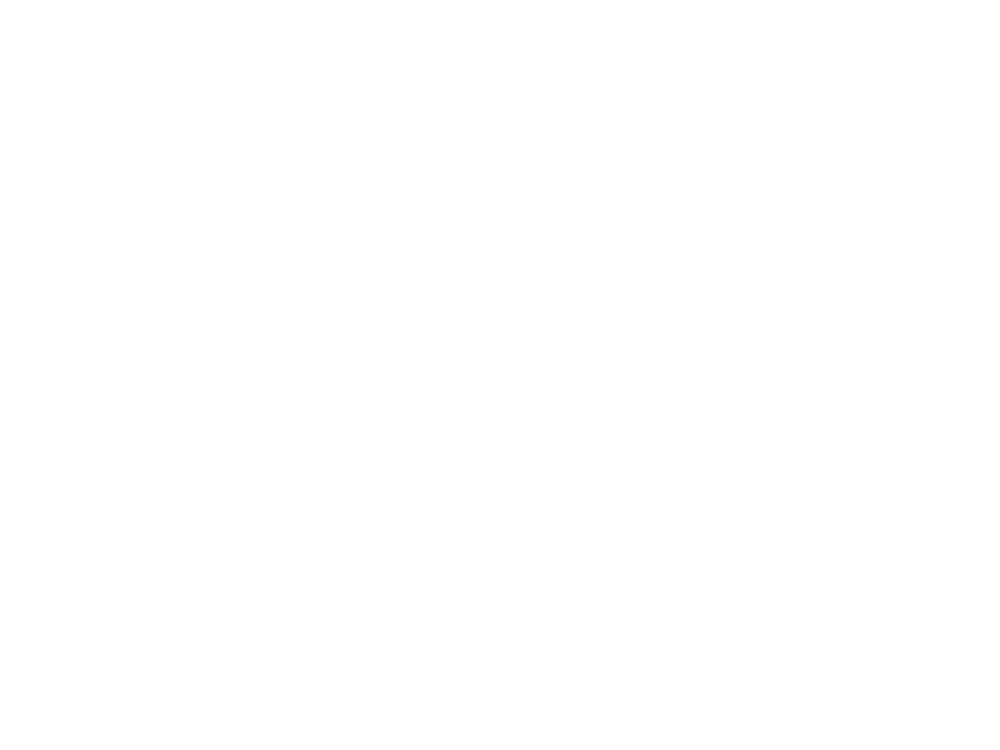

<IPython.core.display.Javascript object>


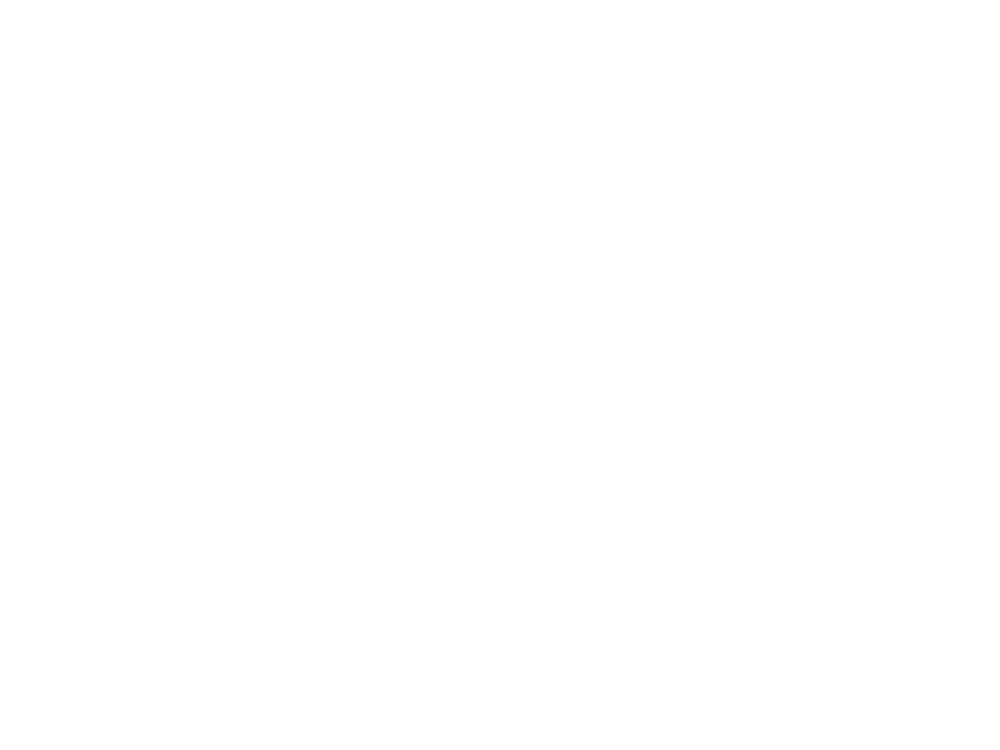

<IPython.core.display.Javascript object>


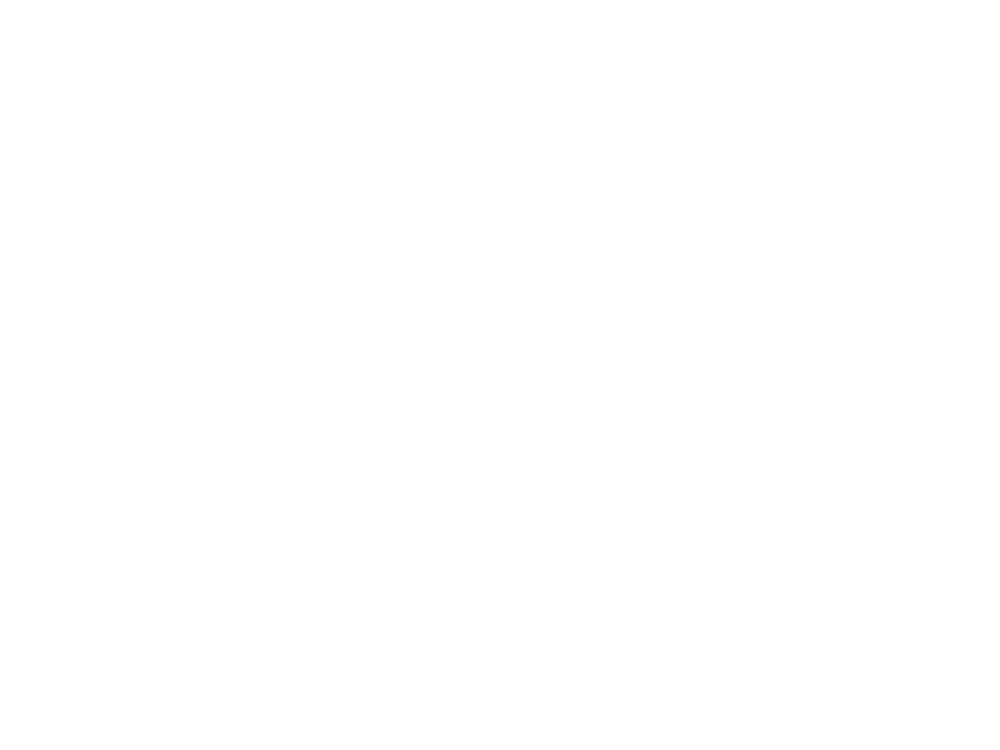

<IPython.core.display.Javascript object>


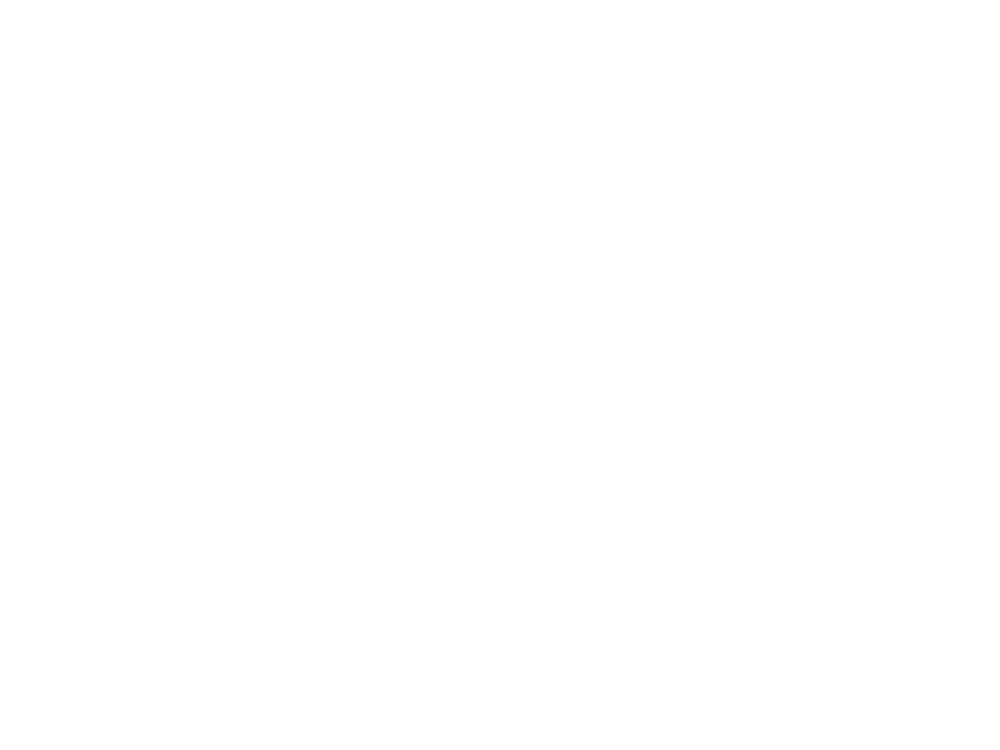

<IPython.core.display.Javascript object>


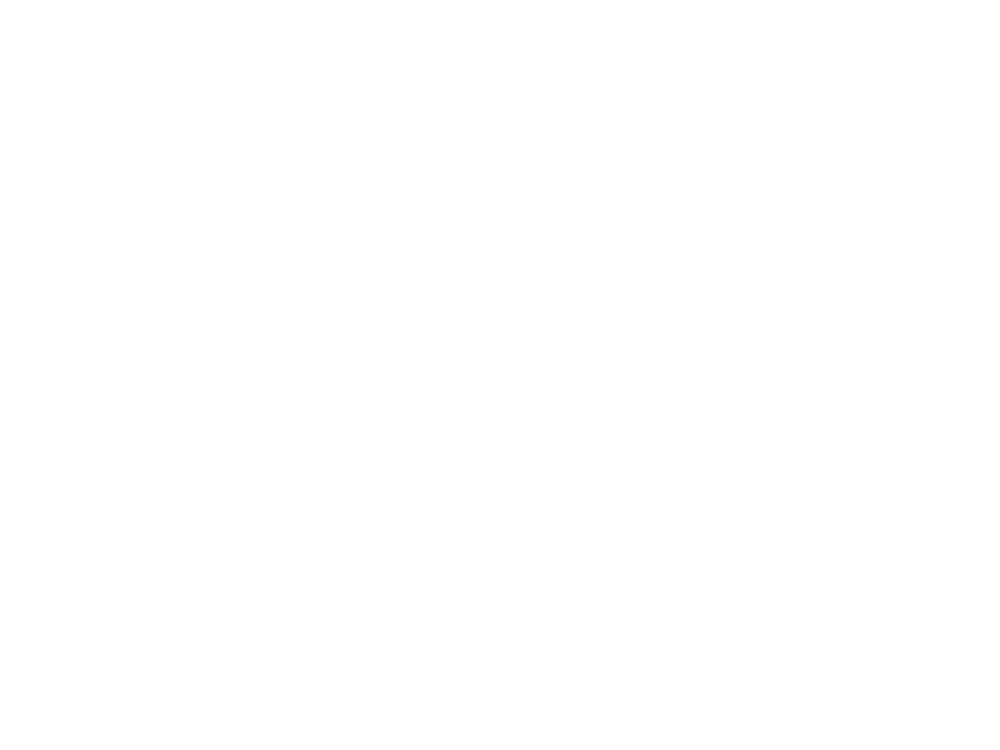

In [18]:
# plot LFP aligned to MSN
df = pd.read_csv('/home/dana_z/HD1/lfp2ca_notNormalize/sessions')
cells = ['MSN']
f = h5py.File('Spectograms.hdf5','r')
freq = f['0761']['freq'].value
dtL = 0.00032768
tPlot = np.linspace(-2,2,int(4/dtL-1))
for per in df.period.unique():
    cellType = 'MSN'
    cre = None
    if per == 'One Month': 
        # remove from figure only because too many outliers (Nan) makes the figure granular
        # data was still used for analysis
        l = getMiceList(Files[1])
        l.remove('1236')
        A,df2 = getAlignedLFP(cellType,cre = cre, period = per,mice=l)
    else:
        A,df2 = getAlignedLFP(cellType,cre = cre, period = per)
    if A.shape[2] > 1000:
        b = A[:,:,0:1000]
        mu = np.mean(b[:int(b.shape[0]/2),:,:],axis=0)
        Std = np.std(b[:int(b.shape[0]/2),:,:],axis=0)
        b =(b-mu)/Std
        b = np.nansum(b,axis=2)
        for ind in range(0,A.shape[2]//1000):
            c = A[:,:,1000*(ind+1):np.min([A.shape[2],1000*(ind+2)])]
            mu = np.mean(c[:int(c.shape[0]/2),:,:],axis=0)
            Std = np.std(c[:int(c.shape[0]/2),:,:],axis=0)
            c =(c-mu)/Std
            c = np.nansum(c,axis=2)
            b = b+c
        b= b/A.shape[2]
    else:
        b = A
        mu = np.mean(b[:int(b.shape[0]/2),:,:],axis=0)
        Std = np.std(b[:int(b.shape[0]/2),:,:],axis=0)
        b =(b-mu)/Std
        b = np.nanmean(b,axis=2)
    pickle.dump(b, open(figFolder+per+'.p',"wb"),protocol=4)
    del A,b
    b = pickle.load(open(figFolder+per+'.p',"rb"))

    fig, ax = plt.subplots()
    CS=ax.pcolormesh(tPlot,freq,b.T, rasterized=True,vmax =0.6,vmin=-0.2)
    fig.colorbar(CS)
    ax.set_title(per,fontsize=20)
#    fig.savefig(figFolder+'figure5b_MSN_'+per+'.png',format='png')
    fig.savefig(figFolder+'figure5b_MSN'+per+'.svg',format='svg',transparent=True)
    fig.clf()
    plt.close(fig)



<IPython.core.display.Javascript object>


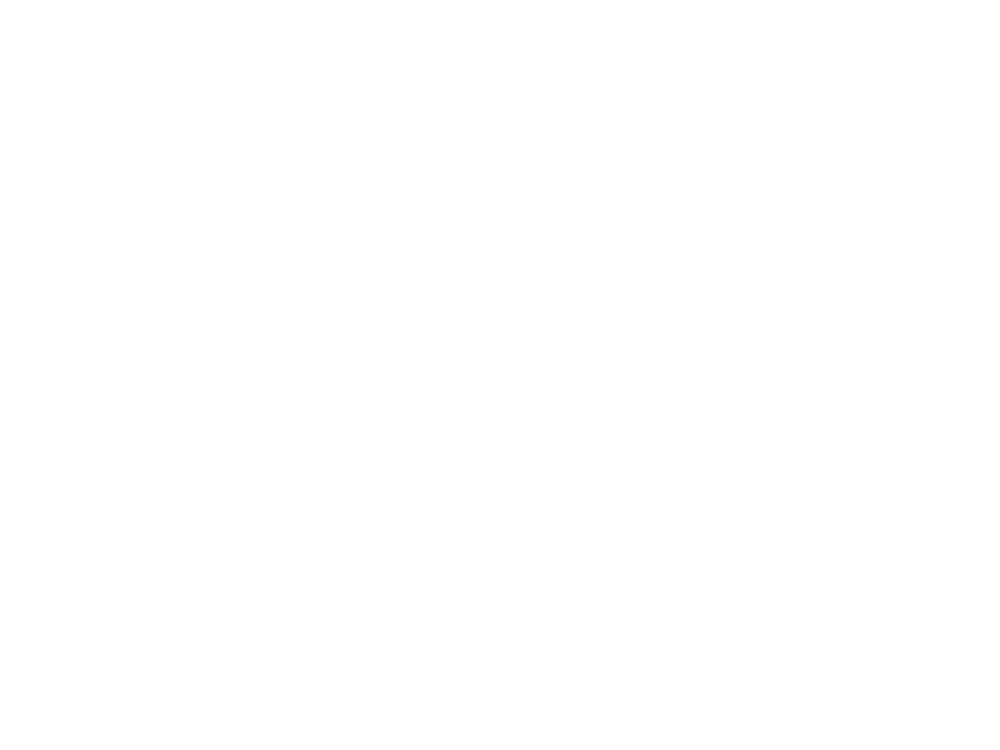

<IPython.core.display.Javascript object>


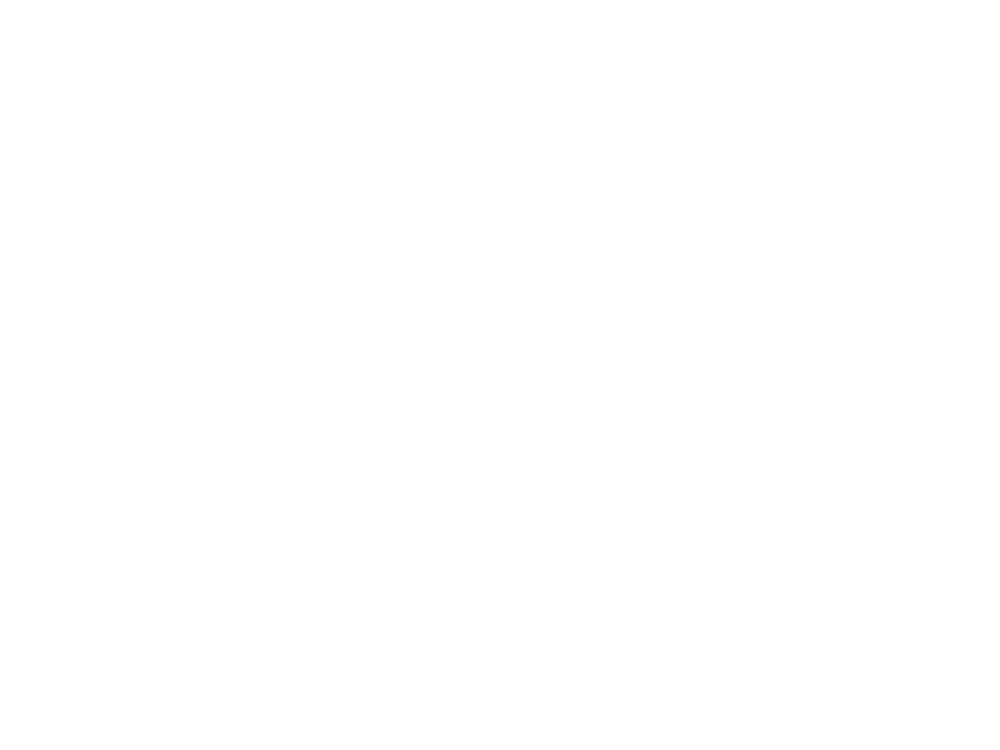

<IPython.core.display.Javascript object>


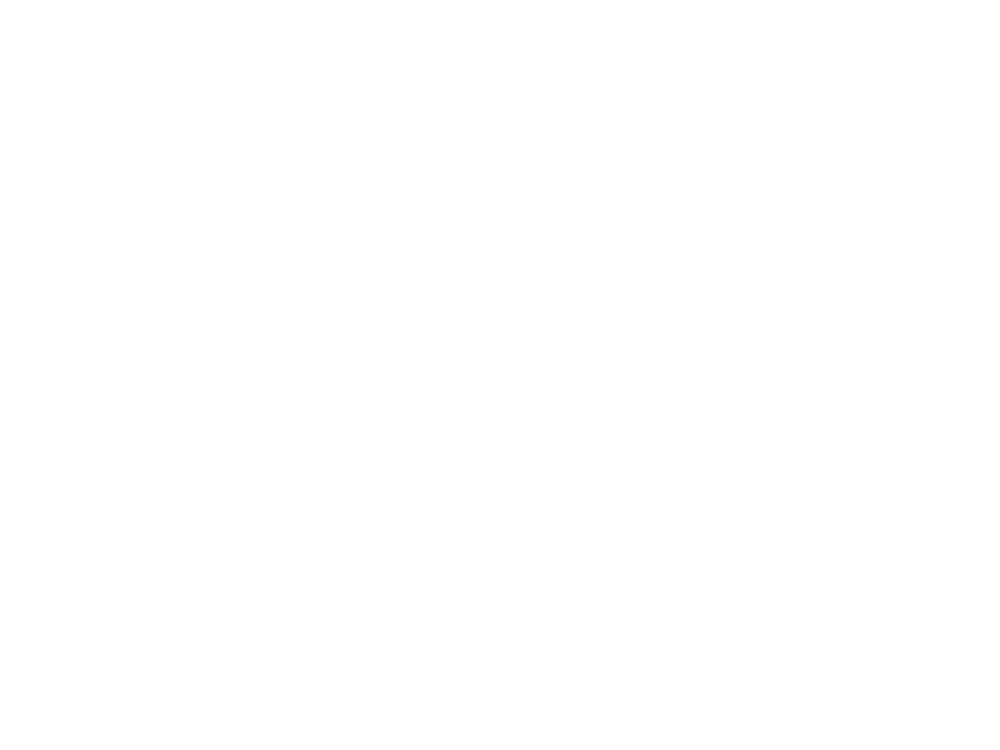

<IPython.core.display.Javascript object>


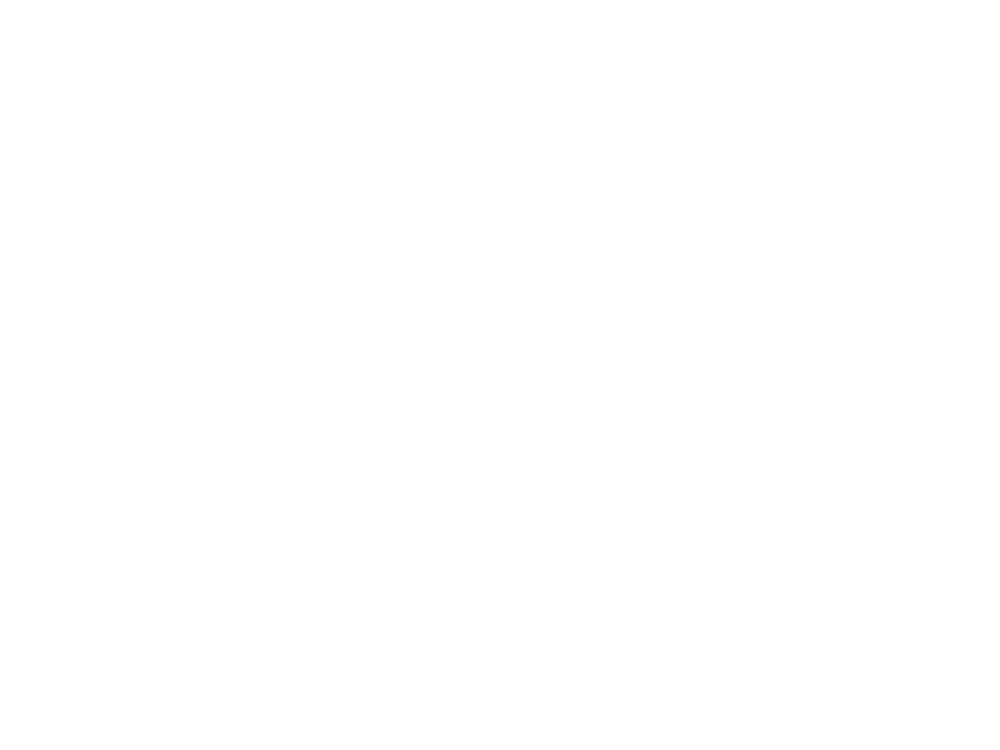

<IPython.core.display.Javascript object>


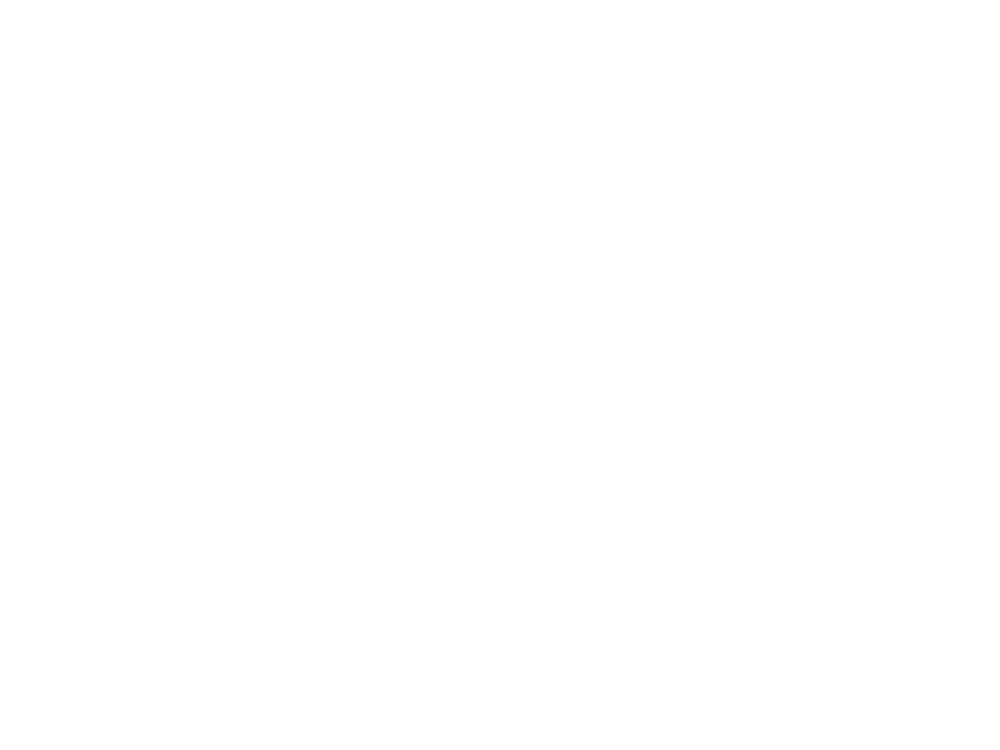

In [19]:
df = pd.read_csv('/home/dana_z/HD1/lfp2ca_notNormalize/sessions')
cells = ['MSN']
f = h5py.File('Spectograms.hdf5','r')
freq = f['0761']['freq'].value
dtL = 0.00032768
tPlot = np.linspace(-2,2,int(4/dtL-1))
for per in df.period.unique():
    cellType = 'CRE'
    cre = 'CHI'
    if per == 'One Month': 
        # remove from figure only because too many outliers (Nan) makes the figure granular
        # data was still used for analysis
        l = getMiceList(Files[1])
        l.remove('1236')
        A,df2 = getAlignedLFP(cellType,cre = cre, period = per,mice=l)
    else:
        A,df2 = getAlignedLFP(cellType,cre = cre, period = per)
    if A.shape[2] > 1000:
        b = A[:,:,0:1000]
        mu = np.mean(b[:int(b.shape[0]/2),:,:],axis=0)
        Std = np.std(b[:int(b.shape[0]/2),:,:],axis=0)
        b =(b-mu)/Std
        b = np.nansum(b,axis=2)
        for ind in range(0,A.shape[2]//1000):
            c = A[:,:,1000*(ind+1):np.min([A.shape[2],1000*(ind+2)])]
            mu = np.mean(c[:int(c.shape[0]/2),:,:],axis=0)
            Std = np.std(c[:int(c.shape[0]/2),:,:],axis=0)
            c =(c-mu)/Std
            c = np.nansum(c,axis=2)
            b = b+c
        b= b/A.shape[2]
    else:
        b = A
        mu = np.mean(b[:int(b.shape[0]/2),:,:],axis=0)
        Std = np.std(b[:int(b.shape[0]/2),:,:],axis=0)
        b =(b-mu)/Std
        b = np.nanmean(b,axis=2)
    pickle.dump(b, open(figFolder+per+'.p',"wb"),protocol=4)
    del A,b
    b = pickle.load(open(figFolder+per+'.p',"rb"))

    fig, ax = plt.subplots()
    CS=ax.pcolormesh(tPlot,freq,b.T, rasterized=True,vmax =2,vmin=-2)
    fig.colorbar(CS)
    ax.set_title(per,fontsize=20)
#     fig.savefig(figFolder+'figure5_CHI'+per+'normalizedByNeuron.png',format='png')
    fig.savefig(figFolder+'figure5b_CHI'+per+'.svg',format='svg',transparent=True)
    fig.clf()
    plt.close(fig)



<IPython.core.display.Javascript object>


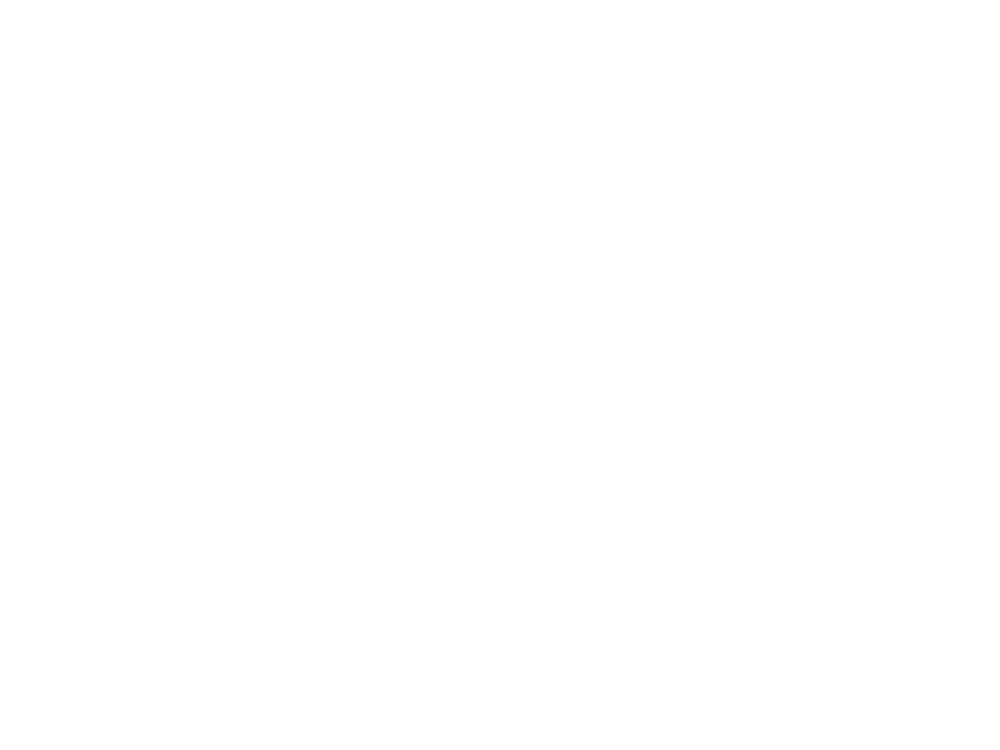

<IPython.core.display.Javascript object>


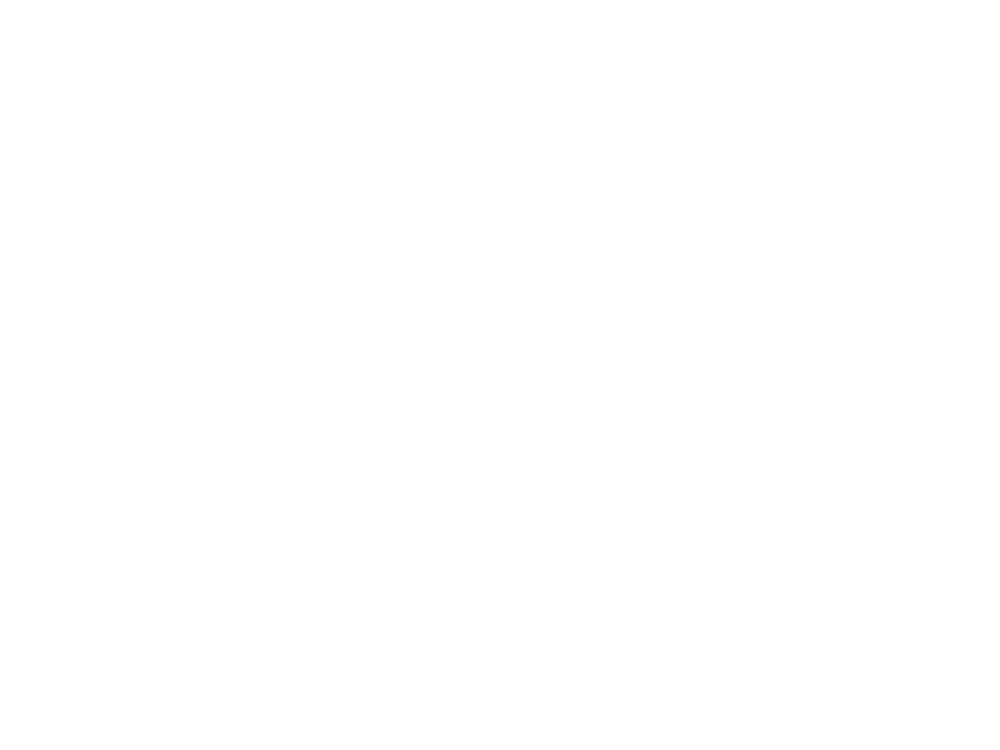

<IPython.core.display.Javascript object>


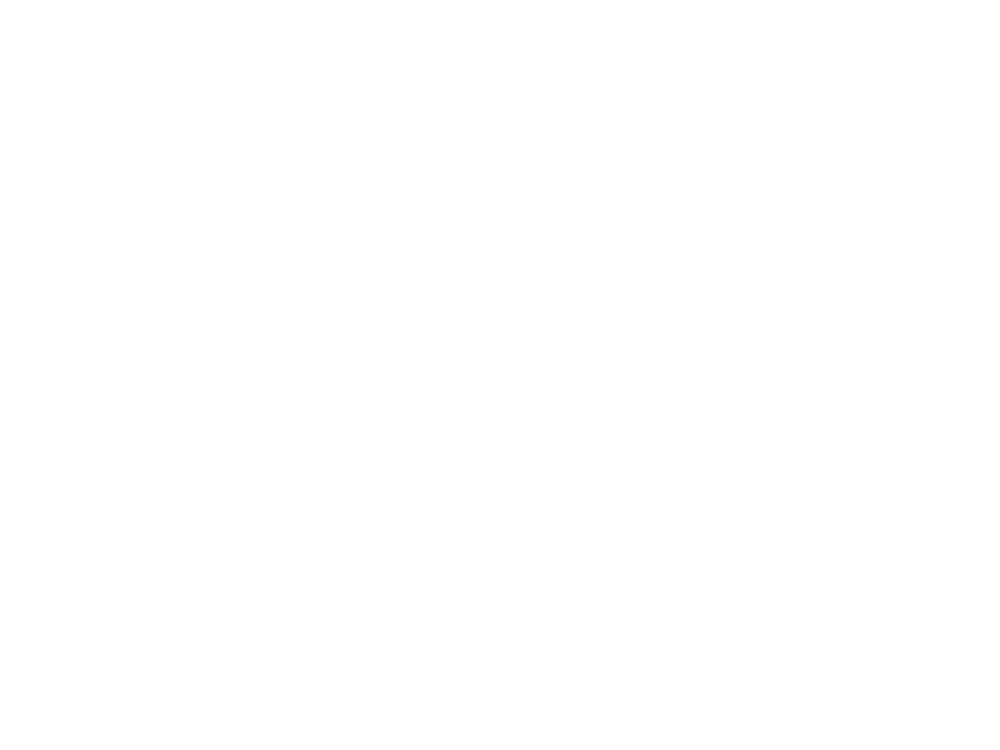

<IPython.core.display.Javascript object>


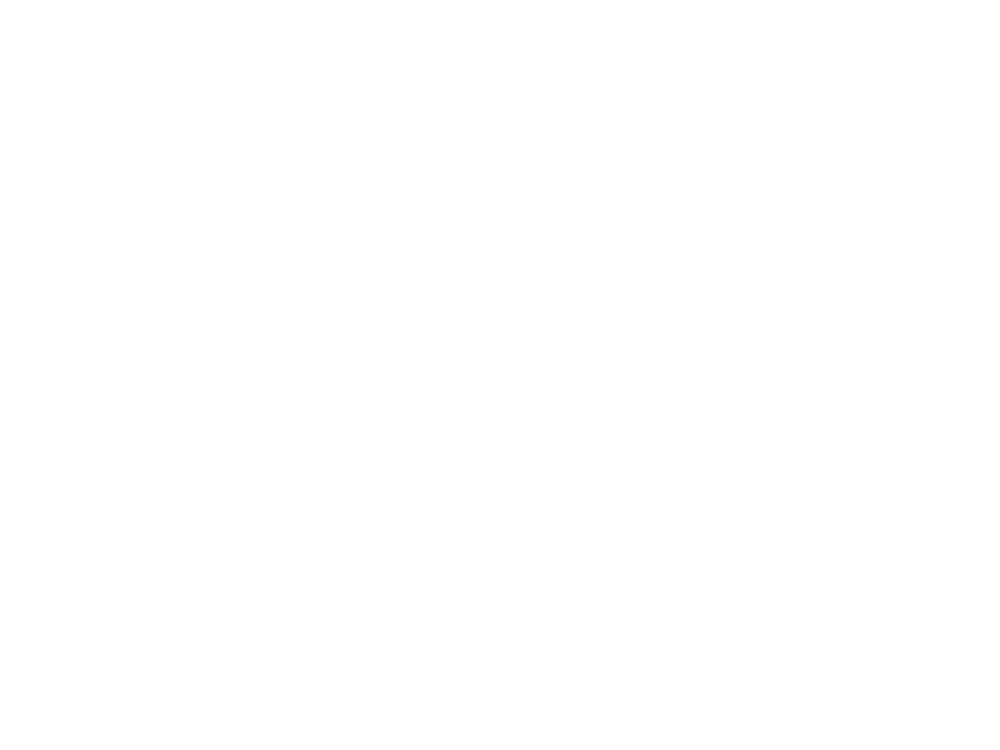

<IPython.core.display.Javascript object>


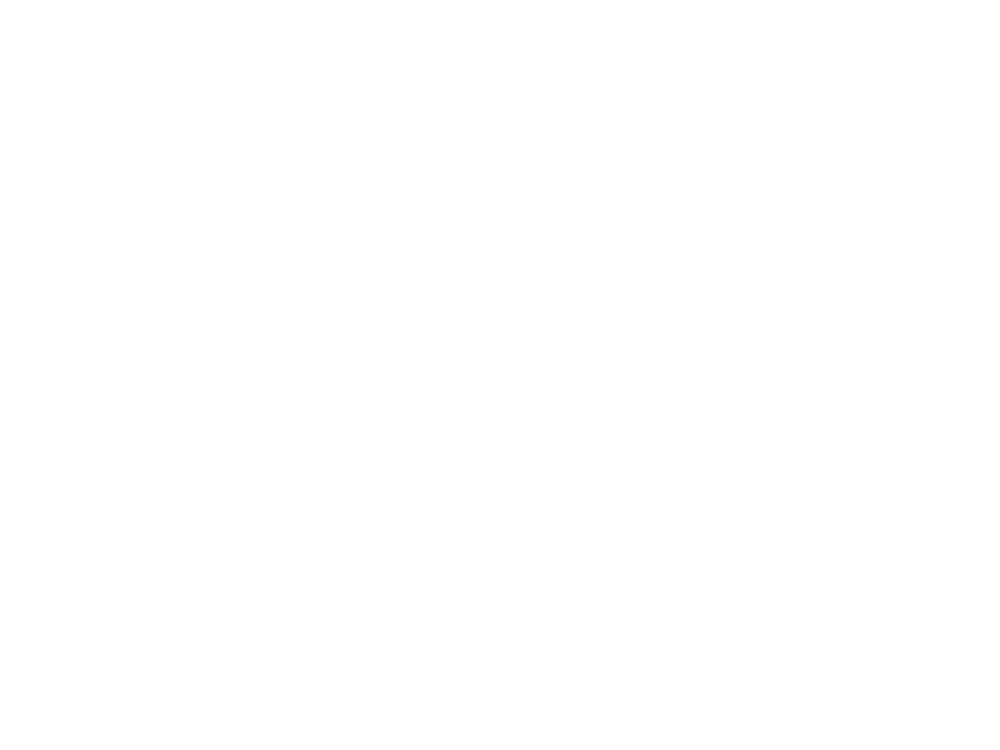

In [20]:
df = pd.read_csv('/home/dana_z/HD1/lfp2ca_notNormalize/sessions')
cells = ['MSN']
f = h5py.File('Spectograms.hdf5','r')
freq = f['0761']['freq'].value
dtL = 0.00032768
tPlot = np.linspace(-2,2,int(4/dtL-1))
for per in df.period.unique():
    cellType = 'CRE'
    cre = 'PV'
    if per == 'One Month': 
        # remove from figure only because too many outliers (Nan) makes the figure granular
        # data was still used for analysis
        l = getMiceList(Files[1])
        l.remove('1236')
        A,df2 = getAlignedLFP(cellType,cre = cre, period = per,mice=l)
    else:
        A,df2 = getAlignedLFP(cellType,cre = cre, period = per)
    if A.shape[2] > 1000:
        b = A[:,:,0:1000]
        mu = np.mean(b[:int(b.shape[0]/2),:,:],axis=0)
        Std = np.std(b[:int(b.shape[0]/2),:,:],axis=0)
        b =(b-mu)/Std
        b = np.nansum(b,axis=2)
        for ind in range(0,A.shape[2]//1000):
            c = A[:,:,1000*(ind+1):np.min([A.shape[2],1000*(ind+2)])]
            mu = np.mean(c[:int(c.shape[0]/2),:,:],axis=0)
            Std = np.std(c[:int(c.shape[0]/2),:,:],axis=0)
            c =(c-mu)/Std
            c = np.nansum(c,axis=2)
            b = b+c
        b= b/A.shape[2]
    else:
        b = A
        mu = np.mean(b[:int(b.shape[0]/2),:,:],axis=0)
        Std = np.std(b[:int(b.shape[0]/2),:,:],axis=0)
        b =(b-mu)/Std
        b = np.nanmean(b,axis=2)
    pickle.dump(b, open(figFolder+per+'.p',"wb"),protocol=4)
    del A,b
    b = pickle.load(open(figFolder+per+'.p',"rb"))

    fig, ax = plt.subplots()
    CS=ax.pcolormesh(tPlot,freq,b.T, rasterized=True,vmax =3,vmin=-1)
    fig.colorbar(CS)
    ax.set_title(per,fontsize=20)
#     fig.savefig(figFolder+'figure5_PV'+per+'normalizedByNeuron.png',format='png')
    fig.savefig(figFolder+'figure5b_PV'+per+'.svg',format='svg',transparent=True)
    fig.clf()
    plt.close(fig)



<IPython.core.display.Javascript object>


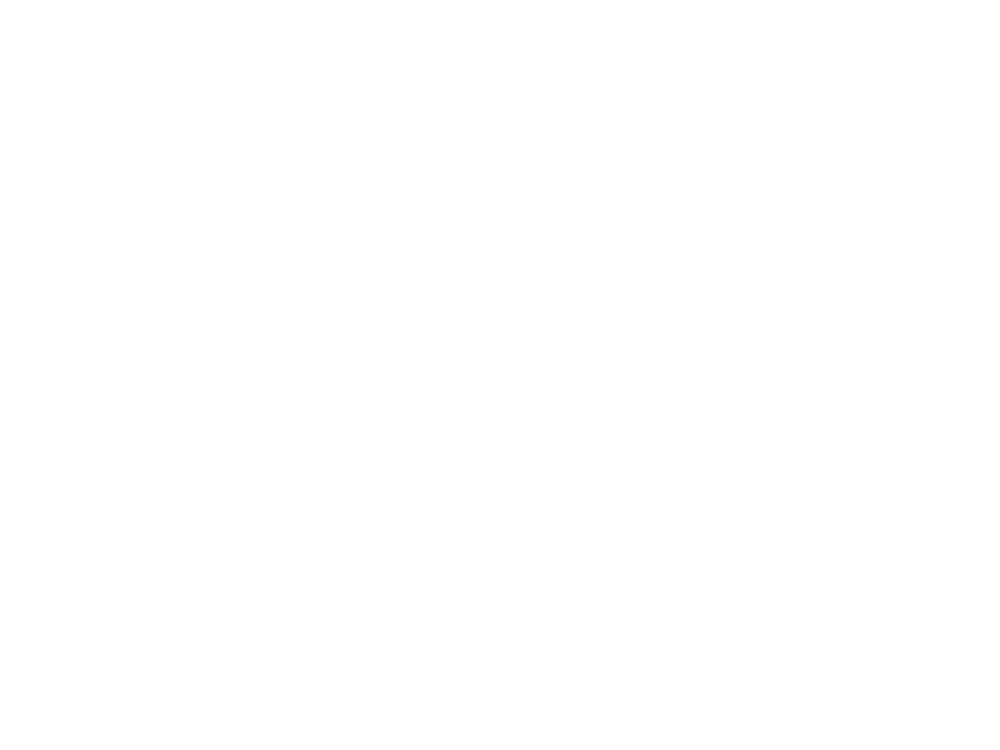

<IPython.core.display.Javascript object>


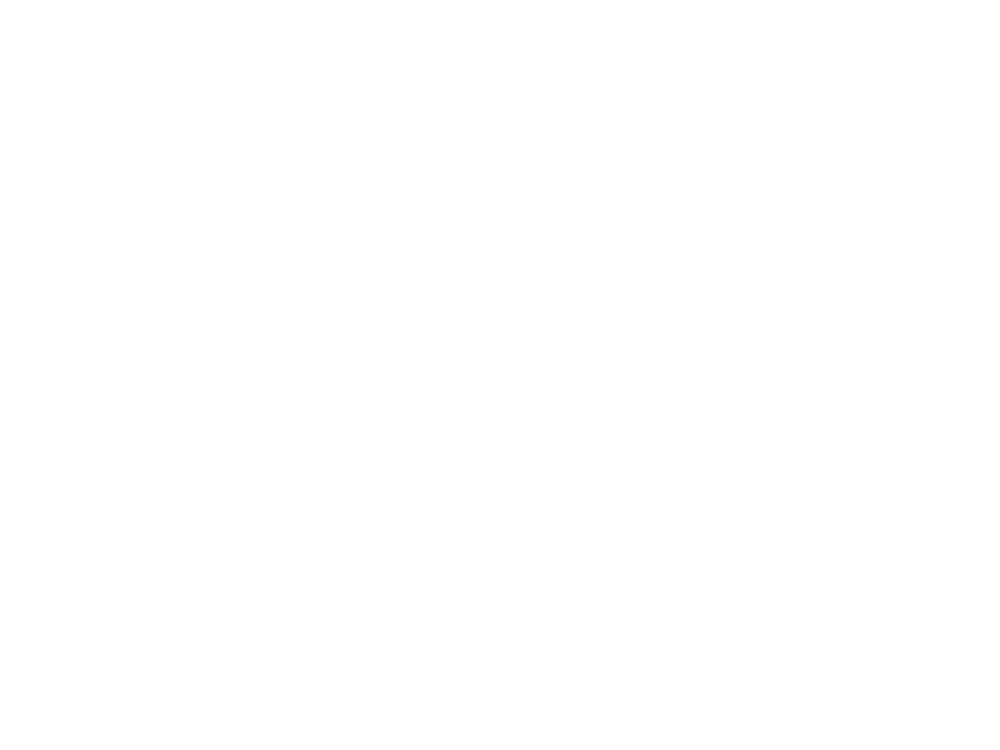

<IPython.core.display.Javascript object>


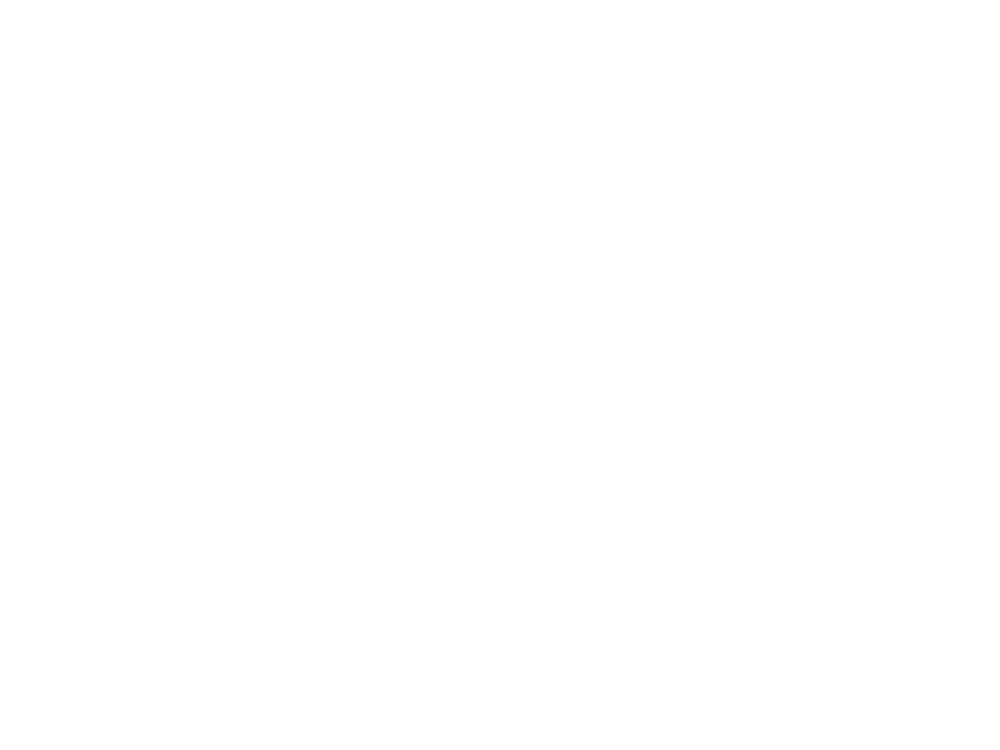

<IPython.core.display.Javascript object>


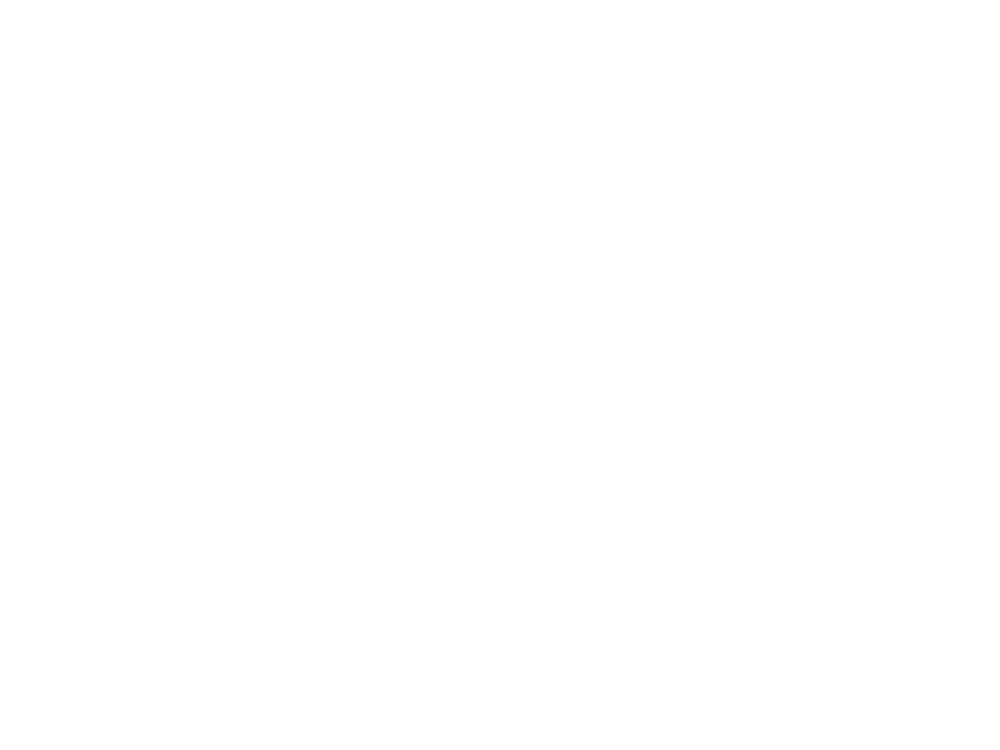

<IPython.core.display.Javascript object>


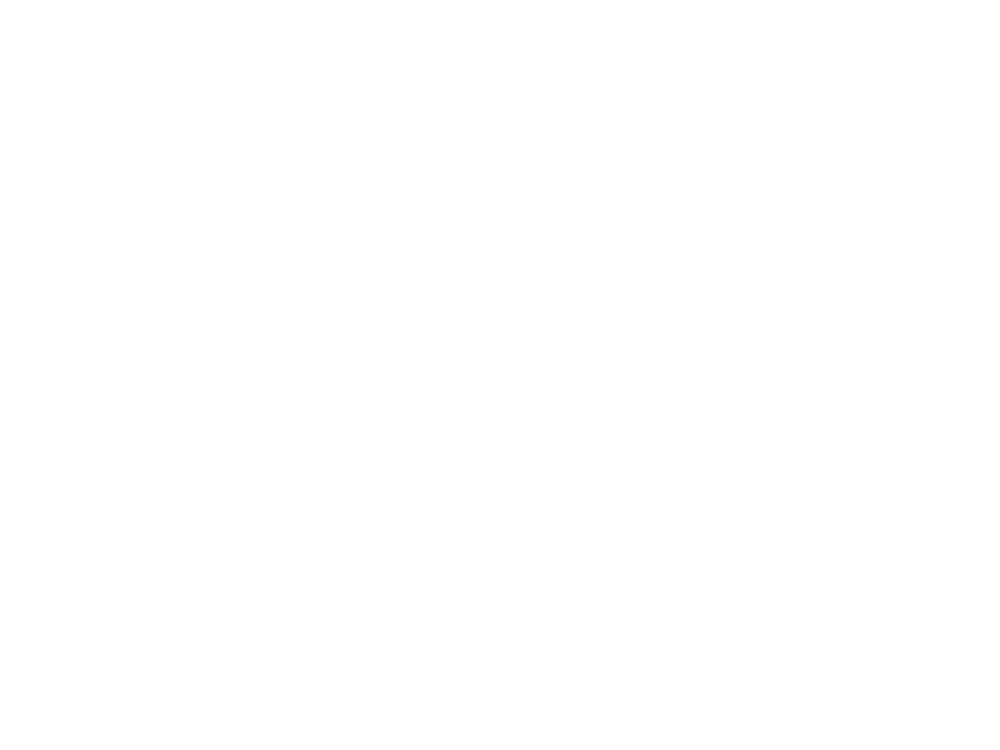

In [84]:
df = pd.read_csv('/home/dana_z/HD1/lfp2speed2/sessions')
savePath = '/home/dana_z/HD1/lfp2speed2/'
f = h5py.File('Spectograms.hdf5','r')
freq = f['0761']['freq'].value
dtL = 0.00032768
tPlot = np.linspace(-2,2,int(4/dtL-1))
for per in df.period.unique():
    if per == 'One Month': 
        # remove from figure only because too many outliers (Nan) makes the figure granular
        # data was still used for analysis
        l = getMiceList(Files[1])
        l.remove('1236')
        A,df2 =getAlignedLFP_mvmt(savePath, mice = l, period = per)
    else:
        A,df2 = getAlignedLFP_mvmt(savePath, period = per)
    if A.shape[2] > 1000:
        b = A[:,:,0:1000]
        mu = np.mean(b[:int(b.shape[0]/2),:,:],axis=0)
        Std = np.std(b[:int(b.shape[0]/2),:,:],axis=0)
        b =(b-mu)/Std
        b = np.nansum(b,axis=2)
        for ind in range(0,A.shape[2]//1000):
            c = A[:,:,1000*(ind+1):np.min([A.shape[2],1000*(ind+2)])]
            mu = np.mean(c[:int(c.shape[0]/2),:,:],axis=0)
            Std = np.std(c[:int(c.shape[0]/2),:,:],axis=0)
            c =(c-mu)/Std
            c = np.nansum(c,axis=2)
            b = b+c
        b= b/A.shape[2]
    else:
        b = A
        mu = np.mean(b[:int(b.shape[0]/2),:,:],axis=0)
        Std = np.std(b[:int(b.shape[0]/2),:,:],axis=0)
        b =(b-mu)/Std
        b = np.nanmean(b,axis=2)
    pickle.dump(b, open(figFolder+per+'.p',"wb"),protocol=4)
    del A,b
    b = pickle.load(open(figFolder+per+'.p',"rb"))

    fig, ax = plt.subplots()
    CS=ax.pcolormesh(tPlot,freq,b.T, rasterized=True,vmax =1.2,vmin=-0.2)
    fig.colorbar(CS)
    ax.set_title(per,fontsize=20)
#     fig.savefig(figFolder+'figure5b_'+per+'Speed_normalizedByonset.png',format='png')
    fig.savefig(figFolder+'figure5b_speed'+per+'.svg',format='svg',transparent=True)
    fig.clf()
    plt.close(fig)



<IPython.core.display.Javascript object>


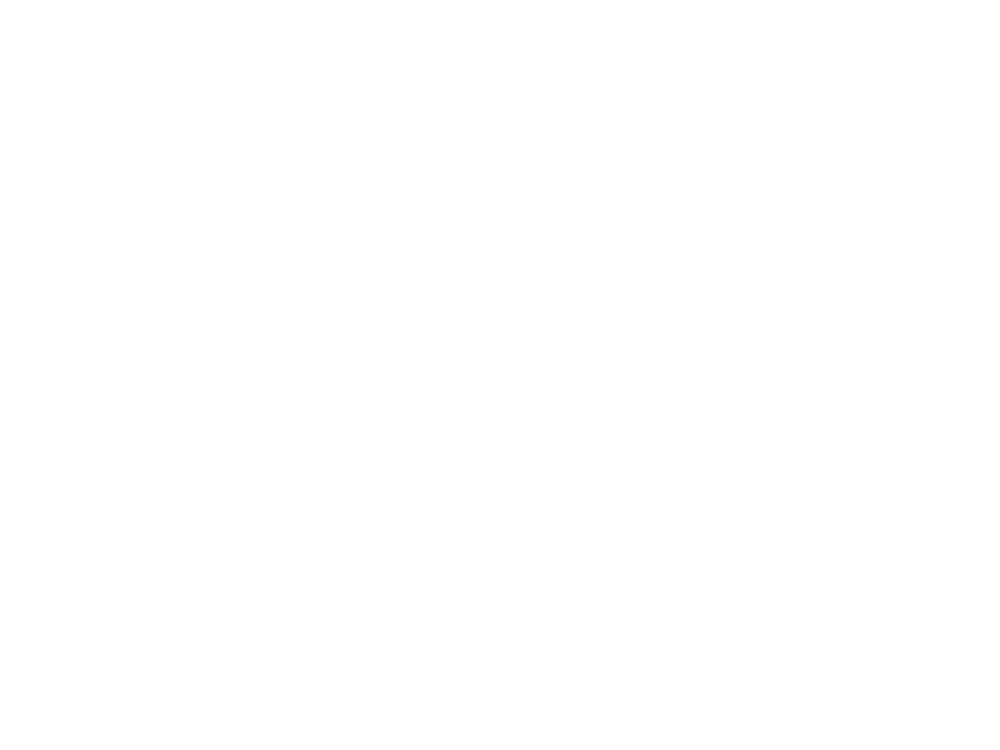

<IPython.core.display.Javascript object>


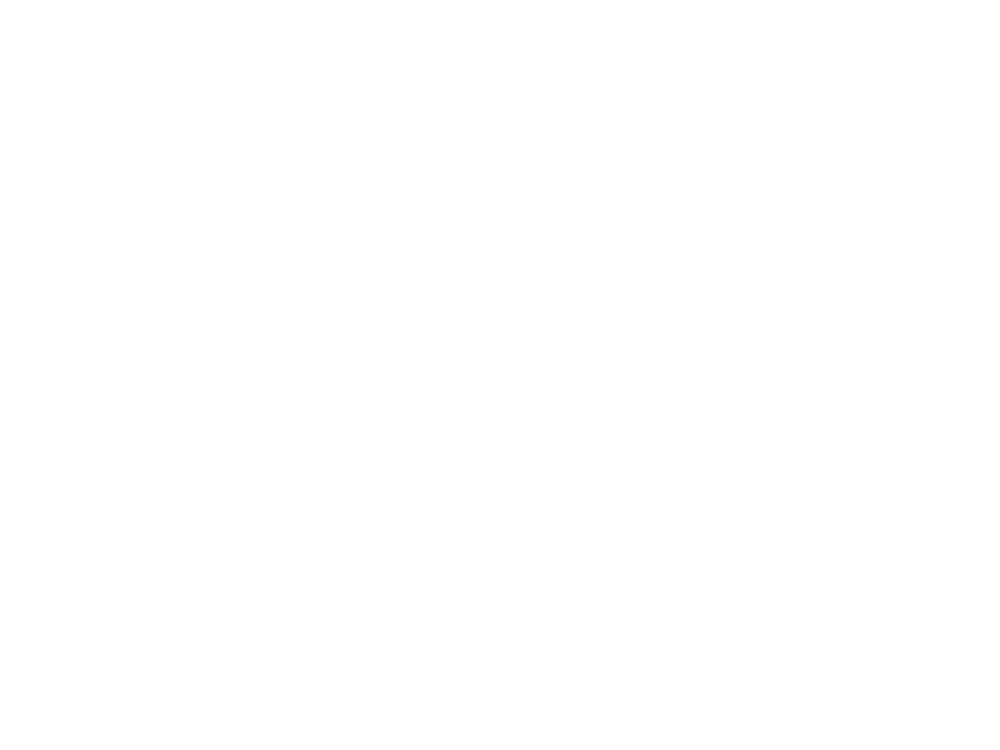

<IPython.core.display.Javascript object>


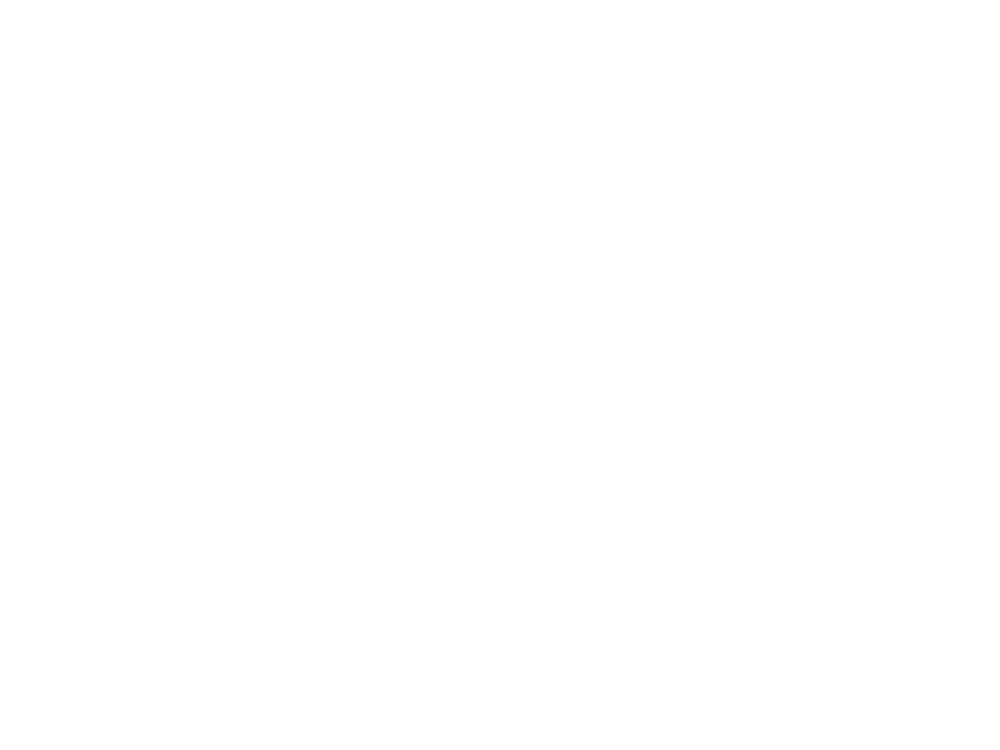

<IPython.core.display.Javascript object>


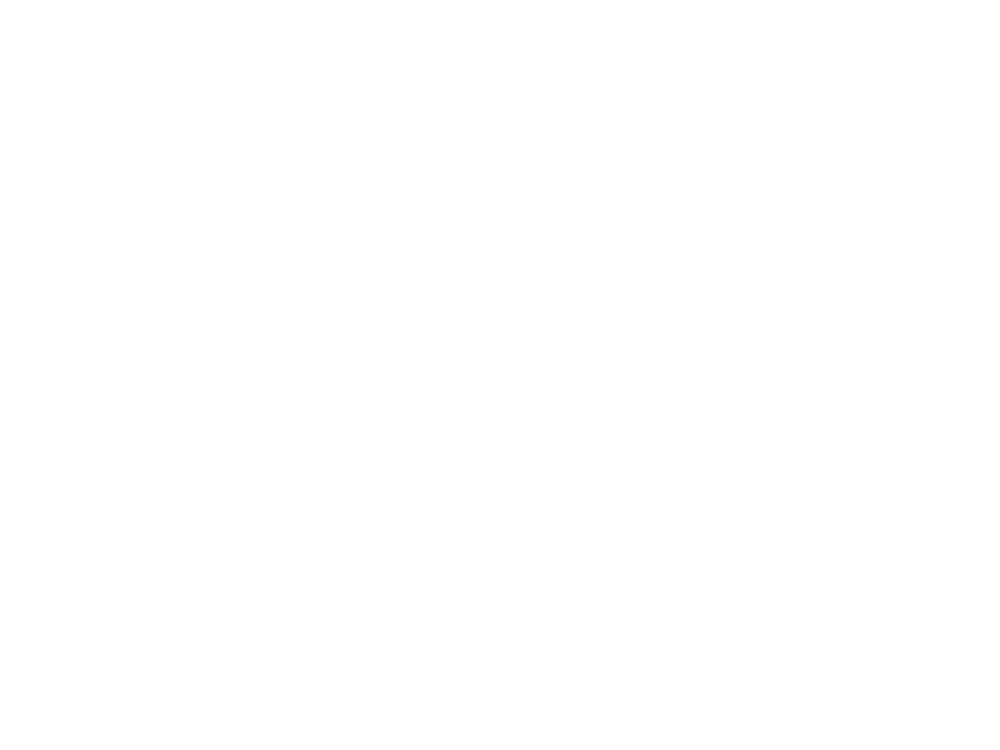

<IPython.core.display.Javascript object>


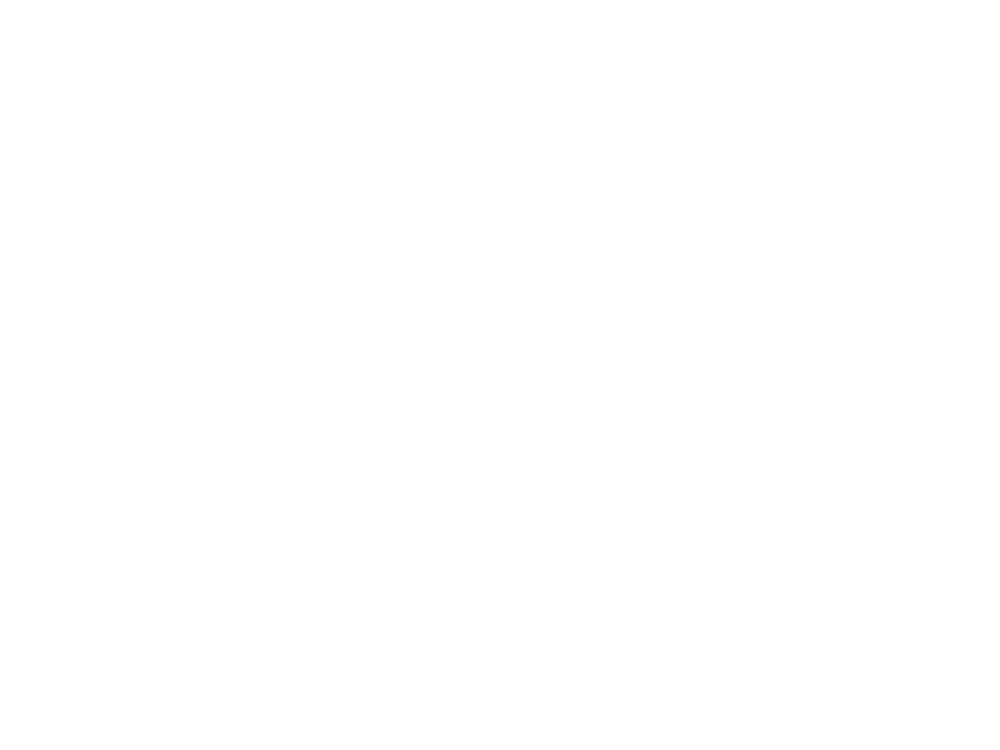

In [85]:
# per mouse - just to double check
df = pd.read_csv('/home/dana_z/HD1/lfp2speed2/sessions')
savePath = '/home/dana_z/HD1/lfp2speed2/'
f = h5py.File('Spectograms.hdf5','r')
freq = f['0761']['freq'].value
dtL = 0.00032768
tPlot = np.linspace(-2,2,int(4/dtL-1))

for per in df.period.unique():
    A,df2 = getAlignedLFP_mvmt(savePath, period = per)
    if A.shape[2] > 1000:
        b = A[:,:,0:1000]
        mu = np.mean(b[:int(b.shape[0]/2),:,:],axis=0)
        Std = np.std(b[:int(b.shape[0]/2),:,:],axis=0)
        b =(b-mu)/Std
        b = np.nansum(b,axis=2)
        for ind in range(0,A.shape[2]//1000):
            c = A[:,:,1000*(ind+1):np.min([A.shape[2],1000*(ind+2)])]
            mu = np.mean(c[:int(c.shape[0]/2),:,:],axis=0)
            Std = np.std(c[:int(c.shape[0]/2),:,:],axis=0)
            c =(c-mu)/Std
            c = np.nansum(c,axis=2)
            b = b+c
        b= b/A.shape[2]
    else:
        b = A
        mu = np.mean(b[:int(b.shape[0]/2),:,:],axis=0)
        Std = np.std(b[:int(b.shape[0]/2),:,:],axis=0)
        b =(b-mu)/Std
        b = np.nanmean(b,axis=2)
#         pickle.dump(b, open(figFolder+per+'.p',"wb"),protocol=4)
#         del A,b
#         b = pickle.load(open(figFolder+per+'.p',"rb"))

    fig, ax = plt.subplots()
    CS=ax.pcolormesh(tPlot,freq,b.T)
    fig.colorbar(CS)
    ax.set_title(per,fontsize=20)
    fig.savefig(figFolder+'figure5_'+per+'_Speed_testColorbarLim.png',format='png')
#     fig.savefig(figFolder+'figure5_'+per+'normalizedByNeuron.svg',format='svg')
    fig.clf()
    plt.close(fig)



In [86]:
# spectrom in high/low mvmt
f = h5py.File('Spectograms.hdf5','r')

miceList = getMiceList(Files[0])
specs = {}
for m in tqdm(miceList):  
    data =  getData(Files[0],['lfp','speed'],period ='Pre', mice=m)
    
    for sess in data:
        try:
            if sess[5] == 'B':
                day = 0
            else:
                day = int(re.findall(r'\d+',sess[5:])[0])

            # get data
            dtS = 1/data[sess]['speed']['Fs']
            dtL = 1/data[sess]['lfp']['FS']
            ts = np.arange(0, np.max(data[sess]['speed']['speed'].shape)) * dtS 
            tl = np.arange(0, np.max(data[sess]['lfp']['lfp'].shape)) * dtL


            highAC = getOnsetOrPeriod(m,sess,'Pre','hiACRotPeriods_vector')
            highC = getOnsetOrPeriod(m,sess,'Pre','hiCRotPeriods_vector')
            lowRot = getOnsetOrPeriod(m,sess,'Pre','loRotPeriods_vector')
            lowSpeed = getOnsetOrPeriod(m,sess,'Pre','LowMvmtPeriods_vector')
            hiSpeed = getOnsetOrPeriod(m,sess,'Pre','HighMvmtPeriods_vector')
            tempDict = {'mouse':m,'day':day,'period':periodCalc(day)}

            freq = f[m]['freq'].value
            coeff = np.abs(f[m][sess]['Pre']['coeff'].value)
            lfpOutliers = removeLFPOutliers(data[sess]['lfp']['lfp'], sess)
            coeff[:,(lfpOutliers[:,0]==1)] = np.nan
            coeff = coeff.T



            for mv in ['highAC','highC','lowRot','lowSpeed','hiSpeed']:
                Himvmt = np.full_like(tl,False)
                mVector = eval(mv)
                V = np.append(mVector[1:]*1-mVector[:-1]*1,0)
                HpStart = ts[V==1]
                HpEnd = ts[V==-1]
                if mVector[0] == 1:
                    HpStart = np.insert(HpStart,0,0)
                for segI, seg in enumerate(HpStart):
                    si = np.argmin(np.abs(tl-seg))
                    se = np.argmin(np.abs(tl-HpEnd[segI]))
                    Himvmt[si:se] = True

                #coeff = np.delete(coeff,(56), axis=1)
                sessH = (coeff[(Himvmt ==1),:])
                Hs = np.nansum(sessH, axis=1)
                Hs2 = sessH.T/Hs.T
                tempDict[mv] = np.nanmean(Hs2.T,axis=0, keepdims=True)
            specs[sess] = tempDict
        except:
            print(sess)
        

  0%|          | 0/16 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  6%|▋         | 1/16 [02:16<34:00, 136.03s/it]

cleaning up lfp data
I deleted session: 1208_day12
cleaning up speed data
found  17.0  outlier points


 12%|█▎        | 2/16 [04:07<29:59, 128.55s/it]

cleaning up lfp data
cleaning up speed data


 19%|█▉        | 3/16 [06:29<28:45, 132.70s/it]

cleaning up lfp data
cleaning up speed data


 25%|██▌       | 4/16 [06:52<19:58, 99.90s/it] 

cleaning up lfp data
cleaning up speed data
found  1.0  outlier points
found  888231.0  outlier points
found  481139.0  outlier points


 31%|███▏      | 5/16 [08:34<18:26, 100.56s/it]

cleaning up lfp data
cleaning up speed data


 38%|███▊      | 6/16 [09:11<13:33, 81.31s/it] 

cleaning up lfp data
cleaning up speed data


 44%|████▍     | 7/16 [11:49<15:38, 104.31s/it]

cleaning up lfp data
I deleted session: 2976_day4
cleaning up speed data
found  1.0  outlier points
found  3.0  outlier points


 50%|█████     | 8/16 [14:19<15:45, 118.13s/it]

cleaning up lfp data
cleaning up speed data


 56%|█████▋    | 9/16 [17:04<15:24, 132.03s/it]

cleaning up lfp data
cleaning up speed data
found  50.0  outlier points


 62%|██████▎   | 10/16 [19:26<13:30, 135.03s/it]

cleaning up lfp data
cleaning up speed data
found  29.0  outlier points


 69%|██████▉   | 11/16 [22:54<13:04, 156.90s/it]

cleaning up lfp data
cleaning up speed data


 75%|███████▌  | 12/16 [25:56<10:57, 164.40s/it]

cleaning up lfp data
cleaning up speed data


 81%|████████▏ | 13/16 [29:26<08:54, 178.24s/it]

cleaning up lfp data
cleaning up speed data


 88%|████████▊ | 14/16 [31:47<05:34, 167.19s/it]

cleaning up lfp data
cleaning up speed data
8803_day6


 94%|█████████▍| 15/16 [34:16<02:41, 161.73s/it]

cleaning up lfp data
cleaning up speed data
8815_day6


100%|██████████| 16/16 [36:43<00:00, 137.71s/it]


In [87]:
# all, and no 4539
periods = {'Healthy':{'axis':0},'Day 1-4':{'axis':1},'Day 5-12':{'axis':2},'Day 13-20':{'axis':3},'One Month':{'axis':4}}
conds = ['highAC','highC','lowRot','lowSpeed','hiSpeed']

for p in periods.keys():
    for c in conds:
        periods[p][c] = np.zeros((87,1))
for sess in specs.keys():
    for c in conds:
        periods[specs[sess]['period']][c] = np.concatenate((periods[specs[sess]['period']][c],
                                                                   specs[sess][c].T),axis=1)
for p in periods.keys():
    for c in conds:
        periods[p][c] = periods[p][c][:,1:]

<IPython.core.display.Javascript object>


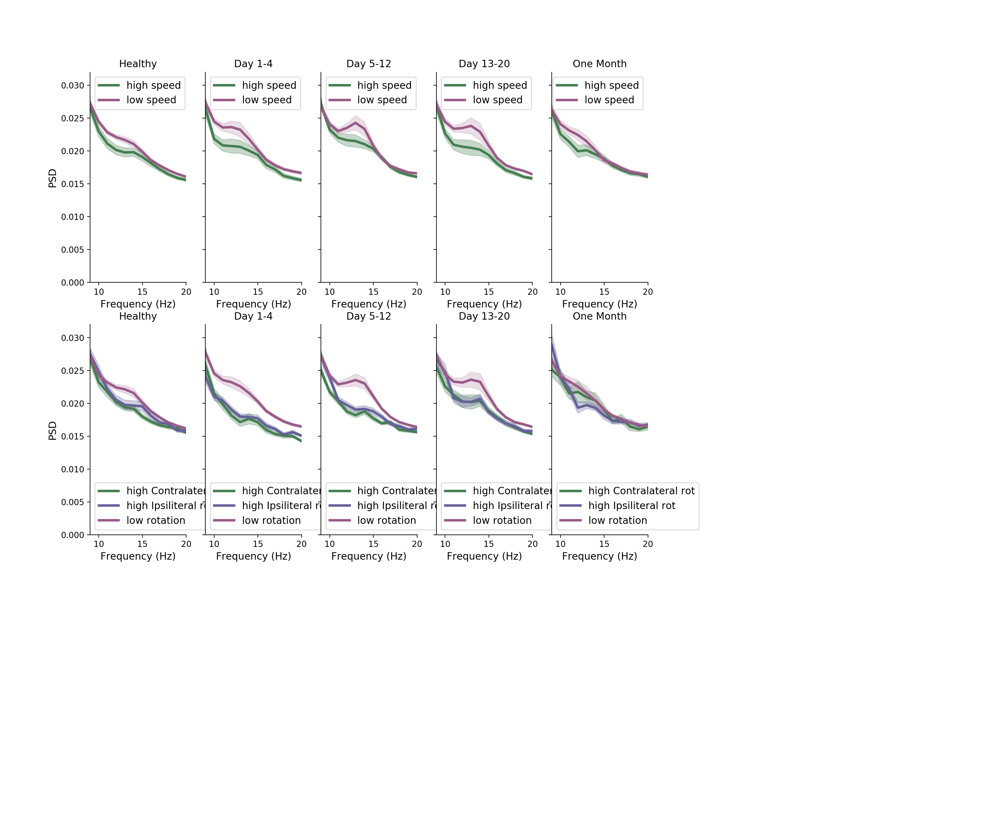

In [91]:
#periods = {'Healthy':{'axis':0},'Day 1-4':{'axis':1},'Day 5-12':{'axis':2},'Day 13-20':{'axis':3},'One Month':{'axis':4}}

colorsL = sns.cubehelix_palette(8)
colorsH = sns.cubehelix_palette(8, start=2, rot=0, dark=0, light=.95)
colorsH2 = sns.cubehelix_palette(8, start=3, rot=0, dark=0, light=.95)

fig, ax = plt.subplots(2,5,figsize=(12.15,10.15),sharey='row')
for ind, p in enumerate(periods.keys()):
    hC = np.nanmean(periods[p]['hiSpeed'],axis=1)
    hS2 = np.nanstd(periods[p]['hiSpeed'],axis=1)/np.sqrt(periods[p]['hiSpeed'].shape[1])
    lC = np.nanmean(periods[p]['lowSpeed'],axis=1)
    lS2 = np.nanstd(periods[p]['lowSpeed'],axis=1)/np.sqrt(periods[p]['lowSpeed'].shape[1])
       
    ax[0,ind].plot(freq,hC,color = colorsH[4], label='high speed',linewidth=3.0)
    ax[0,ind].fill_between(freq, hC-hS2, hC+hS2,color=colorsH[4],alpha=0.3)
    ax[0,ind].plot(freq,lC,color = colorsL[4], label='low speed',linewidth=3.0)
    ax[0,ind].fill_between(freq, lC-lS2, lC+lS2,color=colorsL[4],alpha=0.2)
    ax[0,ind].set_xlim(6,100)
    ax[0,ind].set_title(p)
#    ax[0,ind].set_xlim(9,15)
#    ax[0,ind].set_ylim(0.015,0.03)
    ax[0,0].set_ylabel('PSD',fontsize=12)
    #ax[0,ind].axes.get_yaxis().set_ticks([])
    ax[0,ind].set_xlabel('Frequency (Hz)',fontsize=12)
    ax[0,ind].spines['right'].set_visible(False)
    ax[0,ind].spines['top'].set_visible(False)
    ax[0,ind].legend(fontsize=12)
    
    hC = np.nanmean(periods[p]['highC'],axis=1)
    hS2 = np.nanstd(periods[p]['highC'],axis=1)/np.sqrt(periods[p]['highC'].shape[1])
    hAC = np.nanmean(periods[p]['highAC'],axis=1)
    hS2A = np.nanstd(periods[p]['highAC'],axis=1)/np.sqrt(periods[p]['highAC'].shape[1])
    lC = np.nanmean(periods[p]['lowRot'],axis=1)
    lS2 = np.nanstd(periods[p]['lowRot'],axis=1)/np.sqrt(periods[p]['lowRot'].shape[1])
       
    ax[1,ind].plot(freq,hC,color = colorsH[4], label='high Contralateral rot',linewidth=3.0)
    ax[1,ind].fill_between(freq, hC-hS2, hC+hS2,color=colorsH[4],alpha=0.3)
    ax[1,ind].plot(freq,hAC,color = colorsH2[4], label='high Ipsiliteral rot',linewidth=3.0)
    ax[1,ind].fill_between(freq, hAC-hS2A, hAC+hS2A,color=colorsH2[4],alpha=0.3)
    ax[1,ind].plot(freq,lC,color = colorsL[4], label='low rotation',linewidth=3.0)
    ax[1,ind].fill_between(freq, lC-lS2, lC+lS2,color=colorsL[4],alpha=0.2)
    ax[1,ind].set_xlim(6,100)
    ax[1,ind].set_title(p)
#    ax[0,ind].set_xlim(9,15)
#    ax[0,ind].set_ylim(0.015,0.03)
    ax[1,0].set_ylabel('PSD',fontsize=12)
    #ax[0,ind].axes.get_yaxis().set_ticks([])
    ax[1,ind].set_xlabel('Frequency (Hz)',fontsize=12)
    ax[1,ind].spines['right'].set_visible(False)
    ax[1,ind].spines['top'].set_visible(False)
    ax[1,ind].legend(fontsize=12)
#fig.savefig(figFolder+'lfpSpectromPeriod.png',transparent=True,format='png')
fig.savefig(figFolder+'figure5_lfpSpectromPeriod.svg',transparent=True,format='svg')

# #fig2, ax2 = plt.subplots(1,2,sharex='col',sharey='row')
for ind, p in enumerate(periods.keys()):
    ax[0,ind].set_xlim(9,20)
    ax[1,ind].set_xlim(9,20)
    ax[0,ind].set_ylim(0,0.032)
    ax[1,ind].set_ylim(0,0.032)
#fig.savefig(figFolder+'lfpSpectromPeriodZoomBeta.png',transparent=True,format='png')
fig.savefig(figFolder+'figure5_ZoomBeta.svg',transparent=True,format='svg')
# for ind, p in enumerate(periods.keys()):
#     ax[0,ind].set_xlim(40,60)
#     ax[1,ind].set_xlim(40,60)
# #fig.savefig(figFolder+'lfpSpectromPeriodZoomGamma.png',transparent=True,format='png')
# fig.savefig(figFolder+'figure5_lfpZoomGamma.svg',transparent=True,format='svg')



Suplemental figures

In [25]:
figFolder = '/home/dana_z/ssd_2TB/6OHDA/figs/supplementals/'

<IPython.core.display.Javascript object>


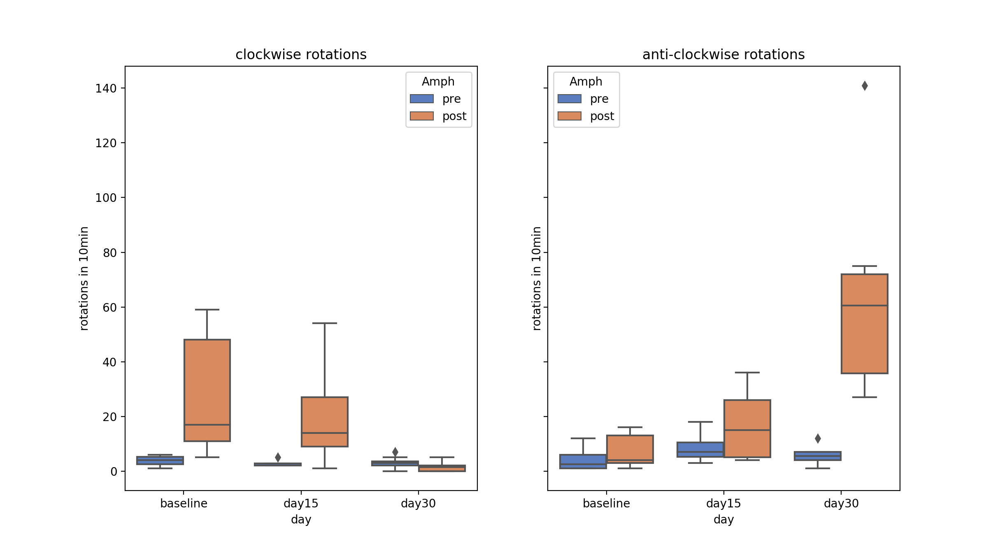

In [40]:
# plot cage rotations 
df = pd.read_csv("/home/dana_z/ssd_2TB/6OHDA/rotation_count.csv")
df['day'] = df.apply(lambda row: row.session.split('_')[0],axis=1)
df['Amph'] = df.apply(lambda row: row.session.split('_')[1],axis=1)
df['clockwise'] = pd.to_numeric(df['clockwise'])
df['anti-clockwise'] = pd.to_numeric(df['anti-clockwise'])
df.head()


fig, ax = plt.subplots(1,2,figsize=(12.15,6.7),sharey='row')
sns.boxplot(x="day", y="clockwise", hue="Amph", data=df,
                  palette="muted",ax = ax[0]) #height=6,
#g.despine(left=True)
ax[0].set_ylabel("rotations in 10min")
ax[0].set_title("clockwise rotations")


sns.boxplot(x="day", y="anti-clockwise", hue="Amph", data=df,
                palette="muted",ax = ax[1]) # height=6,
#f.despine(left=True)
ax[1].set_ylabel("rotations in 10min")
ax[1].set_title("anti-clockwise rotations")
fig.savefig(figFolder+'figureS1_cageRotations.svg',transparent=True,format='svg')

In [41]:
speedData = []

miceList = getMiceList(Files[1])
for m in miceList:
    data = getData(Files[1],['speed'],period ='Post', mice=m,drug=b'Amphetamin')
    
    # calculte % high speed + % low speed
    for sess in data:
        # find the day of the session
        if sess[5] == 'B':
            day = 0
        else:
            day = int(re.findall(r'\d+',sess[5:])[0])
        
        row = {'Mouse':m,'Session':sess,'Day':day}
        Hp = getOnsetOrPeriod(m,sess,'Post','HighMvmtPeriods_vector')
        Lp = getOnsetOrPeriod(m,sess,'Post','LowMvmtPeriods_vector')
        comb = Hp*1+((Lp*1)-1)*-1
                
        row['percent_low'] = np.sum(Lp*1)/len(Lp)
        row['percent_high'] = np.sum(Hp*1)/len(Hp)
        row['percent_medium'] = np.sum(comb==1)/len(comb)
        
        trans = comb[1:]-comb[:-1]
        
        row['tran_all'] = np.sum(np.abs(trans!=0))
        row['tran_low2any'] = np.sum(np.abs(Lp[1:]*1-Lp[:-1]*1))
        row['tran_high2any'] = np.sum(np.abs(Hp[1:]*1-Hp[:-1]*1))
        
        row['MvmtOnset'] = np.sum(getOnsetOrPeriod(m,sess,'Post','mvmtOnset'))        
        speedData.append(row)
          
df = pd.DataFrame(speedData)        
df['Period'] =  df.apply (lambda row: periodCalc(row.Day) , axis=1)

cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data


<IPython.core.display.Javascript object>


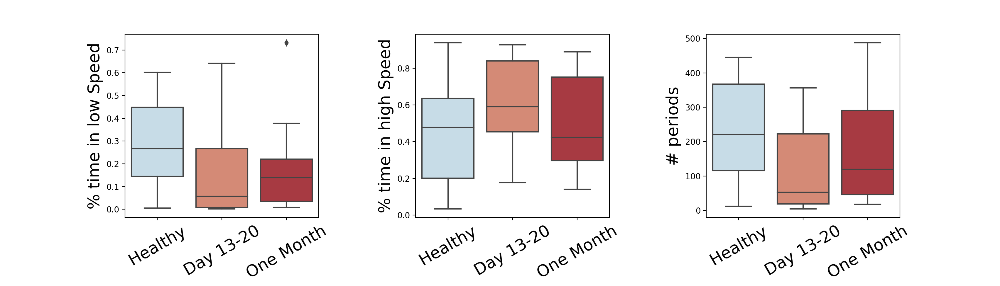

In [45]:
df.to_csv(figFolder+'postAmphSpeed2R.csv')
df2 = df.groupby(['Mouse','Period']).mean()
df2.reset_index(inplace=True)

fig, ax = plt.subplots(1,3,figsize=(17.04,4.88),gridspec_kw = {'hspace':.1,'wspace':.5,'bottom':0.24})
pOrder = ['Healthy','Day 13-20','One Month']
with sns.color_palette(colorPallet3Post):#sns.color_palette("PuBuGn_d"):
    columns = ['percent_low','percent_high','tran_low2any'] 
    labels = ['% time in low Speed','% time in high Speed','# periods']
    for ind in range(len(columns)):
        sns.boxplot(x="Period", y=columns[ind], data=df2,ax =ax[ind],order = pOrder)
        #sns.scatterplot(x="Period", y=columns[ind], data=df2,ax =ax[ind])
        ax[ind].set_xticklabels(ax[ind].get_xticklabels(),rotation=30,fontsize=20)
        ax[ind].set_ylabel(labels[ind],fontsize=20)
        ax[ind].set_xlabel("")
        
        
#fig.savefig(figFolder+'figureS2_a.png',transparent=False,format='png')
fig.savefig(figFolder+'figureS2_a.svg',transparent=True,format='svg')


<IPython.core.display.Javascript object>


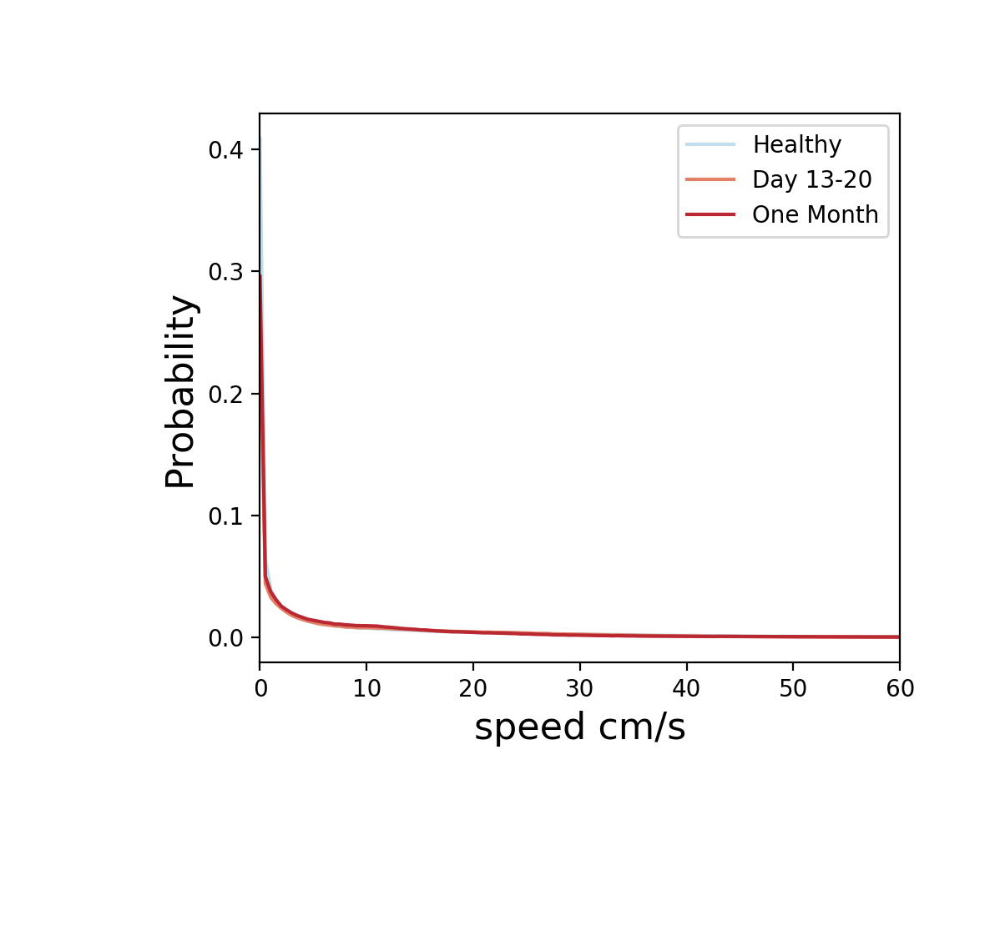

cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
I deleted session: 4539_day0
cleaning up speed data
I deleted session: 7584_Baseline0
I deleted session: 7584_day0
cleaning up speed data
I deleted session: 7909_day0
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
I deleted session: 1208_day14
cleaning up speed data
I deleted session: 1222_day13
cleaning up speed data
cleaning up speed data
I deleted session: 1236_day13
cleaning up speed data
cleaning up speed data
I deleted session: 1793_day14
cleaning up speed data
I deleted session: 2976_day14
cleaning up speed data
I deleted session: 2980_day14
cleaning up speed data
I deleted session: 2981_day14
cleaning up speed data
I deleted session: 4539_day13
I deleted session:

In [49]:
periods = {'Healthy':lambda x: x==0,
           'Day 13-20':lambda x: (x>12) & (x<21),
           'One Month':lambda x: x>21}

fig, ax = plt.subplots(1,1,figsize=(5.99,5.67),gridspec_kw = {'hspace':.1,'bottom':0.3,'left':.26})
for indP,p in enumerate(periods.keys()):
    #to make sure mice are equally represented in each period
    weightsH = np.zeros((199,))
    for m in miceList:
        dataH = getData(Files[1],['speed'],period ='Post', day = periods[p],mice = m)
        speedM = np.empty((1,0))
        for sess in dataH:
            speedM = np.concatenate((speedM, dataH[sess]['speed']['speed']), axis=1)
        hist, bin_edges = np.histogram(speedM, bins=np.arange(0,200)*0.5)
        hist  = hist/np.nansum(hist) # normalize per mouse
        weightsH = np.nansum((weightsH, hist),axis=0)

    ax.plot(np.arange(0,199)*0.5,weightsH/16,label=p,color=colorPallet3Post[indP,:])    
ax.set_xlim(0,60)
ax.set_xlabel('speed cm/s',fontsize=16)
ax.set_ylabel('Probability',fontsize=16)
ax.legend(fontsize=10)
#fig.savefig(figFolder+'figureS2_d.png',transparent=False,format='png')
fig.savefig(figFolder+'figureS2_d.svg',transparent=True,format='svg')

<IPython.core.display.Javascript object>


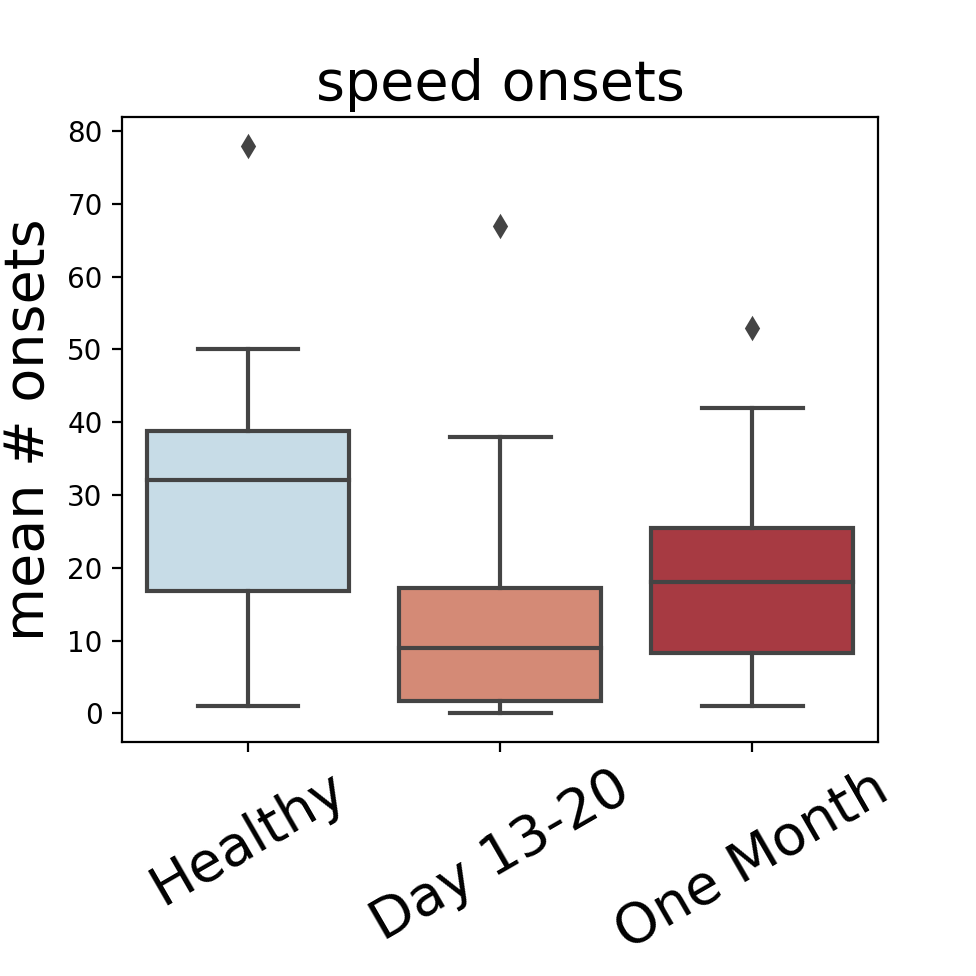

In [50]:
df2 = df.groupby(['Mouse','Period']).mean()
df2.reset_index(inplace=True)

fig, ax = plt.subplots(1,1,figsize=(4.88,4.88),gridspec_kw = {'hspace':.1,'wspace':.5,'bottom':0.24})
pOrder = ['Healthy','Day 13-20','One Month']
with sns.color_palette(colorPallet3Post):#sns.color_palette("PuBuGn_d"):
    columns = ['MvmtOnset'] 
    labels = ['speed onsets']
    for ind in range(len(columns)):
        sns.boxplot(x="Period", y=columns[ind], data=df2,ax =ax,order = pOrder)
        #sns.scatterplot(x="Period", y=columns[ind], data=df2,ax =ax[ind])
        ax.set_xticklabels(ax.get_xticklabels(),rotation=30,fontsize=20)
        ax.set_ylabel("mean # onsets",fontsize=20)
        ax.set_xlabel("")
        ax.set_title(labels[ind],fontsize=20)
        
#fig.savefig(figFolder+'figureS2_e.png',transparent=False,format='png')
fig.savefig(figFolder+'figureS2_e.svg',transparent=True,format='svg')


In [118]:
rotData = []

miceList = getMiceList(Files[1])
for m in miceList:
    data = getData(Files[1],['rot'],period ='Post', mice=m, drug = b'Amphetamin')
    
    # calculte % high rot + % low rot
    for sess in data:
        # find the day of the session
        if sess[5] == 'B':
            day = 0
        else:
            day = int(re.findall(r'\d+',sess[5:])[0])
        
        row = {'Mouse':m,'Session':sess,'Day':day}
        hACp = getOnsetOrPeriod(m,sess,'Post','hiACRotPeriods_vector')
        hCp = getOnsetOrPeriod(m,sess,'Post','hiCRotPeriods_vector')
        Lp = getOnsetOrPeriod(m,sess,'Post','loRotPeriods_vector')
        comb = hACp*8+Lp*5+hCp*7
                
        row['percent_low'] = np.sum(Lp*1)/len(Lp)
        row['percent_high_AC'] = np.sum(hACp*1)/len(hACp)
        row['percent_high_C'] = np.sum(hCp*1)/len(hCp)
        row['percent_non'] = np.sum(comb==0)/len(comb)
        
        trans = comb[1:]-comb[:-1]
        
        row['trans'] = np.sum(trans!=0)
        row['tran_low2high'] = np.sum(trans>0)
        row['tran_high2low'] = np.sum(trans<0)
        row['rotOnset'] = np.sum(getOnsetOrPeriod(m,sess,'Post','rotOnset')) 
        row['cRotOnset'] = np.sum(getOnsetOrPeriod(m,sess,'Post','clockWiseOnset'))
        row['acRotOnset'] = np.sum(getOnsetOrPeriod(m,sess,'Post','antiClockWiseOnset'))
        
        rotData.append(row)
          
dfRot = pd.DataFrame(rotData)        
dfRot['Period'] =  dfRot.apply (lambda row: periodCalc(row.Day) , axis=1)

cleaning up rot data
cleaning up rot data
cleaning up rot data
cleaning up rot data
cleaning up rot data
cleaning up rot data
cleaning up rot data
cleaning up rot data
cleaning up rot data
cleaning up rot data
cleaning up rot data
cleaning up rot data
cleaning up rot data
cleaning up rot data
cleaning up rot data
cleaning up rot data


<IPython.core.display.Javascript object>


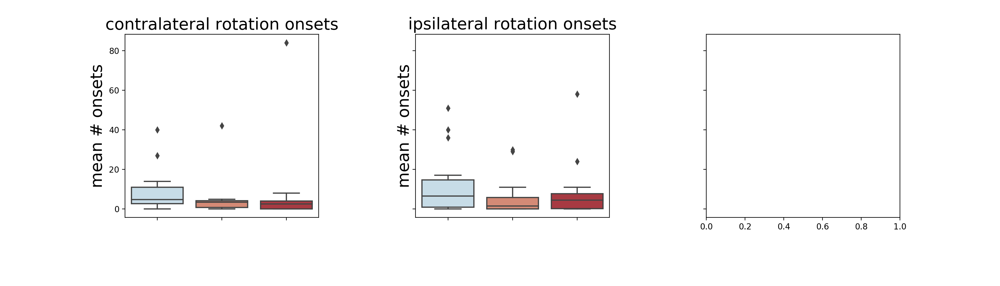

<IPython.core.display.Javascript object>


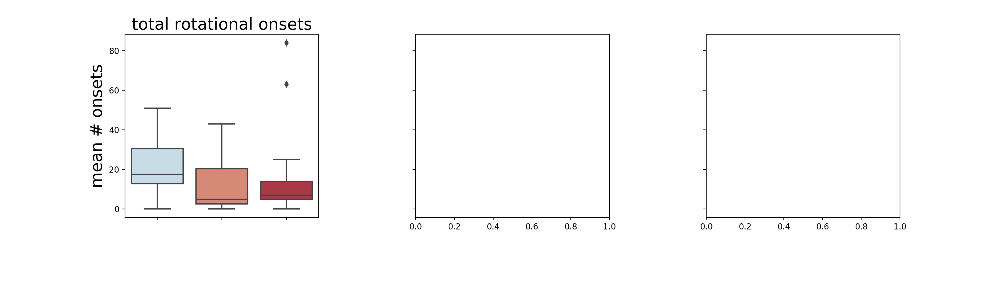

In [122]:
df2Rot = dfRot.groupby(['Mouse','Period']).mean()
df2Rot.reset_index(inplace=True)
df2Rot

fig, ax = plt.subplots(1,3,figsize=(17.04,4.88),gridspec_kw = {'hspace':.1,'wspace':.5,'bottom':0.24},sharey = True)
fig2, ax2 = plt.subplots(1,3,figsize=(17.04,4.88),gridspec_kw = {'hspace':.1,'wspace':.5,'bottom':0.24},sharey = True)

pOrder = ['Healthy','Day 13-20','One Month']
with sns.color_palette(colorPallet3Post):#sns.color_palette("PuBuGn_d"):
    columns = ['rotOnset','cRotOnset','acRotOnset'] 
    labels = ['total rotational onsets','contralateral rotation onsets','ipsilateral rotation onsets']
    for ind in range(len(columns)):
        if ind >0:
            sns.boxplot(x="Period", y=columns[ind], data=df2Rot,ax =ax[ind-1],order = pOrder)
            #sns.scatterplot(x="Period", y=columns[ind], data=df2Rot,ax =ax[ind])
            ax[ind-1].set_xticklabels(ax[ind].get_xticklabels(),rotation=30,fontsize=20)
            ax[ind-1].set_ylabel("mean # onsets",fontsize=20)
            ax[ind-1].set_xlabel("")
            ax[ind-1].set_title(labels[ind],fontsize=20)
        else:
            sns.boxplot(x="Period", y=columns[ind], data=df2Rot,ax =ax2[ind],order = pOrder)
            #sns.scatterplot(x="Period", y=columns[ind], data=df2Rot,ax =ax[ind])
            ax2[ind].set_xticklabels(ax[ind].get_xticklabels(),rotation=30,fontsize=20)
            ax2[ind].set_ylabel("mean # onsets",fontsize=20)
            ax2[ind].set_xlabel("")
            ax2[ind].set_title(labels[ind],fontsize=20)

#fig.savefig(figFolder+'figureS2_f.png',transparent=False,format='png')
fig.savefig(figFolder+'figureS2_f1.svg',transparent=True,format='svg')
fig2.savefig(figFolder+'figureS2_f2.svg',transparent=True,format='svg')


In [71]:
# Recalculate the LFP align to contra rotation onset - take a few days to run. 
#     Only run if didn't do that before already (+ one extra time before publishing paper)
#     Comment line 27-29 to recalculate sessions that were already done
warnings.filterwarnings("ignore")

# open all necassary files 
f = h5py.File('Spectograms.hdf5','r') #LFP coeffs
savePath = '/home/dana_z/HD1/lfp2ACrot/'

df = pd.DataFrame(columns=['mouse','sess','day','period','cre','numred'])
# constents for analysis:
WinPre = 2 #s
WinPost = 2 #s

# for each mouse: 
for m in miceList:
    data =  getData(Files[1],['lfp','speed'],period ='Pre', mice=m)
    cre = getCreType(Files[1],m)
    for sess in tqdm(data.keys()): 
        if sess[5] == 'B':
            day = 0
        else:
            day = int(re.findall(r'\d+',sess[5:])[0])


        # get data
        sOnset = getOnsetOrPeriod(m,sess,'Pre','antiClockWiseOnset')
        
        if np.sum(sOnset)==0:
            continue

        coeff = np.abs(f[m][sess]['Pre']['coeff'].value)
        lfpOutliers = removeLFPOutliers(data[sess]['lfp']['lfp'], sess)
        try:
            coeff[:,(lfpOutliers[:,0]==1)] = np.nan
            coeff= coeff.T
            #coeff = coeff.T/np.nansum(coeff,axis=1) # So that axis[0] is the time axis + normalize power in frequency per sesion
        except:
            print(sess)
            continue
        

        dtS = float(1/data[sess]['speed']['Fs'])
        dtL = float(1/data[sess]['lfp']['FS'])
        ts = np.arange(0, np.max(data[sess]['speed']['speed'].shape)) * dtS 
        tl = np.arange(0, np.max(data[sess]['lfp']['lfp'].shape)) * dtL

        tPlot = np.linspace(-WinPre,WinPost,int((WinPre+WinPost)/dtL))     
        
        # for every speed onset:
        
        onsetL = np.full_like(tl,False)
        for si in ts[sOnset.astype(bool)]:
            ti = np.argmin(np.abs(tl-si))
            onsetL[ti] = True
        al = alignToOnset(coeff,(onsetL==1), winPost =WinPre/dtL, winPre = WinPost/dtL)

        if al.ndim <3:
            try:
                al = np.reshape(al,(al.shape[0],al.shape[1],1))
            except:
                print('no onset, when there should be. in sess= ',sess)
                continue

        #al = np.nanmean(al,axis=2,keepdims=True)
        al = np.nan_to_num(al,nan=-9999)
        if 'aligned' in locals():
            aligned = np.concatenate((aligned,al), axis = 2)
        else:
            aligned = al

        if np.sum(sOnset)>0:
            pickle.dump( aligned, open( savePath+sess, "wb" ) , protocol=4)
            del aligned
         
        # add session to df, so can be retrived
        df= df.append({'mouse':m,'sess':sess,'day':day,'period': periodCalc(day),'cre':cre},ignore_index=True)

df.to_csv(savePath+'sessions')


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/13 [00:00<?, ?it/s]

cleaning up lfp data
I deleted session: 1208_day12
cleaning up speed data


 46%|████▌     | 6/13 [00:35<00:41,  5.97s/it]

found  17.0  outlier points


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/3 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data
found  1.0  outlier points


 64%|██████▍   | 9/14 [00:54<00:30,  6.07s/it]

found  888231.0  outlier points


 71%|███████▏  | 10/14 [01:00<00:24,  6.15s/it]

found  481139.0  outlier points


  0%|          | 0/3 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/13 [00:00<?, ?it/s]

cleaning up lfp data
I deleted session: 2976_day4
cleaning up speed data


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


 50%|█████     | 7/14 [00:28<00:34,  4.86s/it]

found  50.0  outlier points


  0%|          | 0/19 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/17 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/19 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/13 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


 93%|█████████▎| 13/14 [01:14<00:05,  5.62s/it]

8815_day6


100%|██████████| 14/14 [01:20<00:00,  5.77s/it]


In [72]:
# Recalculate the LFP align to ipsi rotation onset - take a few days to run. 
#     Only run if didn't do that before already (+ one extra time before publishing paper)
#     Comment line 27-29 to recalculate sessions that were already done
warnings.filterwarnings("ignore")

# open all necassary files 
f = h5py.File('Spectograms.hdf5','r') #LFP coeffs
savePath = '/home/dana_z/HD1/lfp2Crot/'

df = pd.DataFrame(columns=['mouse','sess','day','period','cre','numred'])
# constents for analysis:
WinPre = 2 #s
WinPost = 2 #s

# for each mouse: 
for m in miceList:
    data =  getData(Files[1],['lfp','speed'],period ='Pre', mice=m)
    cre = getCreType(Files[1],m)
    for sess in tqdm(data.keys()): 
        if sess[5] == 'B':
            day = 0
        else:
            day = int(re.findall(r'\d+',sess[5:])[0])


        # get data
        sOnset = getOnsetOrPeriod(m,sess,'Pre','clockWiseOnset')
        
        if np.sum(sOnset)==0:
            continue

        coeff = np.abs(f[m][sess]['Pre']['coeff'].value)
        lfpOutliers = removeLFPOutliers(data[sess]['lfp']['lfp'], sess)
        try:
            coeff[:,(lfpOutliers[:,0]==1)] = np.nan
            coeff= coeff.T
            #coeff = coeff.T/np.nansum(coeff,axis=1) # So that axis[0] is the time axis + normalize power in frequency per sesion
        except:
            print(sess)
            continue
        

        dtS = float(1/data[sess]['speed']['Fs'])
        dtL = float(1/data[sess]['lfp']['FS'])
        ts = np.arange(0, np.max(data[sess]['speed']['speed'].shape)) * dtS 
        tl = np.arange(0, np.max(data[sess]['lfp']['lfp'].shape)) * dtL

        tPlot = np.linspace(-WinPre,WinPost,int((WinPre+WinPost)/dtL))     
        
        # for every speed onset:
        
        onsetL = np.full_like(tl,False)
        for si in ts[sOnset.astype(bool)]:
            ti = np.argmin(np.abs(tl-si))
            onsetL[ti] = True
        al = alignToOnset(coeff,(onsetL==1), winPost =WinPre/dtL, winPre = WinPost/dtL)

        if al.ndim <3:
            try:
                al = np.reshape(al,(al.shape[0],al.shape[1],1))
            except:
                print('no onset, when there should be. in sess= ',sess)
                continue

        #al = np.nanmean(al,axis=2,keepdims=True)
        al = np.nan_to_num(al,nan=-9999)
        if 'aligned' in locals():
            aligned = np.concatenate((aligned,al), axis = 2)
        else:
            aligned = al

        if np.sum(sOnset)>0:
            pickle.dump( aligned, open( savePath+sess, "wb" ) , protocol=4)
            del aligned
         
        # add session to df, so can be retrived
        df= df.append({'mouse':m,'sess':sess,'day':day,'period': periodCalc(day),'cre':cre},ignore_index=True)

df.to_csv(savePath+'sessions')


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/13 [00:00<?, ?it/s]

cleaning up lfp data
I deleted session: 1208_day12
cleaning up speed data


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/3 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data
found  1.0  outlier points


 64%|██████▍   | 9/14 [00:45<00:26,  5.31s/it]

found  888231.0  outlier points


 71%|███████▏  | 10/14 [00:52<00:22,  5.54s/it]

found  481139.0  outlier points


  0%|          | 0/3 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/13 [00:00<?, ?it/s]

cleaning up lfp data
I deleted session: 2976_day4
cleaning up speed data
found  1.0  outlier points


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/19 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/17 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/19 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/13 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


100%|██████████| 14/14 [00:57<00:00,  4.13s/it]

8803_day6



  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


 93%|█████████▎| 13/14 [01:01<00:04,  4.95s/it]

8815_day6


100%|██████████| 14/14 [01:07<00:00,  4.81s/it]


<IPython.core.display.Javascript object>


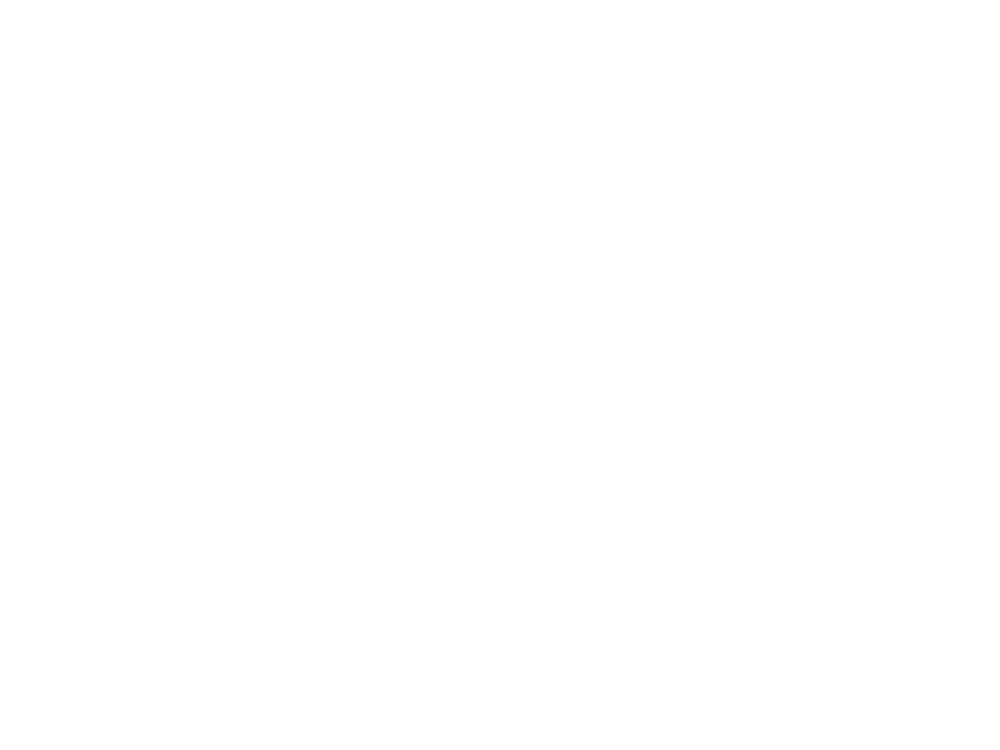

<IPython.core.display.Javascript object>


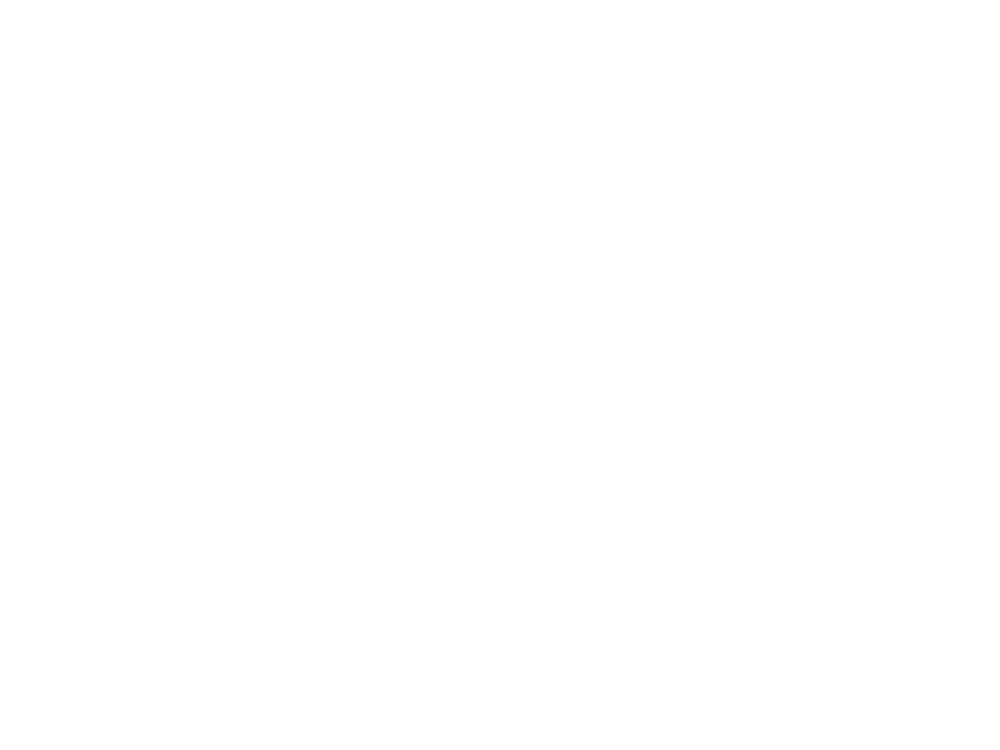

<IPython.core.display.Javascript object>


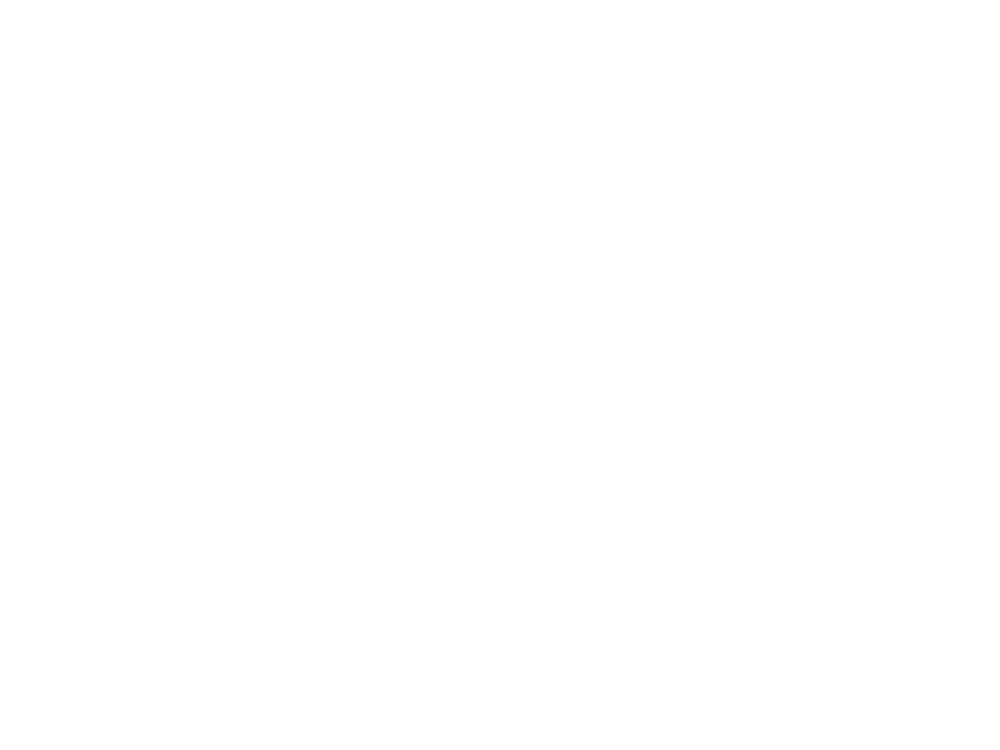

<IPython.core.display.Javascript object>


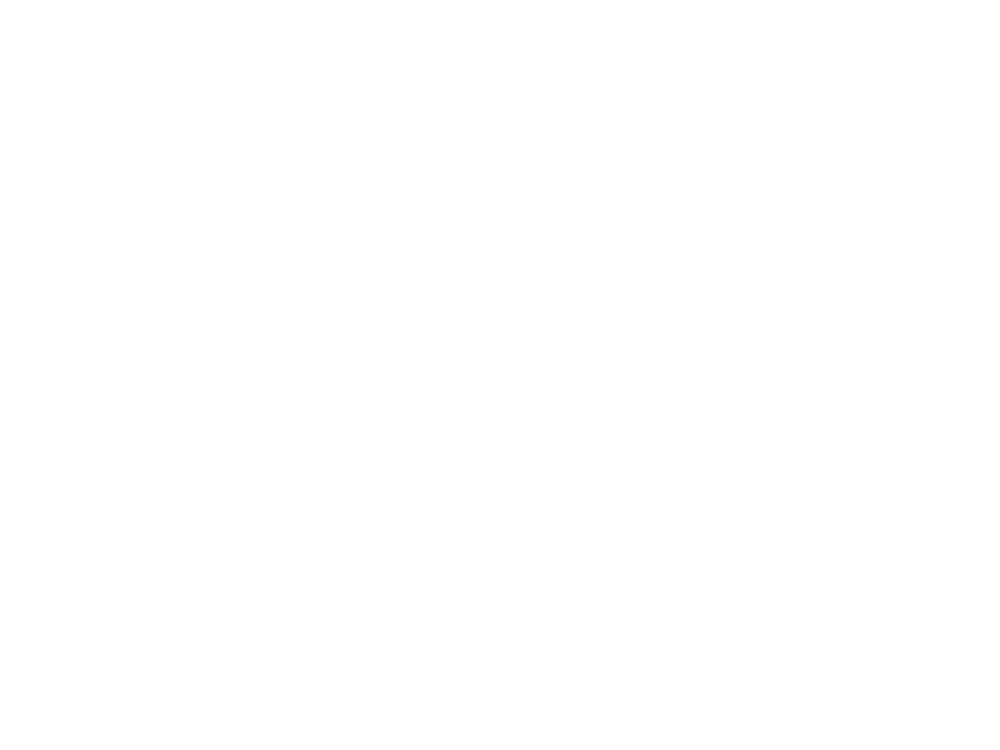

<IPython.core.display.Javascript object>


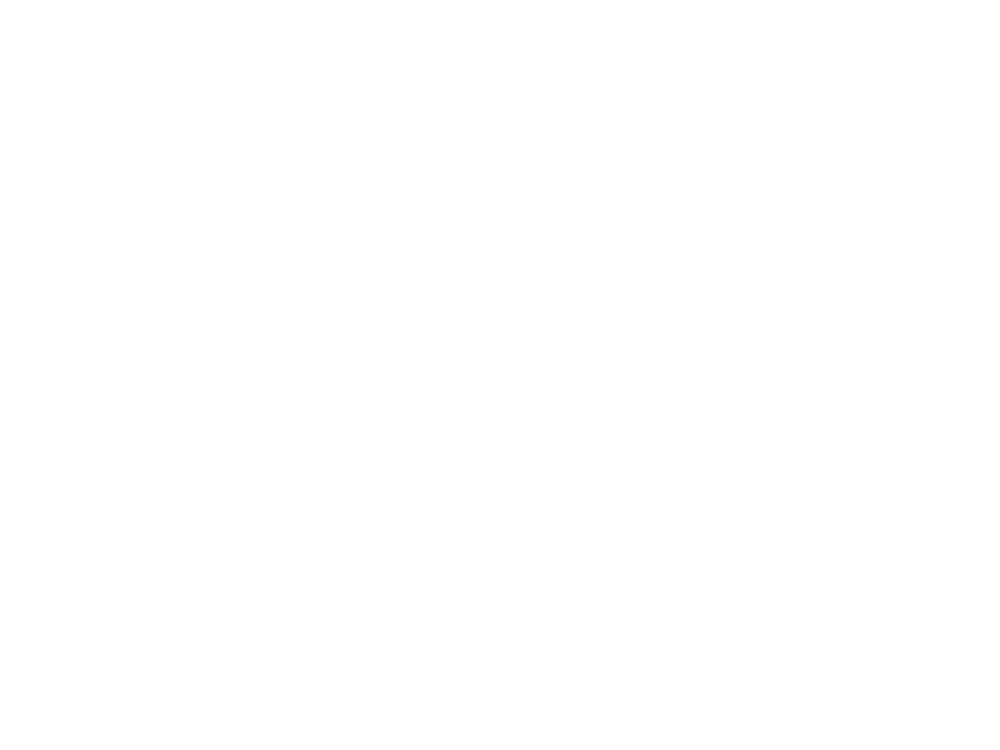

In [26]:
df = pd.read_csv('/home/dana_z/HD1/lfp2Crot/sessions')
savePath = '/home/dana_z/HD1/lfp2Crot/'
f = h5py.File('Spectograms.hdf5','r')
freq = f['0761']['freq'].value
dtL = 0.00032768
tPlot = np.linspace(-2,2,int(4/dtL-1))
for per in df.period.unique():
    if per == 'One Month': 
        # remove from figure only because too many outliers (Nan) makes the figure granular
        # data was still used for analysis
        l = getMiceList(Files[1])
        l.remove('1236')
        A,df2 =getAlignedLFP_mvmt(savePath, mice = l, period = per)
    else:
        A,df2 = getAlignedLFP_mvmt(savePath, period = per)
    if A.shape[2] > 1000:
        b = A[:,:,0:1000]
        mu = np.mean(b[:int(b.shape[0]/2),:,:],axis=0)
        Std = np.std(b[:int(b.shape[0]/2),:,:],axis=0)
        b =(b-mu)/Std
        b = np.nansum(b,axis=2)
        for ind in range(0,A.shape[2]//1000):
            c = A[:,:,1000*(ind+1):np.min([A.shape[2],1000*(ind+2)])]
            mu = np.mean(c[:int(c.shape[0]/2),:,:],axis=0)
            Std = np.std(c[:int(c.shape[0]/2),:,:],axis=0)
            c =(c-mu)/Std
            c = np.nansum(c,axis=2)
            b = b+c
        b= b/A.shape[2]
    else:
        b = A
        mu = np.mean(b[:int(b.shape[0]/2),:,:],axis=0)
        Std = np.std(b[:int(b.shape[0]/2),:,:],axis=0)
        b =(b-mu)/Std
        b = np.nanmean(b,axis=2)
    pickle.dump(b, open(figFolder+per+'.p',"wb"),protocol=4)
    del A,b
    b = pickle.load(open(figFolder+per+'.p',"rb"))

    fig, ax = plt.subplots()
    CS=ax.pcolormesh(tPlot,freq,b.T, rasterized=True,vmin =-0.75,vmax = 1.5 )
    fig.colorbar(CS)
    ax.set_title(per,fontsize=20)
#     fig.savefig(figFolder+'figure5_'+per+'Crot_normalizedByonset.png',format='png')
    fig.savefig(figFolder+'figureS3_'+per+'ipsi.svg',format='svg')
    fig.clf()
    plt.close(fig)



<IPython.core.display.Javascript object>


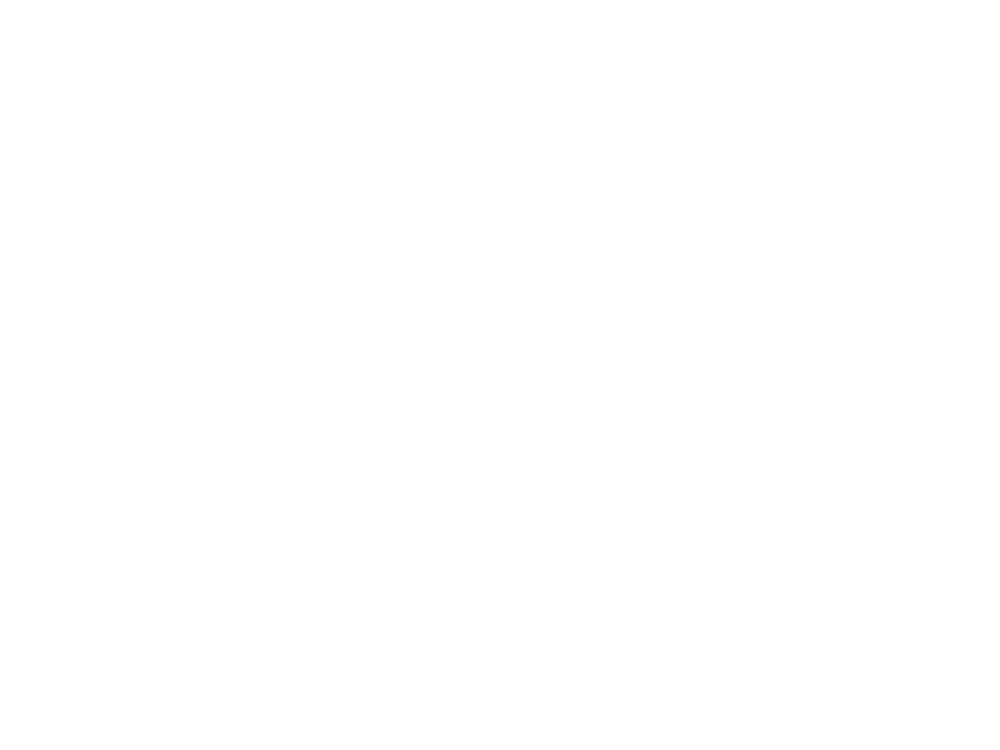

<IPython.core.display.Javascript object>


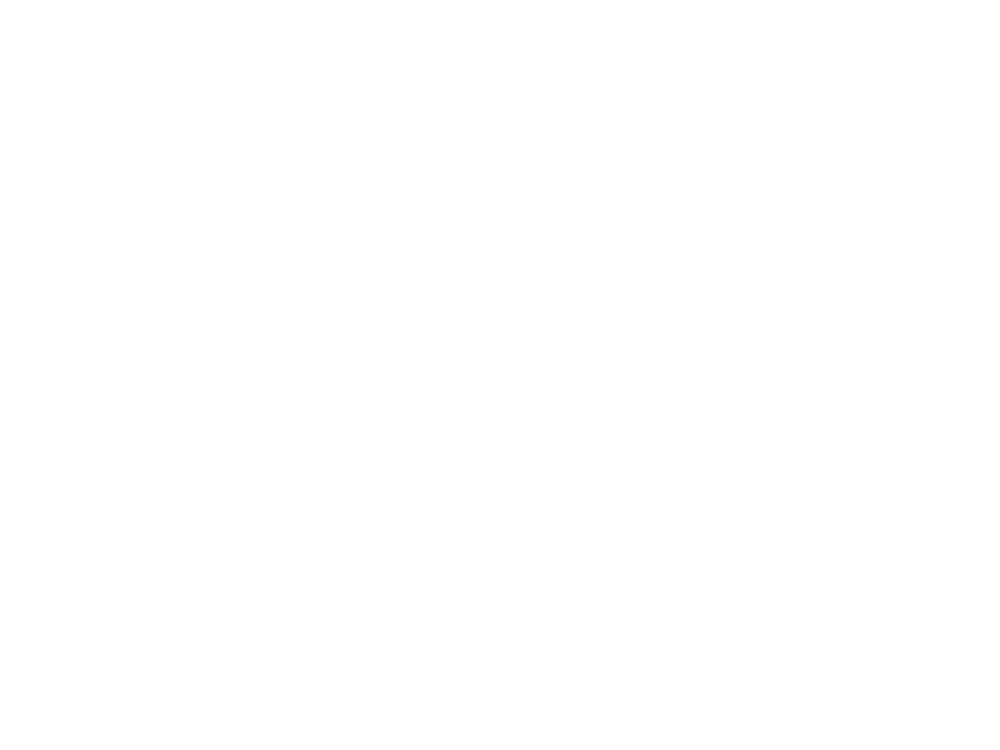

<IPython.core.display.Javascript object>


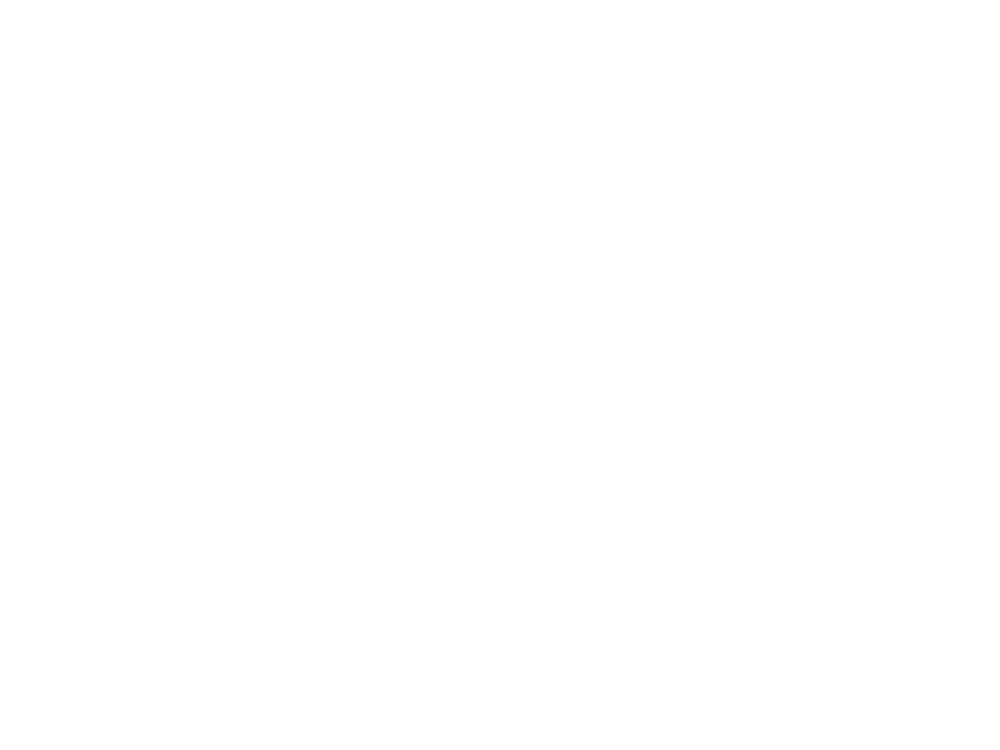

<IPython.core.display.Javascript object>


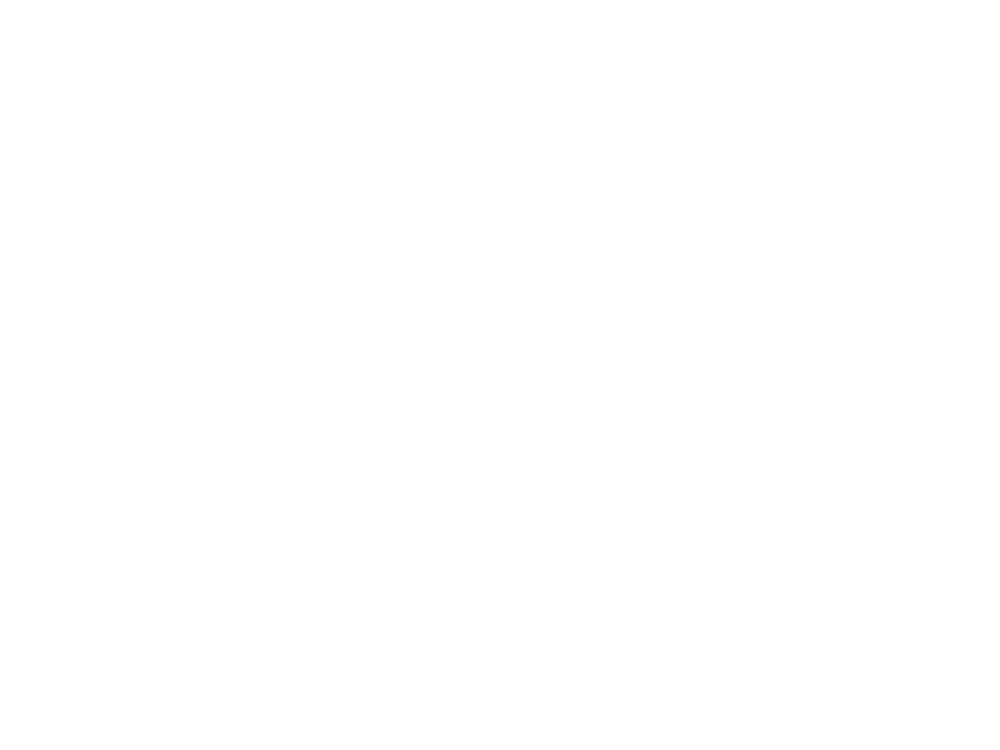

<IPython.core.display.Javascript object>


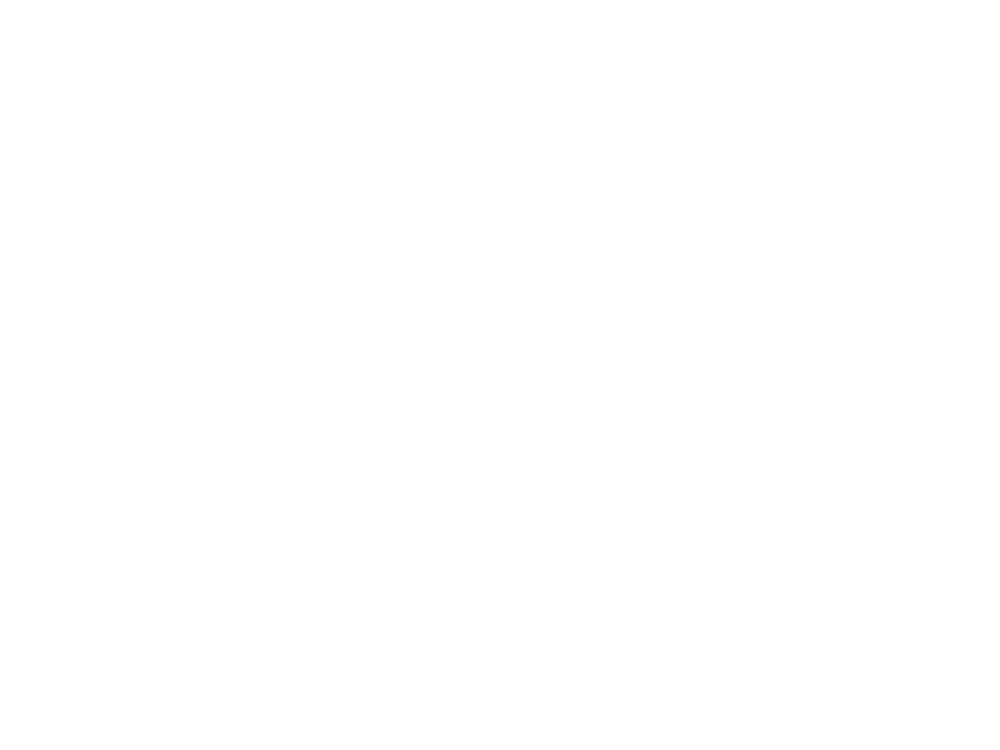

In [27]:
df = pd.read_csv('/home/dana_z/HD1/lfp2ACrot/sessions')
savePath = '/home/dana_z/HD1/lfp2ACrot/'
f = h5py.File('Spectograms.hdf5','r')
freq = f['0761']['freq'].value
dtL = 0.00032768
tPlot = np.linspace(-2,2,int(4/dtL-1))
for per in df.period.unique():
    if per == 'One Month': 
        # remove from figure only because too many outliers (Nan) makes the figure granular
        # data was still used for analysis
        l = getMiceList(Files[1])
        l.remove('1236')
        A,df2 =getAlignedLFP_mvmt(savePath, mice = l, period = per)
    else:
        A,df2 = getAlignedLFP_mvmt(savePath, period = per)
    if A.shape[2] > 1000:
        b = A[:,:,0:1000]
        mu = np.mean(b[:int(b.shape[0]/2),:,:],axis=0)
        Std = np.std(b[:int(b.shape[0]/2),:,:],axis=0)
        b =(b-mu)/Std
        b = np.nansum(b,axis=2)
        for ind in range(0,A.shape[2]//1000):
            c = A[:,:,1000*(ind+1):np.min([A.shape[2],1000*(ind+2)])]
            mu = np.mean(c[:int(c.shape[0]/2),:,:],axis=0)
            Std = np.std(c[:int(c.shape[0]/2),:,:],axis=0)
            c =(c-mu)/Std
            c = np.nansum(c,axis=2)
            b = b+c
        b= b/A.shape[2]
    else:
        b = A
        mu = np.mean(b[:int(b.shape[0]/2),:,:],axis=0)
        Std = np.std(b[:int(b.shape[0]/2),:,:],axis=0)
        b =(b-mu)/Std
        b = np.nanmean(b,axis=2)
    pickle.dump(b, open(figFolder+per+'.p',"wb"),protocol=4)
    del A,b
    b = pickle.load(open(figFolder+per+'.p',"rb"))

    fig, ax = plt.subplots()
    CS=ax.pcolormesh(tPlot,freq,b.T, rasterized=True,vmin = -0.5,vmax = 2.5)
    fig.colorbar(CS)
    ax.set_title(per,fontsize=20)
#     fig.savefig(figFolder+'figure5_'+per+'ACrot_normalizedByonset.png',format='png')
    fig.savefig(figFolder+'figureS3_'+per+'contra.svg',format='svg')
    fig.clf()
    plt.close(fig)



<IPython.core.display.Javascript object>


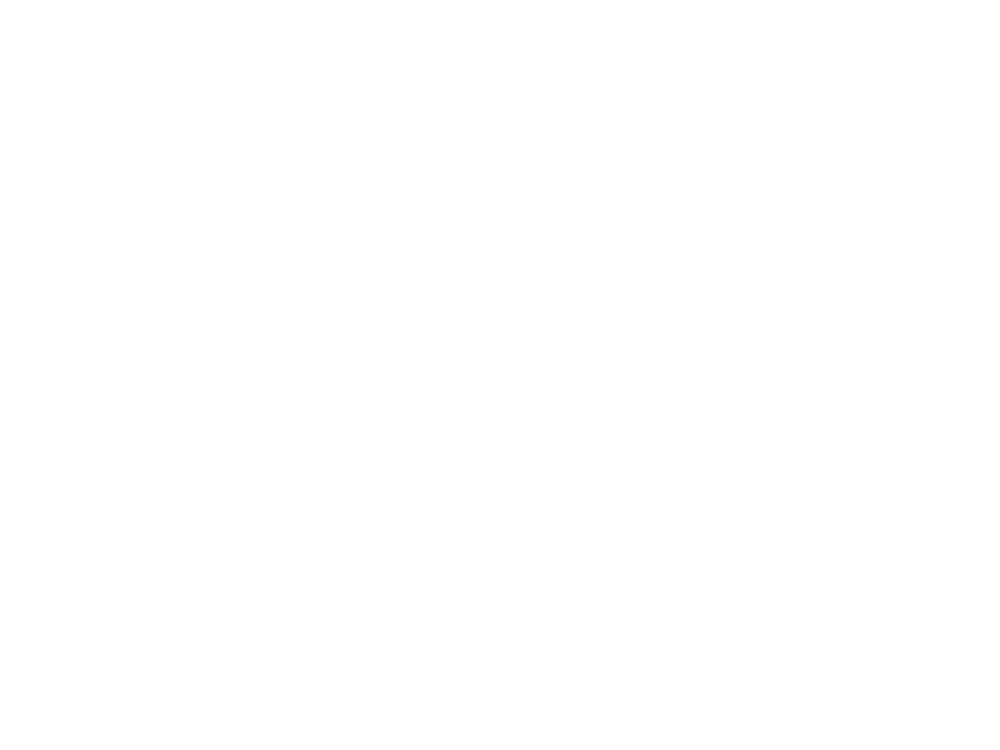

<IPython.core.display.Javascript object>


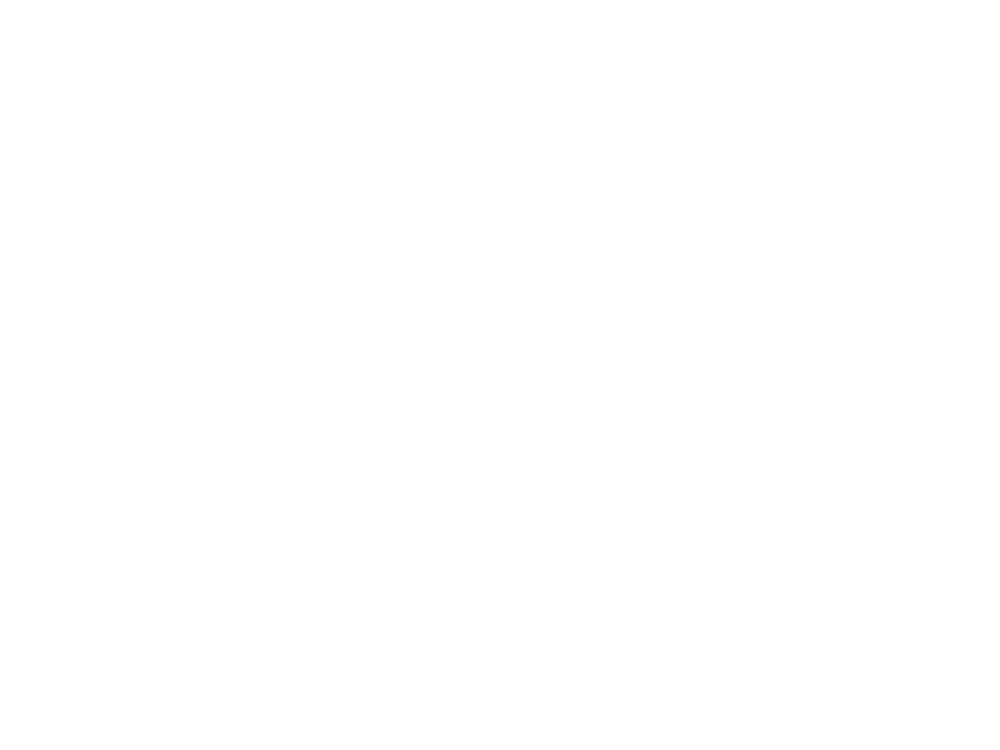

<IPython.core.display.Javascript object>


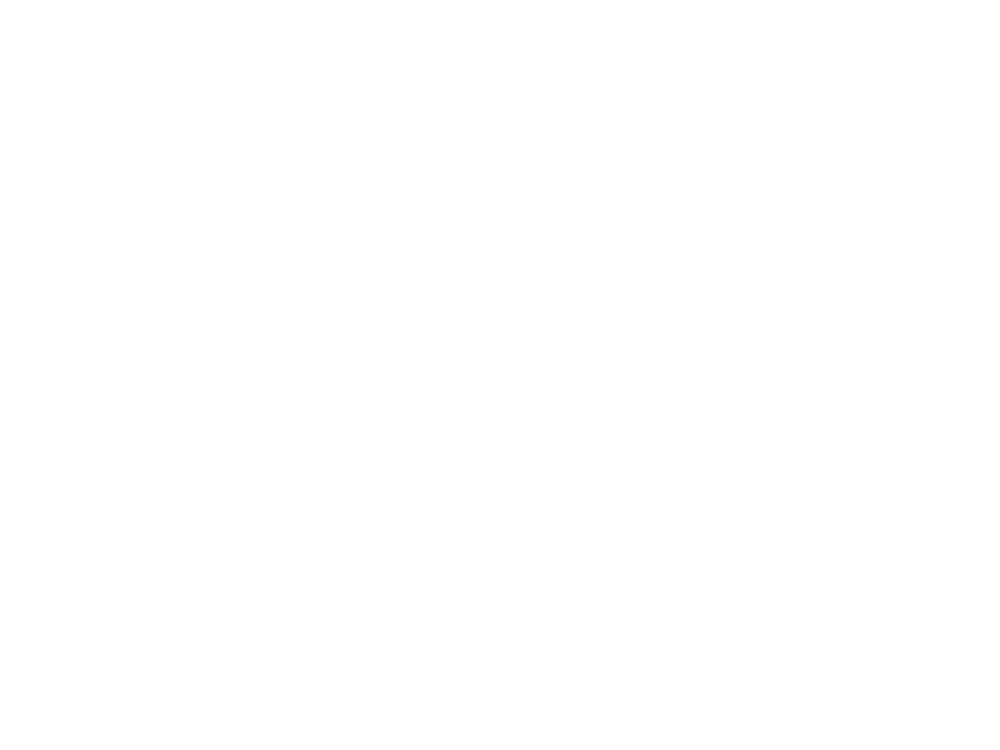

<IPython.core.display.Javascript object>


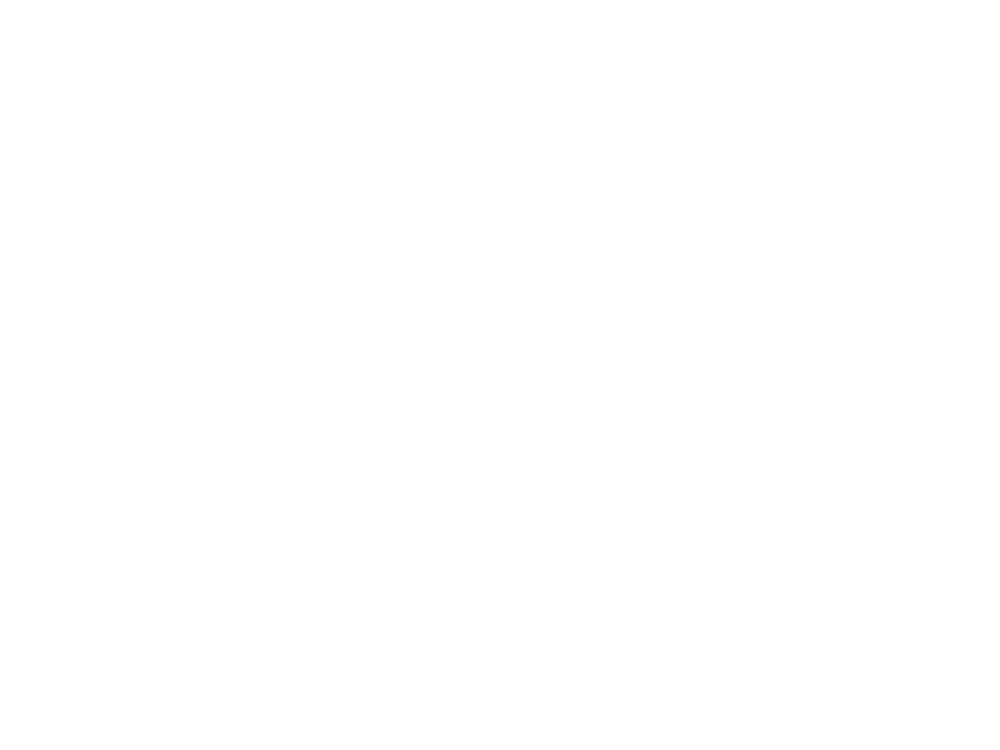

<IPython.core.display.Javascript object>


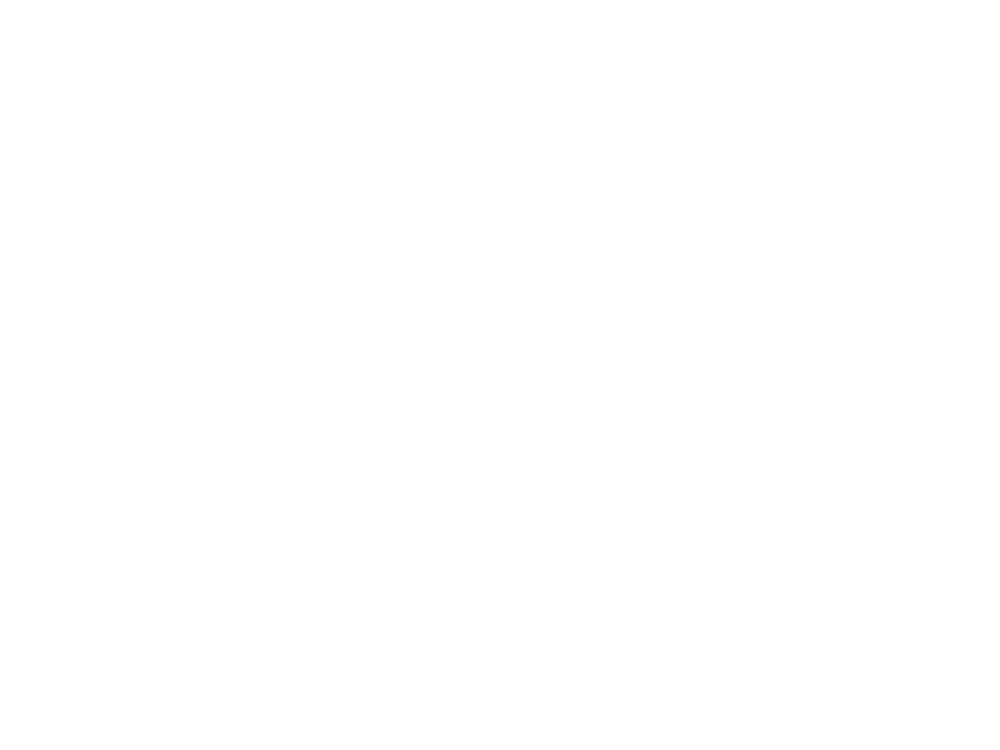

In [29]:
df = pd.read_csv('/home/dana_z/HD1/lfp2ACrot/sessions')
savePath = '/home/dana_z/HD1/lfp2ACrot/'
savePath2 = '/home/dana_z/HD1/lfp2Crot/'

f = h5py.File('Spectograms.hdf5','r')
freq = f['0761']['freq'].value
dtL = 0.00032768
tPlot = np.linspace(-2,2,int(4/dtL-1))
for per in df.period.unique():
    if per == 'One Month': 
        # remove from figure only because too many outliers (Nan) makes the figure granular
        # data was still used for analysis
        l = getMiceList(Files[1])
        l.remove('1236')
        A,df2 =getAlignedLFP_mvmt(savePath, mice = l, period = per)
    else:
        A,df2 = getAlignedLFP_mvmt(savePath, period = per)
    if A.shape[2] > 1000:
        b = A[:,:,0:1000]
        mu = np.mean(b[:int(b.shape[0]/2),:,:],axis=0)
        Std = np.std(b[:int(b.shape[0]/2),:,:],axis=0)
        b =(b-mu)/Std
        b = np.nansum(b,axis=2)
        for ind in range(0,A.shape[2]//1000):
            c = A[:,:,1000*(ind+1):np.min([A.shape[2],1000*(ind+2)])]
            mu = np.mean(c[:int(c.shape[0]/2),:,:],axis=0)
            Std = np.std(c[:int(c.shape[0]/2),:,:],axis=0)
            c =(c-mu)/Std
            c = np.nansum(c,axis=2)
            b = b+c
        b= b/A.shape[2]
    else:
        b = A
        mu = np.mean(b[:int(b.shape[0]/2),:,:],axis=0)
        Std = np.std(b[:int(b.shape[0]/2),:,:],axis=0)
        b =(b-mu)/Std
        b = np.nanmean(b,axis=2)
    del A

    if per == 'One Month': 
        # remove from figure only because too many outliers (Nan) makes the figure granular
        # data was still used for analysis
        l = getMiceList(Files[1])
        l.remove('1236')
        A,df2 =getAlignedLFP_mvmt(savePath2, mice = l, period = per)
    else:
        A,df2 = getAlignedLFP_mvmt(savePath2, period = per)
    if A.shape[2] > 1000:
        b2 = A[:,:,0:1000]
        mu = np.mean(b2[:int(b2.shape[0]/2),:,:],axis=0)
        Std = np.std(b2[:int(b2.shape[0]/2),:,:],axis=0)
        b2 =(b2-mu)/Std
        b2 = np.nansum(b2,axis=2)
        for ind in range(0,A.shape[2]//1000):
            c = A[:,:,1000*(ind+1):np.min([A.shape[2],1000*(ind+2)])]
            mu = np.mean(c[:int(c.shape[0]/2),:,:],axis=0)
            Std = np.std(c[:int(c.shape[0]/2),:,:],axis=0)
            c =(c-mu)/Std
            c = np.nansum(c,axis=2)
            b2 = b2+c
        b2= b2/A.shape[2]
    else:
        b2 = A
        mu = np.mean(b2[:int(b2.shape[0]/2),:,:],axis=0)
        Std = np.std(b2[:int(b2.shape[0]/2),:,:],axis=0)
        b2 =(b2-mu)/Std
        b2 = np.nanmean(b2,axis=2)    
    del A
    
    B = b-b2
    fig, ax = plt.subplots()
    CS=ax.pcolormesh(tPlot,freq,B.T, rasterized=True, vmin = -1, vmax = 1.5)
    fig.colorbar(CS)
    ax.set_title(per,fontsize=20)
#     fig.savefig(figFolder+'figure5_'+per+'ACrot_normalizedByonset.png',format='png')
    fig.savefig(figFolder+'figureS3_'+per+'diff.svg',format='svg')
    fig.clf()
    plt.close(fig)



In [54]:
f = h5py.File('membership.hdf5','r')
miceList = getMiceList(Files[1])
col_names = ['Sess','Mouse','Period','Day','CellType']
df = pd.DataFrame(columns=col_names)
for m in miceList:
    grp = f[m]
    sessions = list(grp.keys())
    for sess in sessions:
        try:
            data = grp[sess]['mvmtOnset']['result'].value
            meanR_mvmtOnset = np.mean(data,axis=1)
        except:
            print(sess,'mvmt')
            meanR_mvmtOnset = np.nan
            
        try:
            data = grp[sess]['ipsiOnset']['result'].value
            meanR_ipsiOnset = np.mean(data,axis=1)
        except:
            print(sess,'ipsi')
            meanR_ipsiOnset = np.nan
            
        try:
            data = grp[sess]['contraOnset']['result'].value
            meanR_contraOnset = np.mean(data,axis=1)
        except:
            print(sess,'contra')
            meanR_contraOnset =np.nan
        
        if sess[5] == 'B':
                day = 0
        else:
            day = int(re.findall(r'\d+',sess[5:])[0])
        cre = getCreType(Files[1],m)
        nRed = getNumRed(Files[1],m,sess[5:])
        try:
            df2 = pd.DataFrame({'Sess':sess,'Mouse':m,'Period':periodCalc(day),
                                'Day':day,'CellType':'MSN',
                                'meanR_mvmtOnset':meanR_mvmtOnset,
                                'meanR_ipsiOnset':meanR_ipsiOnset,
                                'meanR_contraOnset':meanR_contraOnset})
        except:
            df2 = pd.DataFrame({'Sess':sess,'Mouse':m,'Period':periodCalc(day),
                                'Day':day,'CellType':'MSN',
                                'meanR_mvmtOnset':meanR_mvmtOnset,
                                'meanR_ipsiOnset':meanR_ipsiOnset,
                                'meanR_contraOnset':meanR_contraOnset},index = [0])
        df2.loc[:nRed-1,'CellType'] = cre
        df = pd.concat([df,df2],sort=True)

0761_day10 contra
0761_day12 contra
0761_day19L contra
0761_day2 contra
0761_day31A contra
0761_day35L mvmt
0761_day35L contra
0761_day6 contra
0761_day8 contra
1208_day15A contra
1208_day19L contra
1208_day2 contra
1208_day34L contra
1222_day11 ipsi
1222_day20L ipsi
1222_day36L contra
1222_day5 mvmt
1222_day5 ipsi
1231_BaselineL ipsi
1231_BaselineS ipsi
1236_day13 contra
1793_BaselineA contra
1793_day12 contra
1793_day14 contra
2976_BaselineA ipsi
2976_day14 contra
2976_day35L contra
2976_day8 ipsi
2976_day8 contra
2980_day14 contra
2980_day15A ipsi
2980_day19L contra
2980_day8 contra
2981_day10 ipsi
2981_day12 ipsi
2981_day15A contra
2981_day2 ipsi
2981_day6 ipsi
2981_day8 ipsi
4539_BaselineA ipsi
4539_day1 ipsi
4539_day1 contra
4539_day10 ipsi
4539_day10 contra
4539_day11 ipsi
4539_day11 contra
4539_day12 ipsi
4539_day12 contra
4539_day13 ipsi
4539_day13 contra
4539_day14 ipsi
4539_day14 contra
4539_day2 ipsi
4539_day2 contra
4539_day3 ipsi
4539_day3 contra
4539_day30A ipsi
4539_day

In [55]:
df2 = df
df2['care'] = df2.meanR_mvmtOnset.apply(lambda x: x>0.05)
df2['care_ipsi'] = df2.meanR_ipsiOnset.apply(lambda x: x>0.05)
df2['care_contra'] = df2.meanR_contraOnset.apply(lambda x: x>0.05)

df2 = df2.groupby(['Sess','Period','CellType']).mean()
df2.reset_index(inplace=True)


<IPython.core.display.Javascript object>


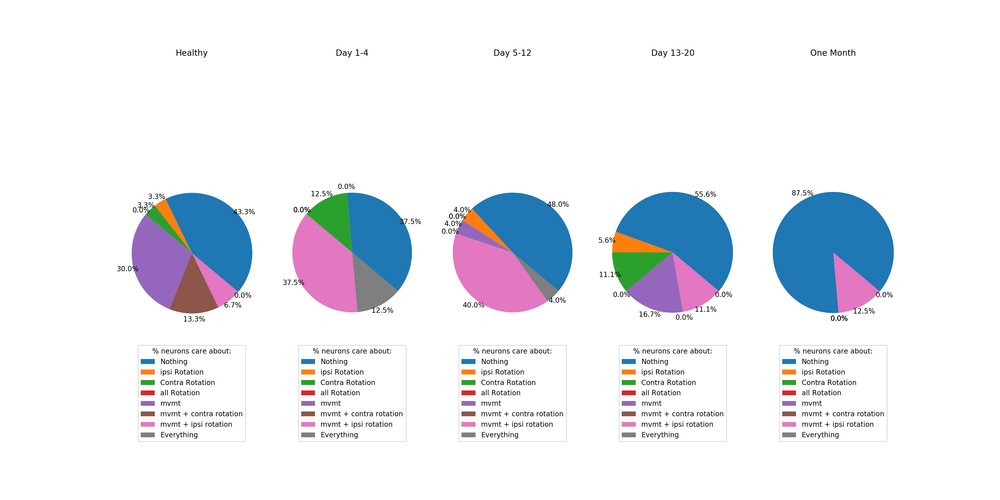

<IPython.core.display.Javascript object>


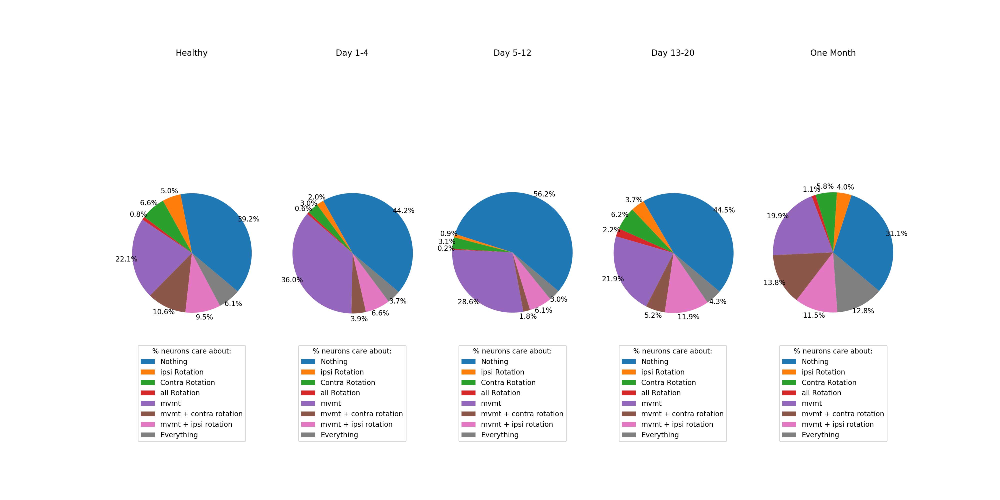

<IPython.core.display.Javascript object>


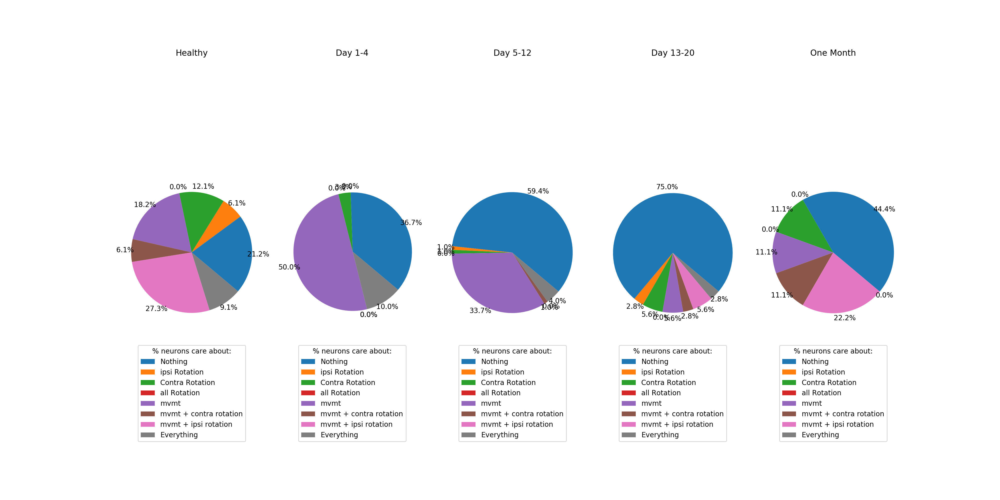

In [58]:
%matplotlib notebook
# N = 5
# for sig in ['sig','sig_ipsi','sig_contra']:
#     for cell in df.CellType.unique():
#         df3 = df[(df.CellType ==cell)]
#         dfHealthy = df3[df3.Period == 'Healthy']
#         yesVals = []
#         noValse = []
#         for period in df3.Period.unique():
#             dfComp = df3[df3.Period == period]
#             print(sig,cell,period)
#             oddsratio, pvalue = sci.stats.fisher_exact([[dfHealthy[dfHealthy[sig] == True].sig.count(), dfHealthy[dfHealthy[sig] == False].sig.count()], [dfComp[dfComp[sig] == True].sig.count(), dfComp[dfComp[sig] == False].sig.count()]])
#             print(pvalue, pvalue<0.05/(N-1))
     
a = df.groupby(['care','care_ipsi','care_contra']).Day.count()
levels = [a.index.levels[0].values, a.index.levels[1].values,a.index.levels[2].values]
new_index = pd.MultiIndex.from_product(levels, names=a.index.names)

my_labels = ['Nothing','ipsi Rotation','Contra Rotation','all Rotation','mvmt','mvmt + contra rotation',
                 'mvmt + ipsi rotation','Everything']
# fig, ax  = plt.subplots(1,5,figsize=(10, 10))
for cell in df.CellType.unique():
    inds = 0;
    fig, ax  = plt.subplots(1,5,figsize=(20, 10))
    for period in df.Period.unique():

        dfPlot = df[(df.CellType == cell)&(df.Period == period)].groupby(['care','care_ipsi','care_contra']).Day.count()
        dfPlot = dfPlot.reindex(new_index, fill_value=0)

        wedges, texts, autotexts =ax[inds].pie(dfPlot,startangle=-40,autopct='%1.1f%%',pctdistance=1.1)


    #           bbox_to_anchor=(1, 0, 0.5, 1))
    #     plt.setp(texts, fontsize=25)
        ax[inds].set_title(period)
        ax[inds].axis('equal')

        
        ax[inds].legend(wedges, my_labels,
                  title="% neurons care about:",
                  loc="lower center")
        inds = inds+1
    fig.savefig(figFolder+'figureS4_'+cell+'.svg',transparent=True,format='svg')
#     for sig in ['care','care_ipsi','care_contra']:
#         df3 = df[(df.CellType ==cell)]
#         dfHealthy = df3[df3.Period == 'Healthy']
#         yesVals = []
#         noValse = []
#         for period in df3.Period.unique():
#             dfComp = df3[df3.Period == period]
           
#             oddsratio, pvalue = sci.stats.fisher_exact([[dfHealthy[dfHealthy[sig] == True].sig.count(), dfHealthy[dfHealthy[sig] == False].sig.count()], [dfComp[dfComp[sig] == True].sig.count(), dfComp[dfComp[sig] == False].sig.count()]])
#             if cell == 'MSN':
#                 print(sig,cell,period)
#                 print(pvalue, pvalue<0.05/(N-1))
#                 print('healthy:', dfHealthy[dfHealthy[sig] == True].sig.count(),dfHealthy.sig.count(),dfHealthy[dfHealthy[sig] == True].sig.count()/dfHealthy.sig.count())
#                 print('vs. ', dfComp[dfComp[sig] == True].sig.count(), dfComp.sig.count(),dfComp[dfComp[sig] == True].sig.count()/dfComp.sig.count())
            
#df.groupby(['CellType','Period','sig','sig_ipsi','sig_contra']).count()

In [ ]:
# look at individual neurons - only run once
f = h5py.File('/home/dana_z/HD1/connactivityAnalysis/connMapsMvmt.hdf5','a')
mvmtType = {'highIpsi':"getOnsetOrPeriod(m,sess,'Pre','hiACRotPeriods_vector')",
            'highContra':"getOnsetOrPeriod(m,sess,'Pre','hiCRotPeriods_vector')",
            'lowRot':"getOnsetOrPeriod(m,sess,'Pre','loRotPeriods_vector')",
            'lowSpeed':"getOnsetOrPeriod(m,sess,'Pre','LowMvmtPeriods_vector')",
            'hiSpeed':"getOnsetOrPeriod(m,sess,'Pre','HighMvmtPeriods_vector')"}

numshifts = 1000
for m in tqdm(miceList):
    grp = f.create_group(m)
    data =  getData(Files[1],['trace'],period ='Pre', mice=m)
    
       
    cre = getCreType(Files[1],m)
    for sess in tqdm(data.keys()): 
        if sess in grp.keys():
            continue
        subgrp = grp.create_group(sess)

        if sess[5] == 'B':
            day = 0
        else:
            day = int(re.findall(r'\d+',sess[5:])[0])

        numRed = int(data[sess]['trace']['numred']) 

        subgrp.attrs['numRed'] = numRed
        subgrp.attrs['day'] = day
        subgrp.attrs['period'] = periodCalc(day)
        
        ssubgrp2 = subgrp.create_group('Pre')    
#         try:  
        Ca_ori = getOnsetOrPeriod(m,sess,'Pre','caOnset_Hf')            
        dff_ori = data[sess]['trace']['dff']   

        for mv in mvmtType.keys():    
            mVector = eval(mvmtType[mv])
            if np.sum(mVector)==0:
                ssubgrp = ssubgrp2.create_group(mv)
                ssubgrp['aSymCorr'] = 0
                ssubgrp['pearson'] = 0
                ssubgrp['pearsonF'] = 0
                continue
            
            if len(mVector)<Ca_ori.shape[1]:
                mVector = np.append(mVector,0)

            Ca = Ca_ori[:,(mVector>0)]
            dff = dff_ori[:,(mVector>0)]

            cor = np.dot(Ca ,Ca.T)/np.sum(Ca,axis=1) # Do the actual co-occorence matrix not np.corrcoef(Ca)
            cor2 = np.corrcoef(Ca)
            cor3 = np.corrcoef(dff)


            ssubgrp = ssubgrp2.create_group(mv)
            ssubgrp['aSymCorr'] = cor
            ssubgrp['pearson'] = cor2
            ssubgrp['pearsonF'] = cor3

            sCor = np.empty((cor.shape[0],cor.shape[1],numshifts))
            sCor2 = np.empty((cor.shape[0],cor.shape[1],numshifts))
            sCor3 = np.empty((cor.shape[0],cor.shape[1],numshifts))
            for s in range(0,numshifts):
                shifts = np.random.randint(size= Ca.shape[0],low=0,high=Ca.shape[1])
                Ca2 = circShiftRoll(shifts,Ca)
                dff2 = circShiftRoll(shifts,dff)
                sCor2[:,:,s] = np.corrcoef(Ca2)
                sCor[:,:,s] = np.dot(Ca2 ,Ca2.T)/np.sum(Ca2,axis=1)
                sCor3[:,:,s] = np.corrcoef(dff2)
            ssubgrp['aSymCorr_shuffle'] = sCor
            ssubgrp['pearson_shuffle'] = sCor2
            ssubgrp['pearsonF_shuffle'] = sCor3
            del sCor
            del sCor2
            del sCor3
#         except:
#             print(sess)
f.close()

In [76]:
f = h5py.File('/home/dana_z/HD1/connactivityAnalysis/connMapsMvmt.hdf5','a')
col_names = ['Mouse','Sess','Day','numred','Period','population','mvmt','personF','sPersonF']
df = pd.DataFrame(columns = col_names)
for m in f.keys():
    for sess in f[m].keys():
        for mvmt in f[m][sess]['Pre'].keys():
            try:
                numred = f[m][sess].attrs['numRed']
                cre = getCreType(Files[1],m)
                tempDict = {'Mouse':m,'Sess':sess,'Day':f[m][sess].attrs['day'],
                                    'numred':numred,'Period':f[m][sess].attrs['period']}

                c = f[m][sess]['Pre'][mvmt]['pearson'].value 
                c[np.tril(c,-1)==0] = np.nan

                d = f[m][sess]['Pre'][mvmt][('pearson_shuffle')].value
                d = np.nanmean(d,axis=2)
                d[np.tril(d,-1)==0] = np.nan

                if numRed > 1:
                    tempDict['population'] = cre+'-'+cre
                    tempDict['mvmt'] = mvmt
                    tempDict['aSymCorr'] = np.nanmean(c[:numred,:numred])
                    tempDict['sASymCorr'] = np.nanmean(d[:numred,:numred])
                    df2 = pd.DataFrame([tempDict])
                    df = pd.concat([df,df2],sort=True)
                if numRed > 0:
                    tempDict['mvmt'] = mvmt
                    tempDict['population'] = 'MSN-'+cre
                    tempDict['aSymCorr'] = np.nanmean(c[numred:,:numred])
                    tempDict['sASymCorr'] = np.nanmean(d[numred:,:numred])
                    df2 = pd.DataFrame([tempDict])
                    df = pd.concat([df,df2],sort=True)
                
                tempDict['mvmt'] = mvmt
                tempDict['population'] = 'MSN-MSN'
                tempDict['aSymCorr'] = np.nanmean(c[numred:,numred:])
                tempDict['sASymCorr'] = np.nanmean(d[numred:,numred:])
                df2 = pd.DataFrame([tempDict])
                df = pd.concat([df,df2],sort=True)
            except Exception as e:
                exc_type, exc_obj, exc_tb = sys.exc_info()
                print(sess,'-',mvmt,exc_tb.tb_lineno,c.shape)
f.close()
df.to_csv('mvmtCorr.csv')

0761_day31A - highContra 14 ()
0761_day35L - hiSpeed 14 ()
0761_day35L - highContra 14 ()
1208_day2 - highContra 14 ()
1208_day30A - highContra 14 ()
1208_day34L - highContra 14 ()
1222_day2 - hiSpeed 14 ()
1222_day2 - highContra 14 ()
1222_day2 - highIpsi 14 ()
1222_day2 - lowRot 14 ()
1222_day2 - lowSpeed 14 ()
1236_day15A - highIpsi 14 ()
1236_day19L - highIpsi 14 ()
1236_day30A - highIpsi 14 ()
2980_day19L - highContra 14 ()
2981_day2 - highIpsi 14 ()
4539_day1 - highContra 14 ()
4539_day1 - highIpsi 14 ()
4539_day10 - highContra 14 ()
4539_day10 - highIpsi 14 ()
4539_day11 - highContra 14 ()
4539_day11 - highIpsi 14 ()
4539_day12 - highContra 14 ()
4539_day12 - highIpsi 14 ()
4539_day13 - highContra 14 ()
4539_day13 - highIpsi 14 ()
4539_day14 - highContra 14 ()
4539_day14 - highIpsi 14 ()
4539_day2 - highContra 14 ()
4539_day2 - highIpsi 14 ()
4539_day3 - highContra 14 ()
4539_day3 - highIpsi 14 ()
4539_day4 - highContra 14 ()
4539_day4 - highIpsi 14 ()
4539_day5 - highContra 14 

<IPython.core.display.Javascript object>


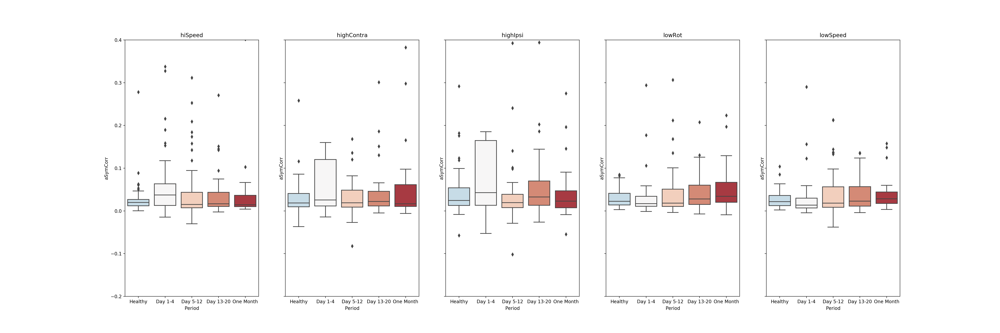

In [117]:
fig, ax  = plt.subplots(1,5,figsize=(30, 10),sharey = True)
indF = 0;
for mvmt in df.mvmt.unique():
    with sns.color_palette(colorPallet3):
        sns.boxplot(x="Period", y="aSymCorr",ax = ax[indF],data=df[(df.population == "MSN-MSN")&(df.mvmt == mvmt)], order = ['Healthy', 'Day 1-4', 'Day 5-12', 'Day 13-20', 'One Month'])
        ax[indF].set_title(mvmt)
        indF = indF + 1
fig.savefig(figFolder+'figureS5.svg',format='svg')
ax[0].set_ylim(-0.2,0.4)
fig.savefig(figFolder+'figureS5_zoom.svg',format='svg')
# fig, ax  = plt.subplots(1,5,figsize=(30, 10),sharey = True)
# indF = 0;
# for p in df.Period.unique():
    
#     sns.boxplot(x="mvmt", y="aSymCorr",ax = ax[indF],data=df[(df.population == "MSN-MSN")&(df.Period == p)], order = ['hiSpeed', 'lowSpeed', 'lowRot', 'highIpsi', 'highContra'], showfliers = False)
#     ax[indF].set_title(p)
#     indF = indF + 1


In [105]:
df[(df.population == 'MSN-CHI')&(df.numred>0)].groupby(['mvmt','Period']).count() #(df.Period == 'Day 1-4')&

Day  Mouse  Sess  aSymCorr  numred  personF  population  \
mvmt       Period                                                               
hiSpeed    Day 1-4      6      6     6         2       6        0           6   
           Day 13-20   10     10    10         6      10        0          10   
           Day 5-12    15     15    15         7      15        0          15   
           Healthy     15     15    15        14      15        0          15   
           One Month    4      4     4         2       4        0           4   
highContra Day 1-4      5      5     5         0       5        0           5   
           Day 13-20   10     10    10         3      10        0          10   
           Day 5-12    14     14    14         2      14        0          14   
           Healthy     15     15    15        10      15        0          15   
           One Month    2      2     2         0       2        0           2   
highIpsi   Day 1-4      6      6     6         2       6        0           6   
           Day 13-20   10     10    10         7      10        0          10   
           Day 5-12    15     15    15         6      15        0          15   
           Healthy     15     15    15        12      15        0          15   
           One Month    5      5     5         3       5        0           5   
lowRot     Day 1-4      6      6     6         3       6        0           6   
           Day 13-20   10     10    10         6      10        0          10   
           Day 5-12    15     15    15         8      15        0          15   
           Healthy     15     15    15        14      15        0          15   
           One Month    5      5     5         3       5        0           5   
lowSpeed   Day 1-4      6      6     6         3       6        0           6   
           Day 13-20   10     10    10         6      10        0          10   
           Day 5-12    15     15    15         9      15        0          15   
           Healthy     15     15    15        13      15        0          15   
           One Month    5      5     5         3       5        0           5   

                      sASymCorr  sPersonF  
mvmt       Period                          
hiSpeed    Day 1-4            2         0  
           Day 13-20          6         0  
           Day 5-12           7         0  
           Healthy           14         0  
           One Month          2         0  
highContra Day 1-4            0         0  
           Day 13-20          3         0  
           Day 5-12           2         0  
           Healthy           10         0  
           One Month          0         0  
highIpsi   Day 1-4            2         0  
           Day 13-20          7         0  
           Day 5-12           6         0  
           Healthy           12         0  
           One Month          3         0  
lowRot     Day 1-4            3         0  
           Day 13-20          6         0  
           Day 5-12           8         0  
           Healthy           14         0  
           One Month          3         0  
lowSpeed   Day 1-4            3         0  
           Day 13-20          6         0  
           Day 5-12           9         0  
           Healthy           13         0  
           One Month          3         0

<h1> Extra Analysis - might be added to paper later